### SGD Optimizer Effect

In [1]:
%matplotlib inline

In [2]:
# pip install tensorflow-gpu

### Imports

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
# !cd /content/drive/My\ Drive/BTP/RandomInit/2D_FINAL/
# DRIVE_PATH = '/content/drive/My\ Drive/BTP/RandomInit/2D_FINAL/'

In [5]:
from __future__ import print_function, division
import numpy as np 
import sklearn
import json
from sklearn import datasets
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout
from tensorflow.keras.layers import BatchNormalization, Activation, ZeroPadding2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Nadam
import tensorflow.keras.backend as K
import os
from functools import partial
from scipy import stats
import matplotlib.pyplot as plt
import sys
import numpy as np
import pickle

In [6]:
tf.random.set_seed(53)

In [7]:
os.environ["CUDA_VISIBLE_DEVICES"]="0"

### Synthetic 2D Datsasets

In [8]:
def gaussian_8_modes(BATCH_SIZE=64):
    scale = 2.
    centers = [
        (1, 0),
        (-1, 0),
        (0, 1),
        (0, -1),
        (1. / np.sqrt(2), 1. / np.sqrt(2)),
        (1. / np.sqrt(2), -1. / np.sqrt(2)),
        (-1. / np.sqrt(2), 1. / np.sqrt(2)),
        (-1. / np.sqrt(2), -1. / np.sqrt(2))
    ]
    centers = [(scale * x, scale * y) for x, y in centers]
    while True:
        dataset = []
        for i in range(BATCH_SIZE):
            point = np.random.randn(2) * .02
            center = centers[np.random.choice(len(centers))]
            point[0] += center[0]
            point[1] += center[1]
            dataset.append(point)
        dataset = np.array(dataset, dtype='float32')
        dataset /= 1.414  
        return dataset
      
def gaussian_9_modes(BATCH_SIZE):
    dataset = []
    for i in range(int((90000 / 9))):
        for x in range(-3, 3,2):
            for y in range(-3, 3,2):
                point = np.random.randn(2) * 0.05
                point[0] += 2 * x
                point[1] += 2 * y
                dataset.append(point)
    dataset = np.array(dataset, dtype='float32')
    np.random.shuffle(dataset)
    dataset /= 2.828  

    return dataset
    
def swiss_roll(BATCH_SIZE):
    batch_data = sklearn.datasets.make_swiss_roll(n_samples=BATCH_SIZE, noise=0.25)[0]
    batch_data = batch_data.astype(np.float32)[:, [0, 2]]
    batch_data /= 7.5
    return batch_data
    
def load_data(dataset,DATASET_SIZE):
    if(dataset == '8_modes'):
        return gaussian_8_modes(DATASET_SIZE)
    elif(dataset == '9_modes'):
        return gaussian_9_modes(DATASET_SIZE)
    elif(dataset=='swiss_roll'):
        return swiss_roll(DATASET_SIZE)
    else:
        print('Invalid Dataset')
        exit(0)

### Loss Functions

In [9]:
bce = tf.keras.losses.BinaryCrossentropy()

def ns_loss(y_true,y_pred):
  return -tf.math.log(y_pred+1e-8)


### Utility

In [10]:

def kde(values, fig_size=(8, 8), bbox=[-2, 2, -2, 2], xlabel="", ylabel="", cmap='BuPu', show=False, save=None):
    
    fig, ax = plt.subplots(figsize=fig_size)
    
    kernel = stats.gaussian_kde(values)

    ax.axis(bbox)
    xx, yy = np.mgrid[bbox[0]:bbox[1]:300j, bbox[2]:bbox[3]:300j]
    positions = np.vstack([xx.ravel(), yy.ravel()])
    f = np.reshape(kernel(positions).T, xx.shape)
    cfset = ax.contourf(xx, yy, f, cmap=cmap)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

    if save is not None: plt.savefig(save,bbox_inches='tight')
    if show: plt.show()

    plt.close()

    
def dim_vis(D, fig_size=(8, 8), bbox=[-2, 2, -2, 2], xlabel="", ylabel="", cmap='BuPu', 
            color_range=False, show=False, save=None, device='cpu'):

    fig, ax = plt.subplots(figsize=fig_size)
    ax.axis(bbox)
    xx, yy = np.mgrid[bbox[0]:bbox[1]:300j, bbox[2]:bbox[3]:300j]
    positions = np.vstack([xx.ravel(), yy.ravel()])
    f = np.reshape(D(positions.T).numpy().T, xx.shape)
    if color_range:
        cfset = ax.contourf(xx, yy, f, levels=np.linspace(0.35, 0.65, 100), cmap=cmap)
    else:
        cfset = ax.contourf(xx, yy, f, 100, cmap=cmap)

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    cbar = fig.colorbar(cfset,fraction=0.046, pad=0.04)
    if color_range: 
        seq = [0.35, f.min(), f.mean(), f.max(), 0.65]
        cbar.set_ticks(seq)
        cbar.set_ticklabels(['%.2f' % val for val in np.round(seq, 2)])
        cbar.ax.tick_params(labelsize=22)
        #cbar.set_ticks(np.linspace(0., 1., 11))
    else:
        cbar.set_ticks(np.linspace(f.min(), f.max(), 5))
        cbar.set_ticklabels(['%.2f' % val for val in np.round(np.linspace(f.min(), f.max(), 5), 2)])
    if save is not None: plt.savefig(save,bbox_inches='tight')
    if show: plt.show()

    plt.close()

    

### Log Data

In [11]:
duality_gaps = {}
M1 = {}
M2 = {}
bbox=[-3, 3, -3,3]  

### Model Definitions

#### Parent GAN Class

In [12]:
class GAN():
    def __init__(self):
        self.latent_dim = 100
        self.img_shape = (2,)
        
        optimizer = Adam(1e-4, 0.5)
        dg_optimizer = SGD(5e-4,0.75)
        
        self.d_updates = 1
        self.g_updates = 1
        self.name      = 'GAN'
        self.setting   = 'convergence'
        self.discriminator = self.build_discriminator()
        
        self.discriminator.compile(loss=bce,
            optimizer=optimizer,
            metrics=['accuracy'])
        
        optimizer = Adam(5e-2, 0.5)
        self.generator = self.build_generator()
        z              = Input(shape=(self.latent_dim,))
        img            = self.generator(z)
        self.discriminator.trainable = False
        valid          = self.discriminator(img)
        self.combined  = Model(z, valid)
        self.combined.compile(loss=bce, optimizer=optimizer)

        
        self.D_norm = []
        self.G_norm = []
        self.D_var = []
        self.G_var = []
        
        init_var_d = [0.1 for i in range(len(self.discriminator.get_weights()))]
        init_var_g = [0.1 for i in range(len(self.generator.get_weights()))]
        
        self.D_var.append(init_var_d)
        self.G_var.append(init_var_g)
        #--------------------------------------------------------------------
        #                      DUALITY GAP
        #--------------------------------------------------------------------
        optimizer = Adam(5e-4, 0.5)
        self.dg_discriminator = self.build_discriminator()
        self.dg_discriminator.compile(loss=bce,
            optimizer=dg_optimizer,
            metrics=['accuracy'])

        optimizer = Adam(5e-4, 0.5)
        dg_optimizer = SGD(5e-4,0.75)
        
        self.dg_generator = self.build_generator()
        z                 = Input(shape=(self.latent_dim,))
        img               = self.dg_generator(z)
        self.dg_discriminator.trainable = False
        valid             = self.dg_discriminator(img)
        self.dg_combined  = Model(z, valid)
        self.dg_combined.compile(loss=bce, optimizer=dg_optimizer)

    def configure_setting(self,setting):
          
        if(setting=='convergence'):
          self.setting = 'convergence'
          self.d_updates = 1
          self.g_updates = 1

        elif(setting=='mode_collapse'):
          self.setting = 'mode_collapse'
          self.d_updates = 15
          self.g_updates = 1
        
        elif(setting=='divergence'):
          self.setting = 'divergence'
          self.d_updates = 1
          self.g_updates = 1
        else:
          return "Invalid Setting"
          
    def build_generator(self):
        model = Sequential()
        model.add(Dense(128 , input_dim=self.latent_dim))
        model.add(Activation("relu"))
        model.add(Dense(128 ))
        model.add(Activation("relu"))
        model.add(Dense(2 , activation=None))
#         model.summary()
        noise = Input(shape=(self.latent_dim,))
        img   = model(noise)

        return Model(noise, img)

    def build_discriminator(self):
        model = Sequential()
        model.add(Dense(128 , input_dim=2))
        model.add(Activation("relu"))
        model.add(Dense(128 ))
        model.add(Activation("relu"))
        model.add(Dense(1, activation='sigmoid'))
#         model.summary()
        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)


    def duality_gap(self):
        
        DG = {}
        M1 = {}
        M2 = {}
        
        M_u_v_worst = 0
        M_u_worst_v = 0

        self.dg_train_d(random=False)
        M_u_v_worst =  self.score()
        self.dg_train_g(random=False)
        M_u_worst_v =  self.score()
        
        DG['vanilla'] = M_u_v_worst - M_u_worst_v
        M1['vanilla'] = M_u_v_worst
        M2['vanilla'] = M_u_worst_v
        
        self.dg_train_d(random=True)
        M_u_v_worst =  self.score()
        self.dg_train_g(random=True)
        M_u_worst_v =  self.score()
        
        DG['local_random'] = M_u_v_worst - M_u_worst_v
        M1['local_random'] = M_u_v_worst
        M2['local_random'] = M_u_worst_v
        
        return DG,M1,M2

    def score(self):
        nsamples = 128
        ntrials  = 100

        scores = []
        for i in range(ntrials):
          idx = np.random.randint(0, self.X.shape[0], nsamples)
          X = tf.convert_to_tensor(self.X[idx])
          noise = tf.convert_to_tensor(np.random.normal(0, 1, (nsamples, self.latent_dim)),dtype=tf.float32)
          score = tf.reduce_mean( tf.math.log(self.dg_discriminator(X)+1e-4)) + tf.reduce_mean(tf.math.log(abs(1 - self.dg_combined(noise)+1e-4)))
          scores.append(score)
        return np.average(scores)

    def dg_train_g(self, epochs=250, batch_size=64, save_interval=50,random=False):
        
        
        if(self.setting=='convergence'):
           std = 0.1
        if(self.setting=='divergence'):
           std = 1.0
        if(self.setting=='mode_collapse'):
           std = 0.10
        
        if(self.e < 500):
            std = 1.0
        if(random):
            random_weight_init = [ w + np.random.normal(size=w.shape,scale=std).reshape(w.shape) for i,w in enumerate(self.generator.get_weights())]
#             random_weight_init = [ w + np.random.normal(size=w.shape,scale=0.1*np.sqrt(np.asarray(self.G_var)[-1,i])).reshape(w.shape) for i,w in enumerate(self.generator.get_weights())]
            self.dg_generator.set_weights(random_weight_init)
        else:
            self.dg_generator.set_weights(self.generator.get_weights())
        
        self.dg_discriminator.set_weights(self.discriminator.get_weights())
        
        valid = self.get_valid_label(batch_size)
        fake  = self.get_fake_label(batch_size)

        print(" M2 - Random : {}".format(random))
        progbar = tf.keras.utils.Progbar(epochs)
        for epoch in range(1,epochs):
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            g_loss = self.dg_combined.train_on_batch(noise, valid)
            progbar.update(epoch)

    def dg_train_d(self, epochs=250, batch_size=64, save_interval=50,random=False):
        
        if(self.setting=='convergence'):
           std = 0.1
        if(self.setting=='divergence'):
           std = 1.0
        if(self.setting=='mode_collapse'):
           std = 0.10
        
        if(self.e < 500):
            std = 1.0
        if(random):
            random_weight_init = [ w + np.random.normal(size=w.shape,scale=std).reshape(w.shape) for i,w in enumerate(self.discriminator.get_weights())]
#             random_weight_init = [ w + np.random.normal(size=w.shape,scale=0.1*np.sqrt(np.asarray(self.D_var)[-1,i])).reshape(w.shape) for i,w in enumerate(self.discriminator.get_weights())]
            self.dg_discriminator.set_weights(random_weight_init)
        else:    
            self.dg_discriminator.set_weights(self.discriminator.get_weights())
            
        self.dg_generator.set_weights(self.generator.get_weights())
        
        
        valid = self.get_valid_label(batch_size)
        fake  = self.get_fake_label(batch_size)

        print(" M1 - Random : {}".format(random))
        progbar = tf.keras.utils.Progbar(epochs)
        for epoch in range(1,epochs):
            X_train = self.X
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.dg_generator.predict(noise)
            d_loss_real = self.dg_discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.dg_discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            progbar.update(epoch)

    def get_valid_label(self,batch_size):
        return np.ones((batch_size, 1))
    
    def get_fake_label(self,batch_size):
        return np.zeros((batch_size, 1))

    def dataset_tune(self,dataset):
        print(dataset,self.setting)
        if(self.setting=='convergence'):
          
          if(dataset=='swiss_roll'):
            self.d_updates = 3
            self.g_updates = 2

          elif(dataset=='8_modes'):
            self.d_updates = 1
            self.g_updates = 1
          
          elif(dataset=='9_modes'):
            self.d_updates = 3
            self.g_updates = 3
          
          else:
            print("Invalid Dataset")
        print(self.d_updates,self.g_updates)
        
        
    def train(self, epochs, batch_size=128, save_interval=50,d_updates=1,g_updates=1,dataset='8_modes',save_path='./'):
        
        d_updates = self.d_updates
        g_updates = self.g_updates
        X_train = load_data(dataset,10000*batch_size)
        self.X = X_train
        self.dataset_tune(dataset)

        idx = np.random.randint(0, X_train.shape[0], 8000)
        gt = X_train[idx]      
#         kde(gt.T, show=True, save=os.path.join(save_path, 'ground_truth'), bbox=bbox)

        valid = self.get_valid_label(batch_size)
        fake  = self.get_fake_label(batch_size)

        global M1
        global M2
        global duality_gaps

        progbar = tf.keras.utils.Progbar(epochs)
        for epoch in range(epochs):
            self.e = epoch
            if epoch % save_interval == 0:
                weight_save_path  = '{}/weights'.format(save_path)
                generator_weights = '{}/weights/G/step_{}/'.format(save_path,epoch)
                discriminator_weights = '{}/weights/D/step_{}/'.format(save_path,epoch)
                self.generator.load_weights(generator_weights)
                self.discriminator.load_weights(discriminator_weights)
                
                d_weights = self.discriminator.get_weights()
                g_weights = self.generator.get_weights()

                d_norm = [ np.linalg.norm(x) for x in d_weights ]
                g_norm = [ np.linalg.norm(x) for x in g_weights ]

                d_var  = [np.var(x) for x in d_weights]
                g_var  = [np.var(x) for x in g_weights]

                self.D_norm.append(d_norm)
                self.G_norm.append(g_norm)
                self.D_var.append(d_var)
                self.G_var.append(g_var)

                DG,M1_,M2_ = self.duality_gap()
#                 print ("Iteration : %d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))
                print('Vanilla   Duality GAP : ',DG['vanilla'])
                print('L Random  Duality Gap : ',DG['local_random'])
                duality_gaps['{}-vanilla-{}'.format(self.name,self.setting)].append(DG['vanilla'])
                M1['{}-vanilla-{}'.format(self.name,self.setting)].append(M1_['vanilla'])
                M2['{}-vanilla-{}'.format(self.name,self.setting)].append(M2_['vanilla'])
                
                duality_gaps['{}-local_random-{}'.format(self.name,self.setting)].append(DG['local_random'])
                M1['{}-local_random-{}'.format(self.name,self.setting)].append(M1_['local_random'])
                M2['{}-local_random-{}'.format(self.name,self.setting)].append(M2_['local_random'])
                
                
                save_data = {
                    'DG':{
                        'vanilla': duality_gaps['{}-vanilla-{}'.format(self.name,self.setting)],
                        'local_random': duality_gaps['{}-local_random-{}'.format(self.name,self.setting)]
                    },
                    'M1':{
                        'vanilla': M1['{}-vanilla-{}'.format(self.name,self.setting)],
                        'local_random': M1['{}-local_random-{}'.format(self.name,self.setting)]
                    },
                    'M2':{
                        'vanilla': M2['{}-vanilla-{}'.format(self.name,self.setting)],
                        'local_random': M2['{}-local_random-{}'.format(self.name,self.setting)]
                    },
                    'D_norm':np.asarray(self.D_norm),
                    'G_norm':np.asarray(self.G_norm),
                    'D_var':np.asarray(self.D_var),
                    'G_var':np.asarray(self.G_var)
                }

                # with open(os.path.join(save_path,'data.json'), 'w') as save_file:
                #   json.dump(save_data, save_file)

                with open( os.path.join(save_path,'tuned_sgd_data.pkl'), 'wb') as fp:
                    pickle.dump(save_data, fp)

                self.save_imgs(epoch,d_updates,g_updates,save_path=save_path)
            progbar.update(epoch)

    def save_imgs(self, epoch,d_updates=1,g_updates=1,save_path='./'):
        r, c = 1, 1
        visualize_count = 5000
        noise = np.random.normal(0, 1, (visualize_count, self.latent_dim))
        gen_imgs = self.generator.predict(noise)
        gen_imgs = gen_imgs + np.random.normal(size=gen_imgs.shape,scale=0.1)
        fig_dir = '{}/iterations'.format(save_path)
        if not os.path.exists(fig_dir):
            os.makedirs(fig_dir)
        
        if(epoch%500==0):
            generator_save_name = os.path.join(fig_dir, 'generator_step_' + str(epoch))
            discriminator_save_name = os.path.join(fig_dir, 'discriminator_step_' + str(epoch))
#             kde(gen_imgs.T, show=True, save=generator_save_name, bbox=bbox)
#             dim_vis(self.discriminator, show=True, save=discriminator_save_name, bbox=bbox)
        
        else:
            r, c = 3, 2
            visualize_count = 5000
            noise = np.random.normal(0, 1, (visualize_count, self.latent_dim))
            gen_imgs = self.generator.predict(noise)
            
            global duality_gaps
            
            fig, axs = plt.subplots(r, c,figsize=(16,16))
            cnt = 0
            axs[0,0].set_title('Learning Visualization D{} G{}'.format(d_updates,g_updates))
            axs[0,0].scatter(self.X[:visualize_count,0],self.X[:visualize_count,1],color='r',alpha=0.11,label='Real Data')
            axs[0,0].scatter(gen_imgs[:,0],gen_imgs[:,1], color='b',alpha=0.1,label='Fake Data')
            
            axs[0,1].set_title('Duality Gap')
            xaxis = [i*100 for i in range(len(duality_gaps['{}-local_random-{}'.format(self.name,self.setting)]))]
            axs[0,1].plot(xaxis,duality_gaps['{}-vanilla-{}'.format(self.name,self.setting)],label='Vanilla')
            axs[0,1].plot(xaxis,duality_gaps['{}-local_random-{}'.format(self.name,self.setting)],label='Random')
            
            norm_axis = [i*100 for i in range(len(self.D_norm))]
            var_axis = [i*100 for i in range(len(self.D_var))]
            
            axs[1,0].set_title('Discriminator Weight Norm')
            for i in range(len(self.discriminator.get_weights())):
                axs[1,0].plot(norm_axis,np.asarray(self.D_norm)[:,i],label='Layer {}'.format(i+1))

            axs[1,1].set_title('Discriminator Weight Variance')
            for i in range(len(self.discriminator.get_weights())):
                axs[1,1].plot(var_axis,np.asarray(self.D_var)[:,i],label='Layer {}'.format(i+1))
 
            
            axs[2,0].set_title('Generator Weight Norm')
            for i in range(len(self.generator.get_weights())):
                axs[2,0].plot(norm_axis,np.asarray(self.G_norm)[:,i],label='Layer {}'.format(i+1))

            axs[2,1].set_title('Generator Weight Variance')
            for i in range(len(self.generator.get_weights())):
                axs[2,1].plot(var_axis,np.asarray(self.G_var)[:,i],label='Layer {}'.format(i+1))
 
 
            plt.legend()
            
            fig_dir = '{}/dg_plots'.format(save_path)
            
#             if not os.path.exists(fig_dir):
#                 os.makedirs(fig_dir,exist_ok=True)
#             plt.savefig(fig_dir+'/{}.png'.format(epoch))
        
            plt.show()
            plt.close()

        
        

#### DCGAN

In [13]:
class DCGAN(GAN):
    def __init__(self):
        super().__init__()
        self.name      = 'DCGAN'


class NSGAN(GAN):
    def __init__(self):
        super().__init__()
        optimizer = Adam(5e-4, 0.5)
        self.name      = 'NSGAN'
        self.combined.compile(loss=ns_loss, optimizer=optimizer)
        self.dg_combined.compile(loss=ns_loss, optimizer=optimizer)


### Experimentation

----------------------------------------------------------------------------------------------------
		8_modes DCGAN convergence
----------------------------------------------------------------------------------------------------
./Experiments/8_modes/DCGAN/convergence
8_modes convergence
1 1
 M1 - Random : False
238/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.20430732
L Random  Duality Gap :  9.698653
244/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.3099103
L Random  Duality Gap :  9.809967


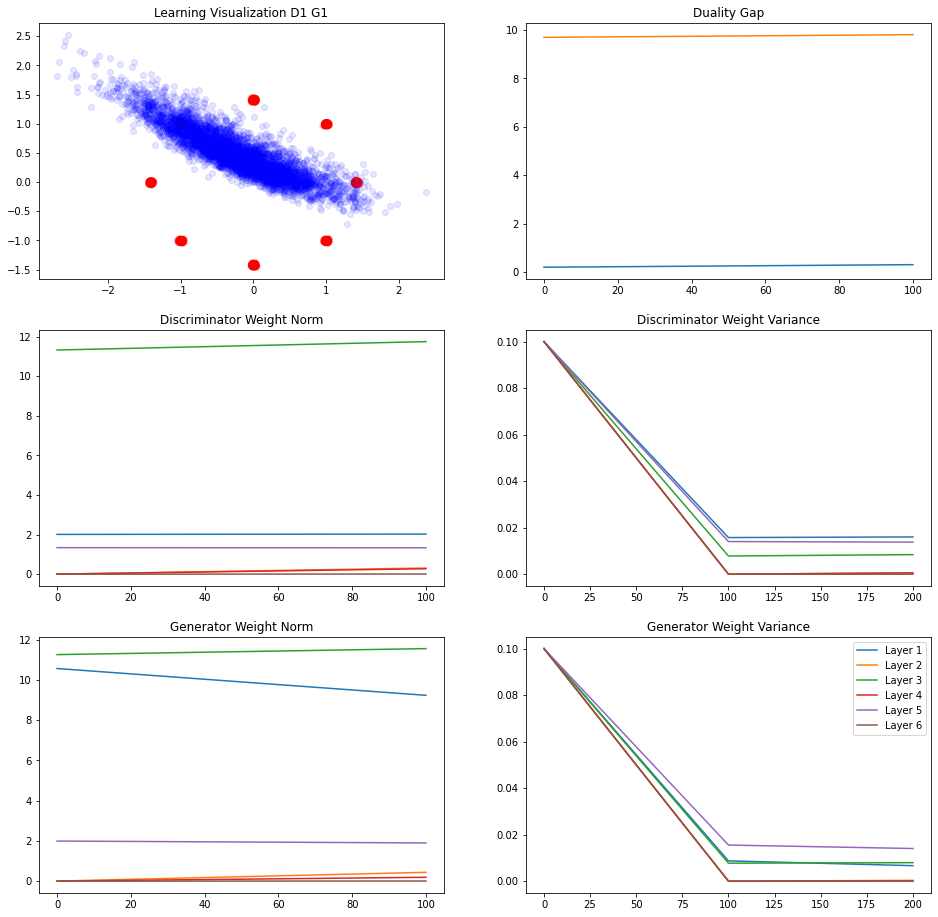

248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.16134751
L Random  Duality Gap :  9.712181


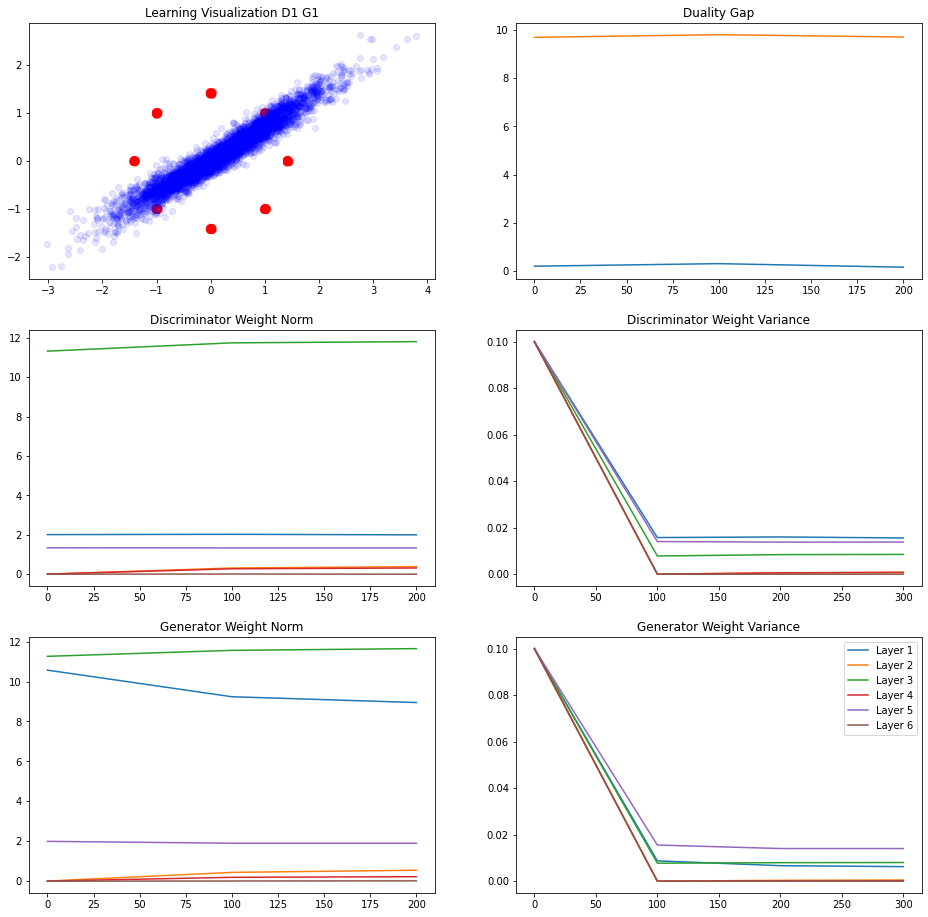

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.5276104
L Random  Duality Gap :  9.619522


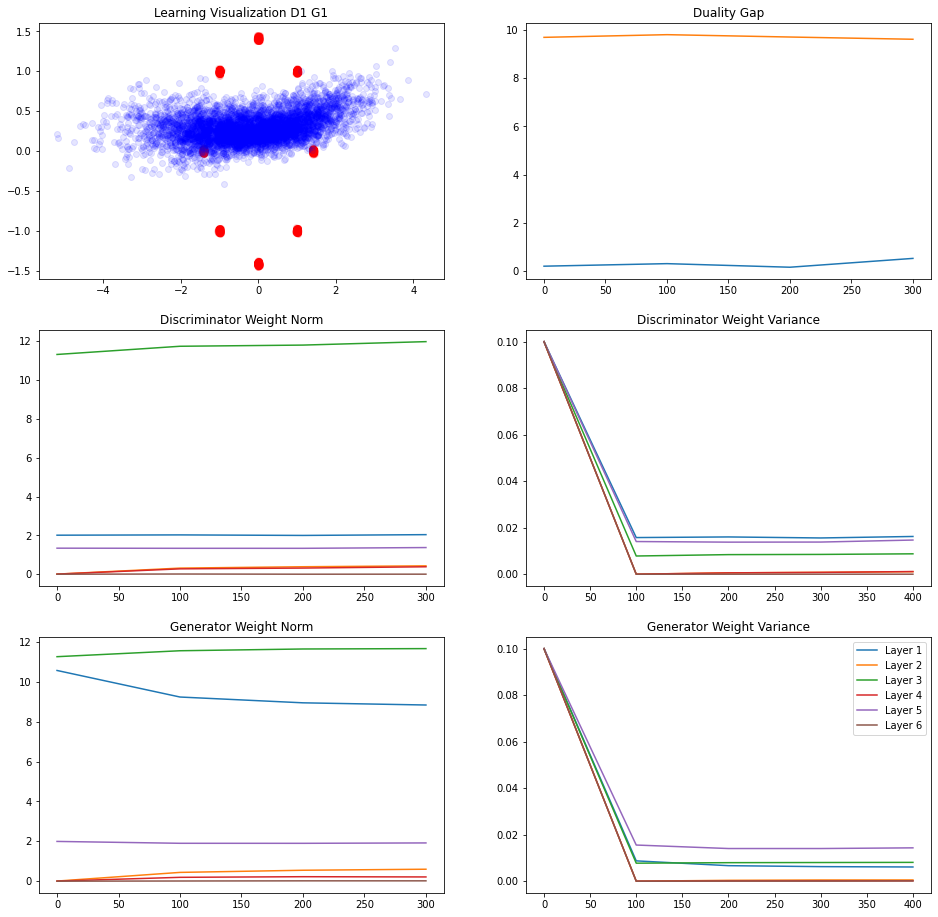

240/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.42767107
L Random  Duality Gap :  9.766938


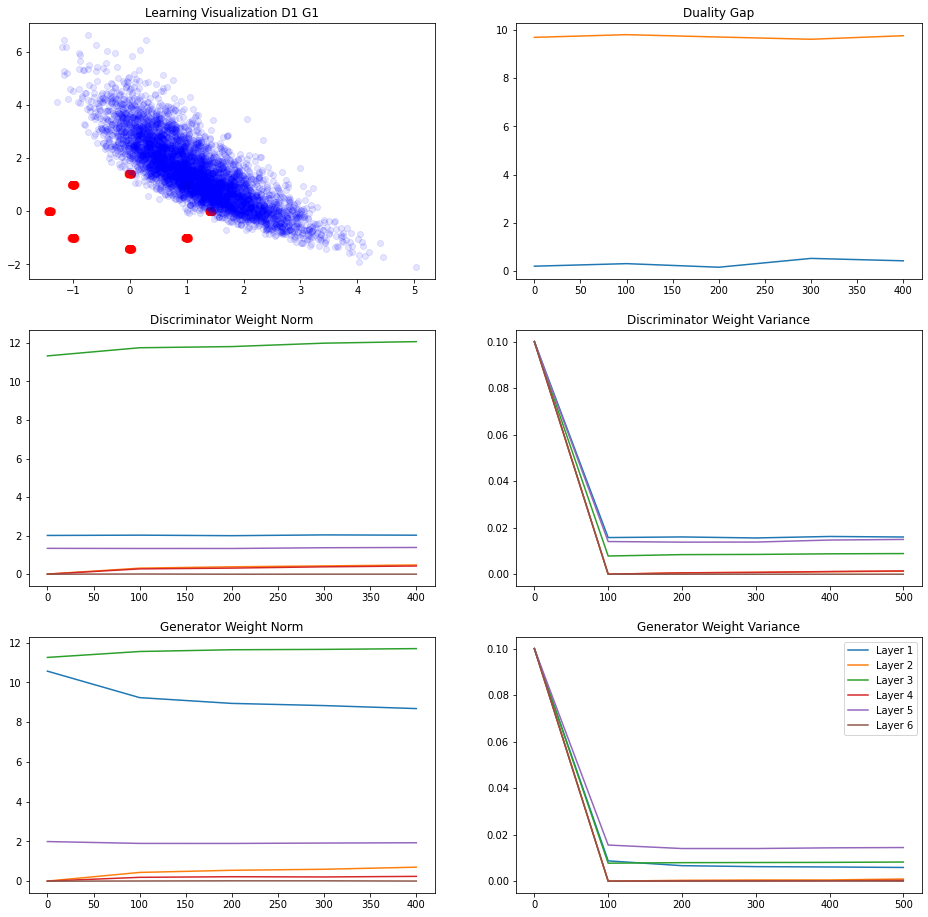

241/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.3284197
L Random  Duality Gap :  1.3642901
247/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  1.16141
L Random  Duality Gap :  2.2360563


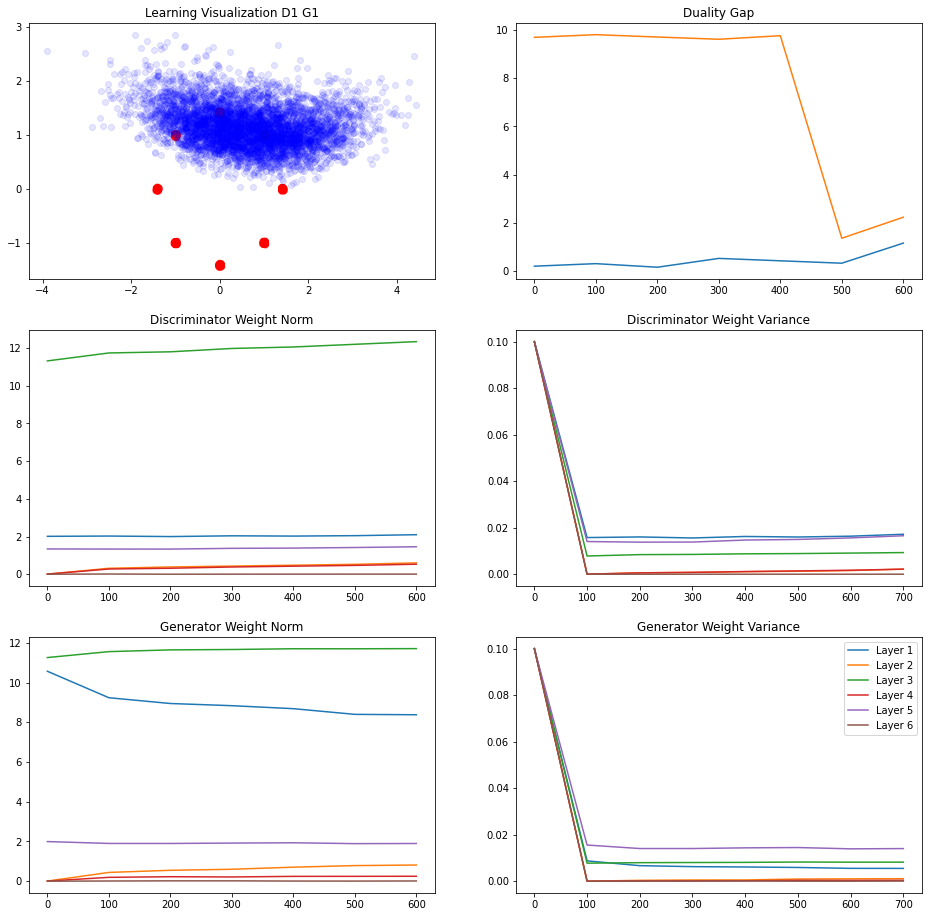

248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.34164417
L Random  Duality Gap :  0.5281216


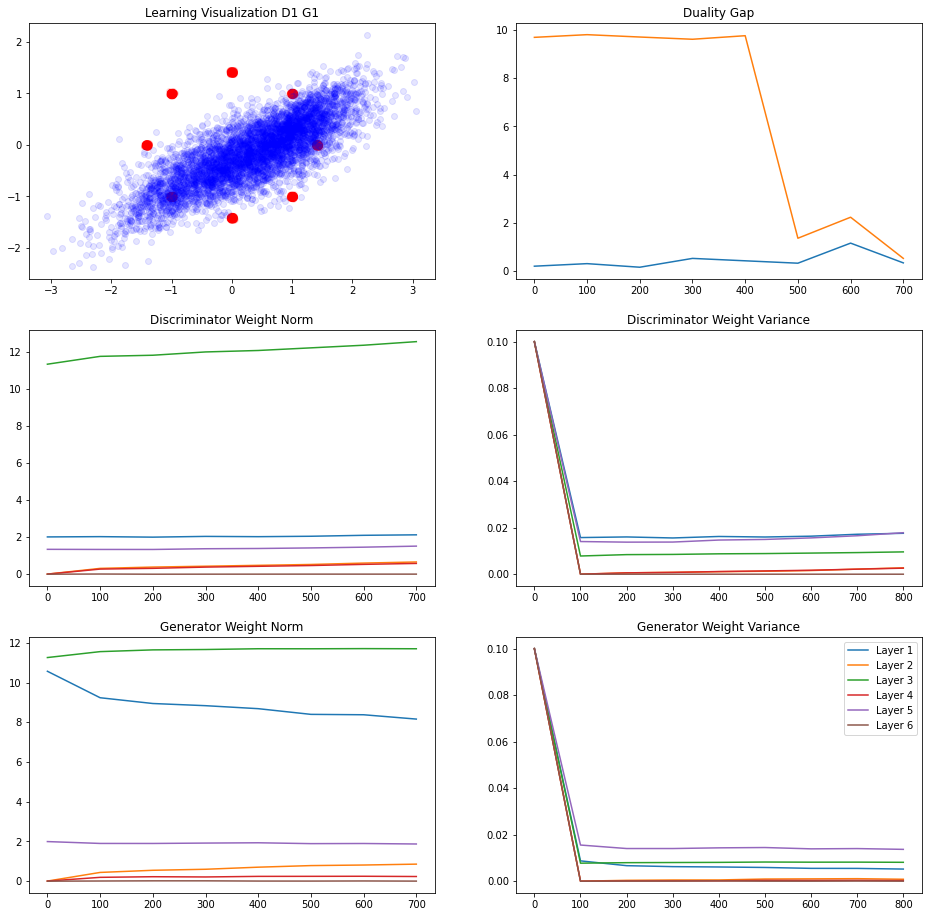

249/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.11840999
L Random  Duality Gap :  0.26148152


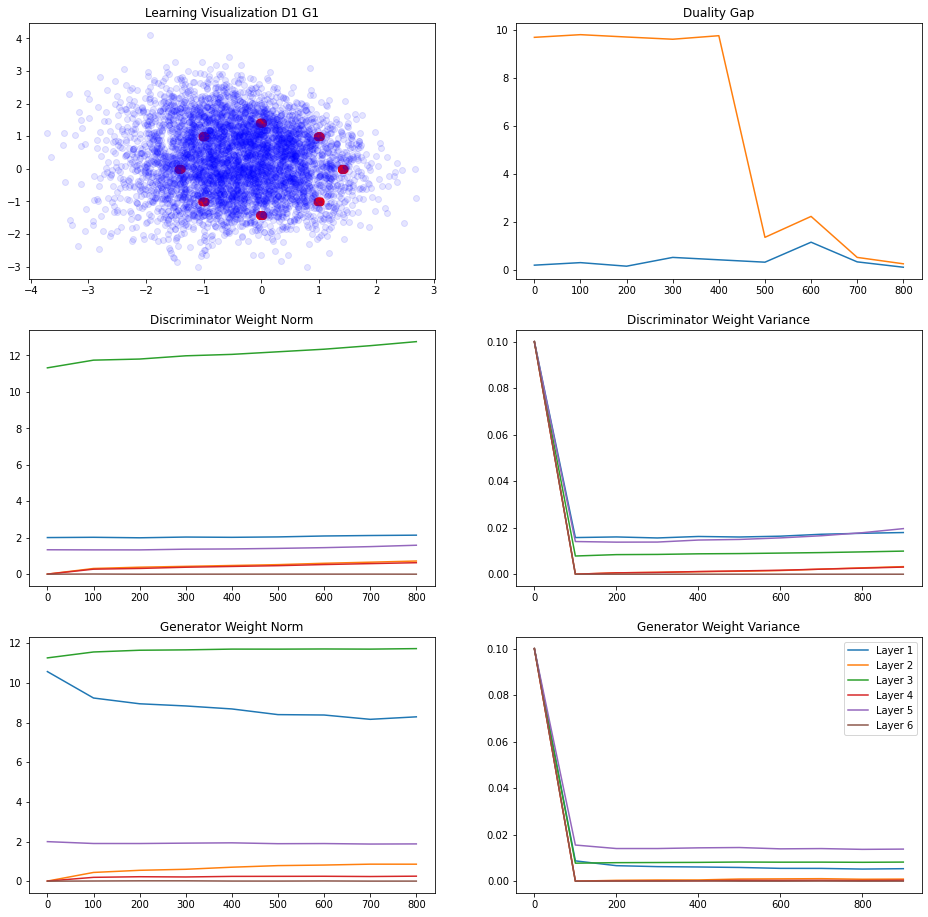

238/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.014962792
L Random  Duality Gap :  -0.13041759


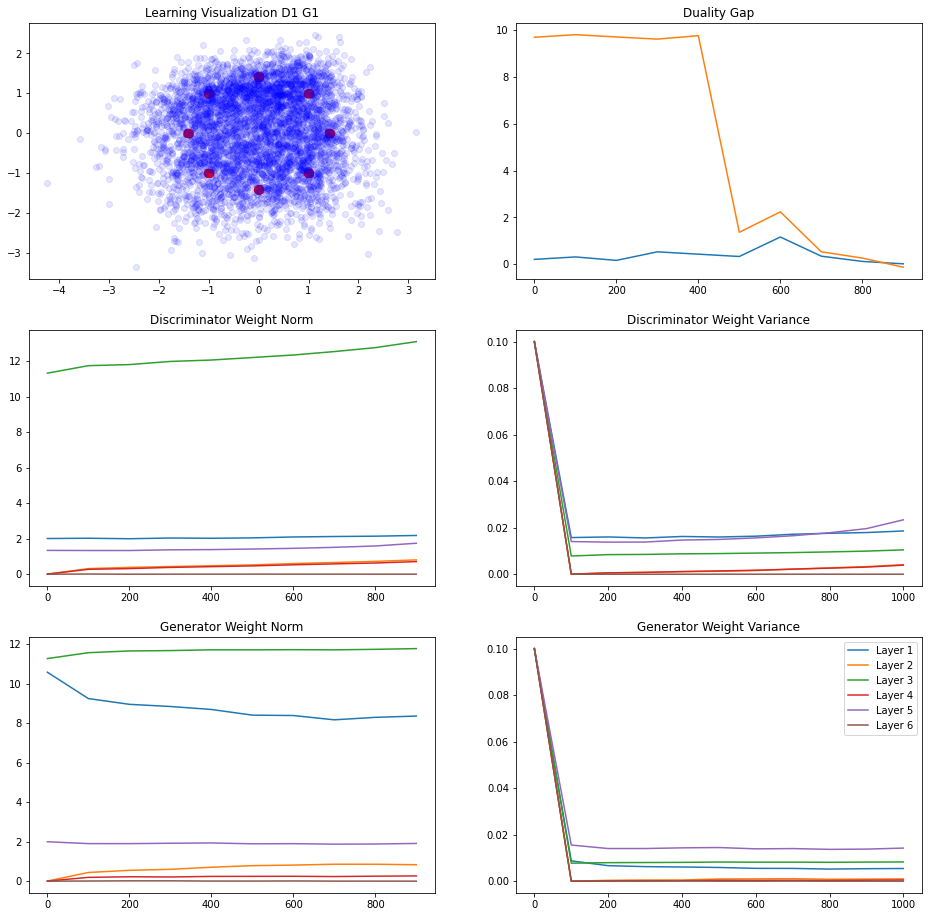

240/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.022520423
L Random  Duality Gap :  -0.19264519
248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.016412616
L Random  Duality Gap :  -0.25707674


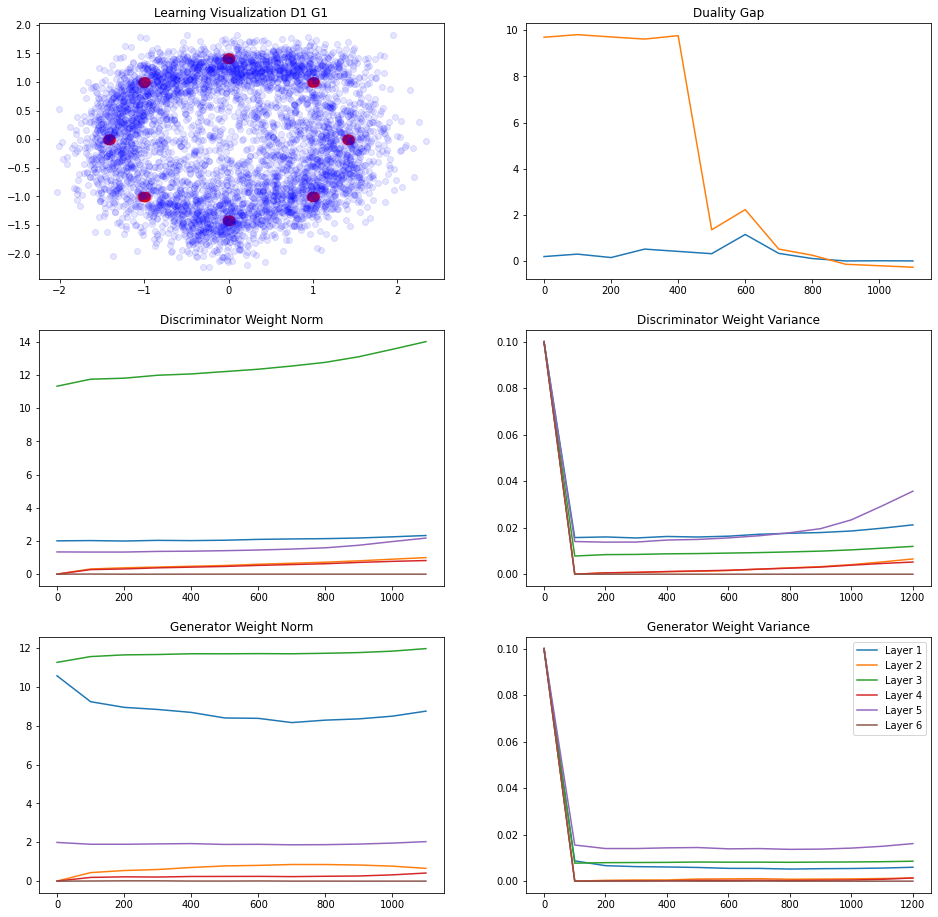

237/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.014077544
L Random  Duality Gap :  -0.34085304


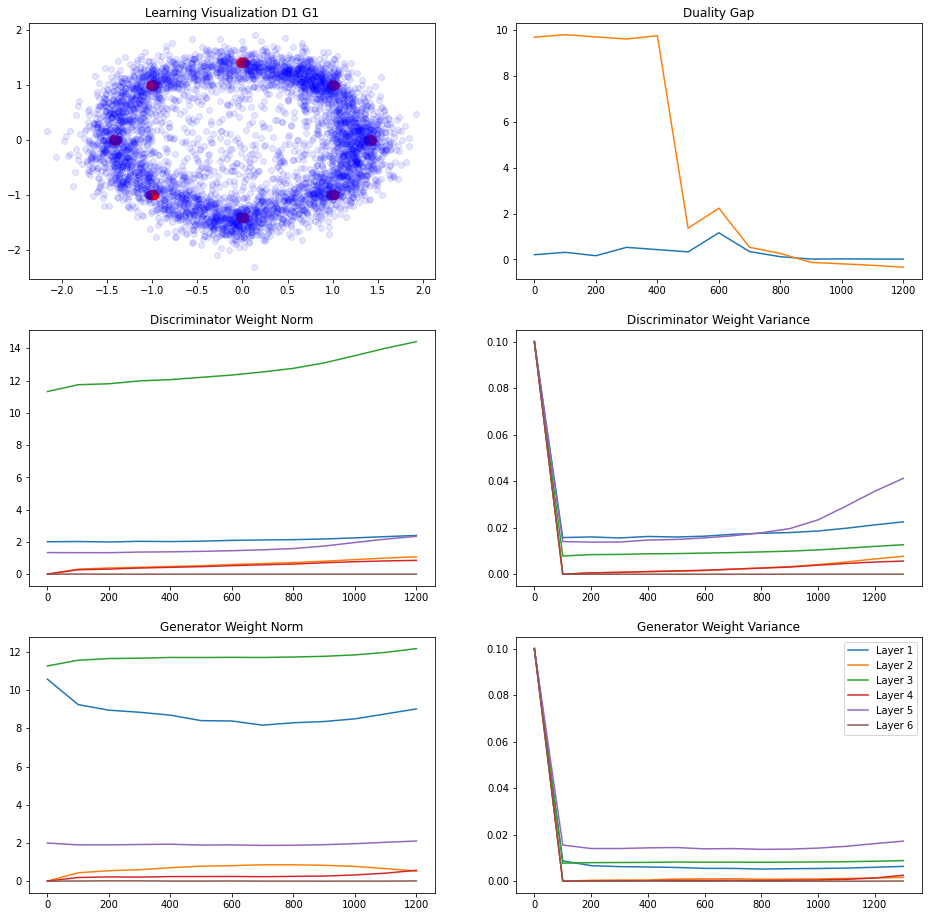

240/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.018058896
L Random  Duality Gap :  -0.3800996


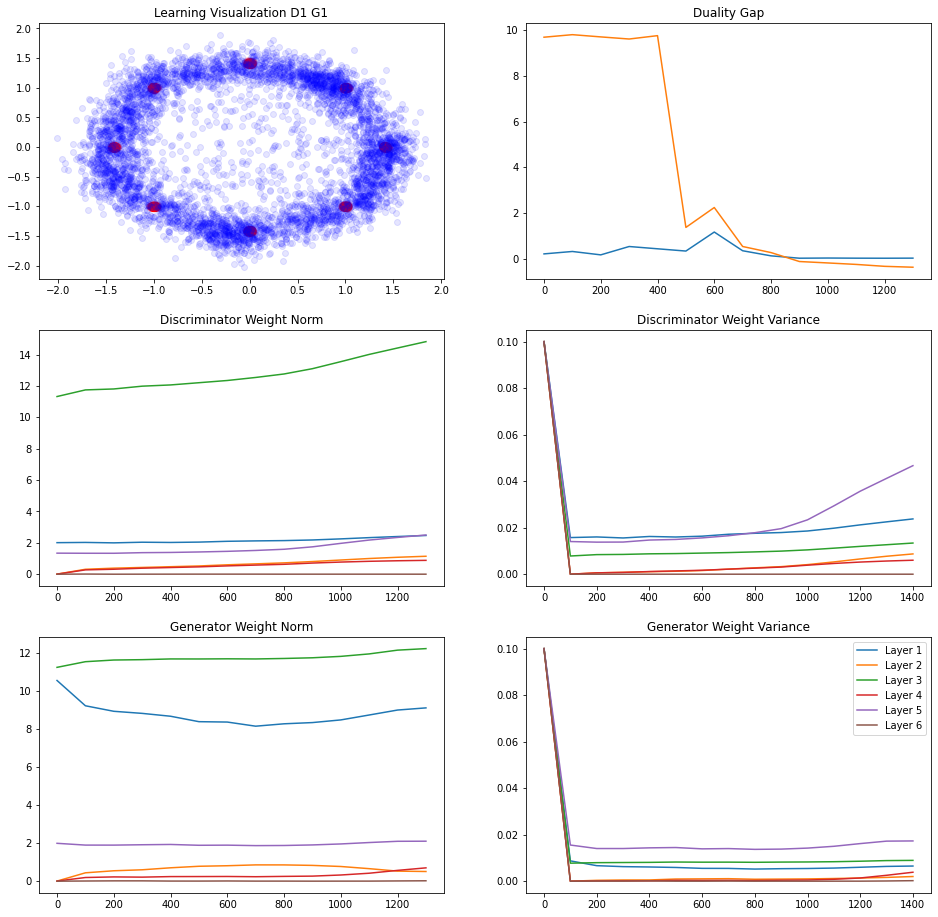

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.015755057
L Random  Duality Gap :  -0.42242277


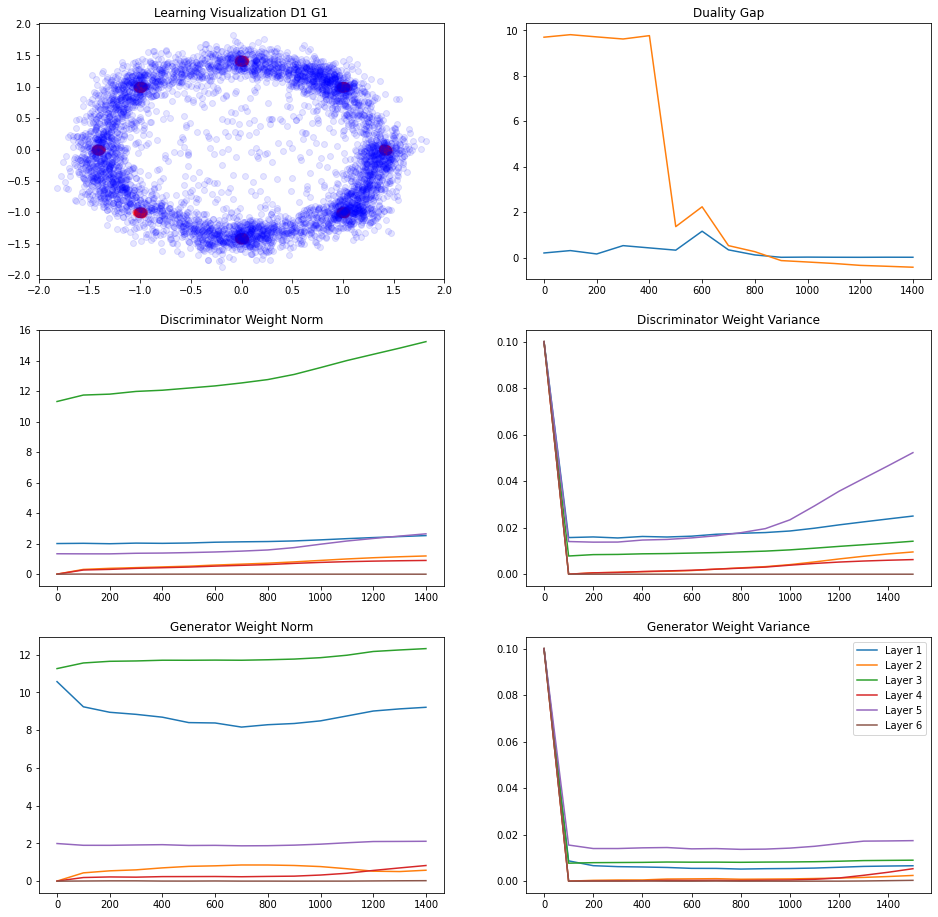

242/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.021799445
L Random  Duality Gap :  -0.43555295
238/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.02358663
L Random  Duality Gap :  -0.43971968


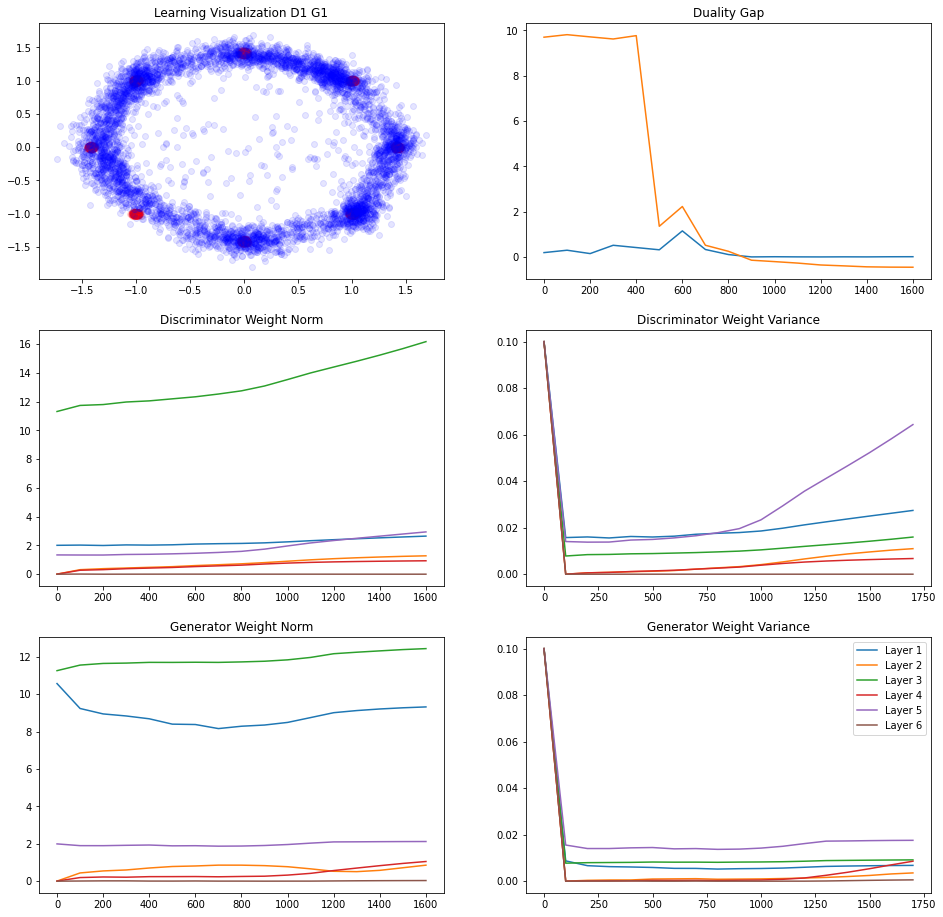

241/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.018622398
L Random  Duality Gap :  -0.49426055


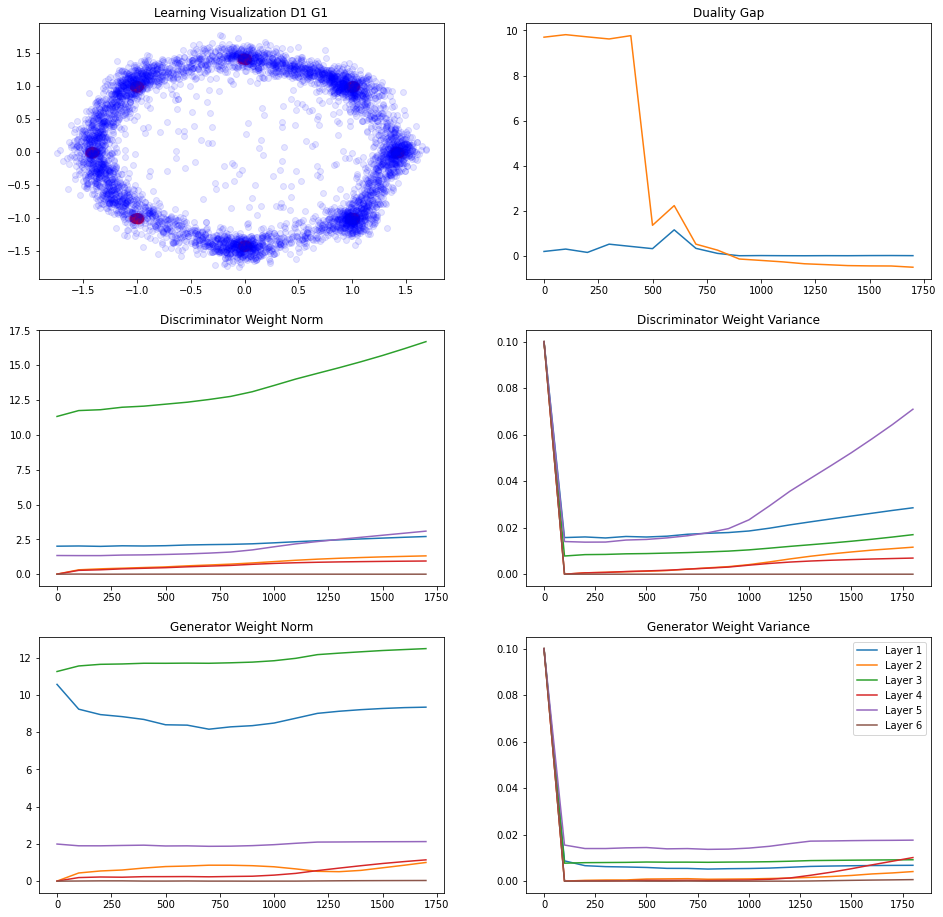

239/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.028818965
L Random  Duality Gap :  -0.51998574


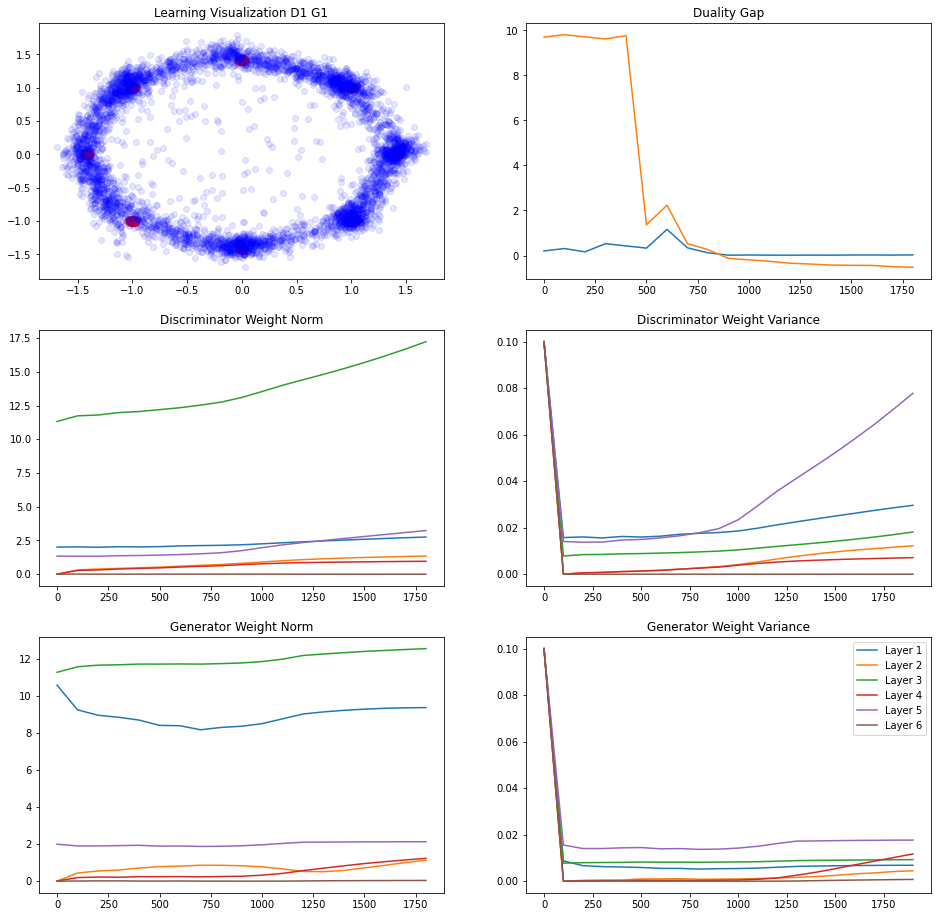

248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.049723387
L Random  Duality Gap :  -0.51859176


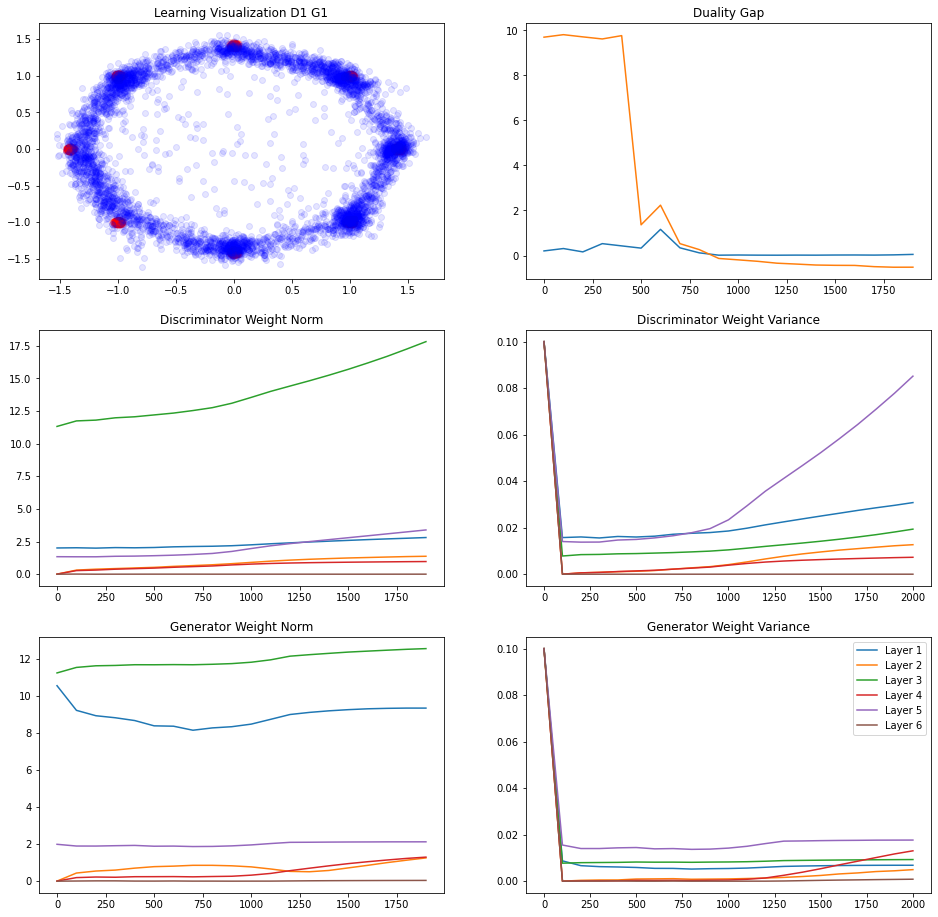

238/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.026854515
L Random  Duality Gap :  -0.5420546
249/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.023134828
L Random  Duality Gap :  -0.5615988


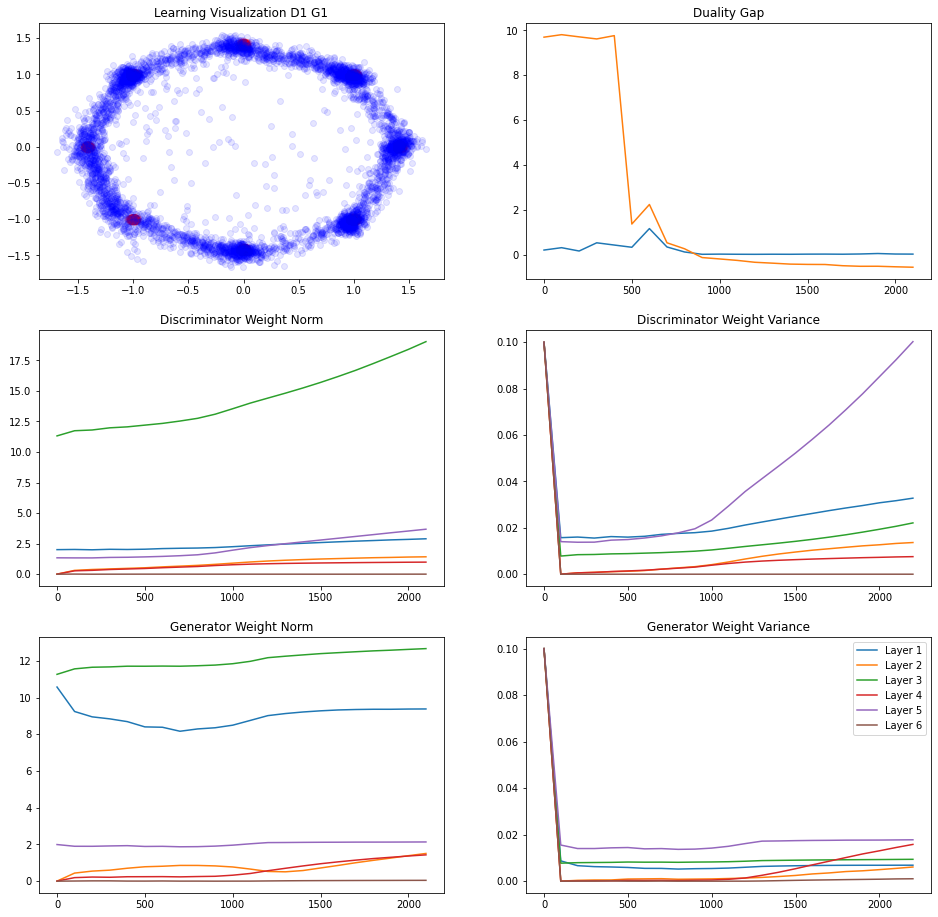

247/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.05782783
L Random  Duality Gap :  -0.5757534


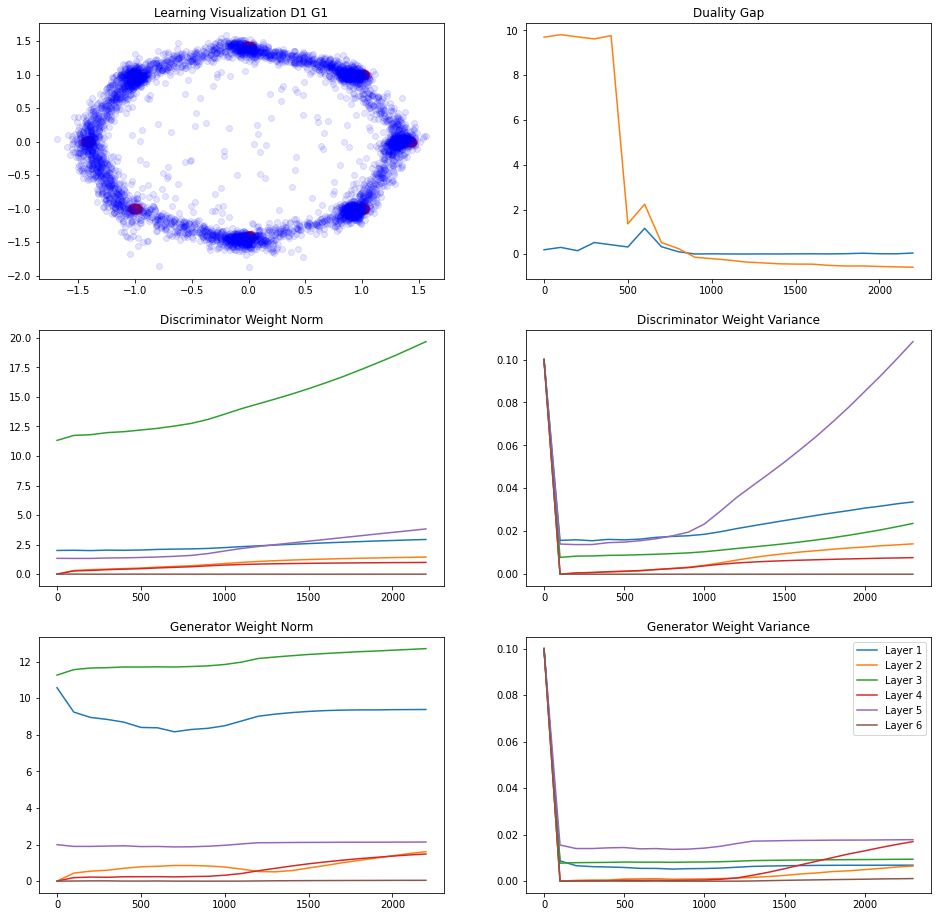

237/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.04745841
L Random  Duality Gap :  -0.5545594


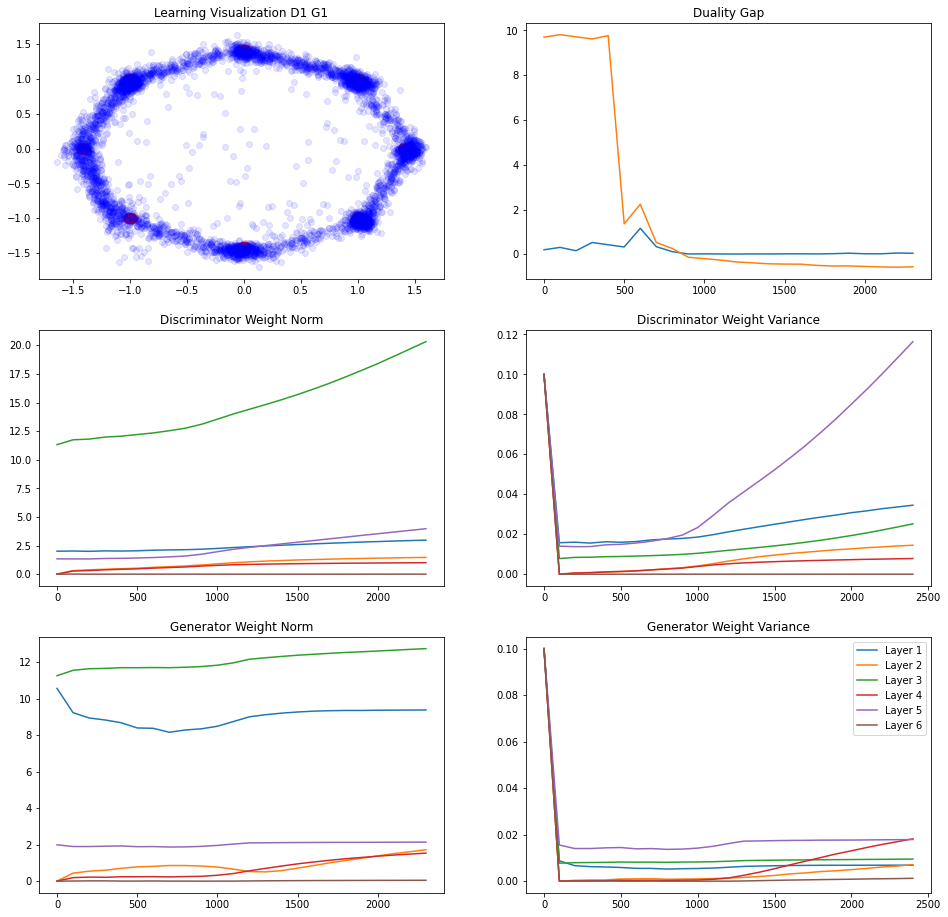

241/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.014169693
L Random  Duality Gap :  -0.6283059


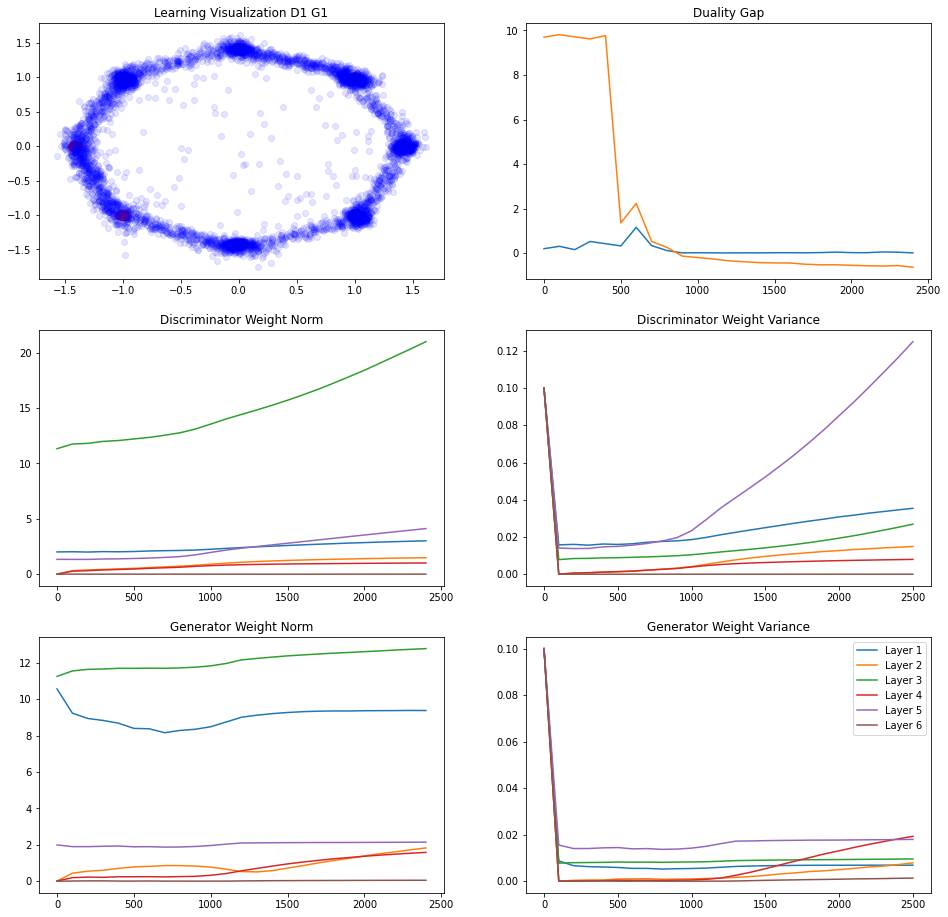

242/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.021818519
L Random  Duality Gap :  -0.563411
237/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.034690738
L Random  Duality Gap :  -0.6356752


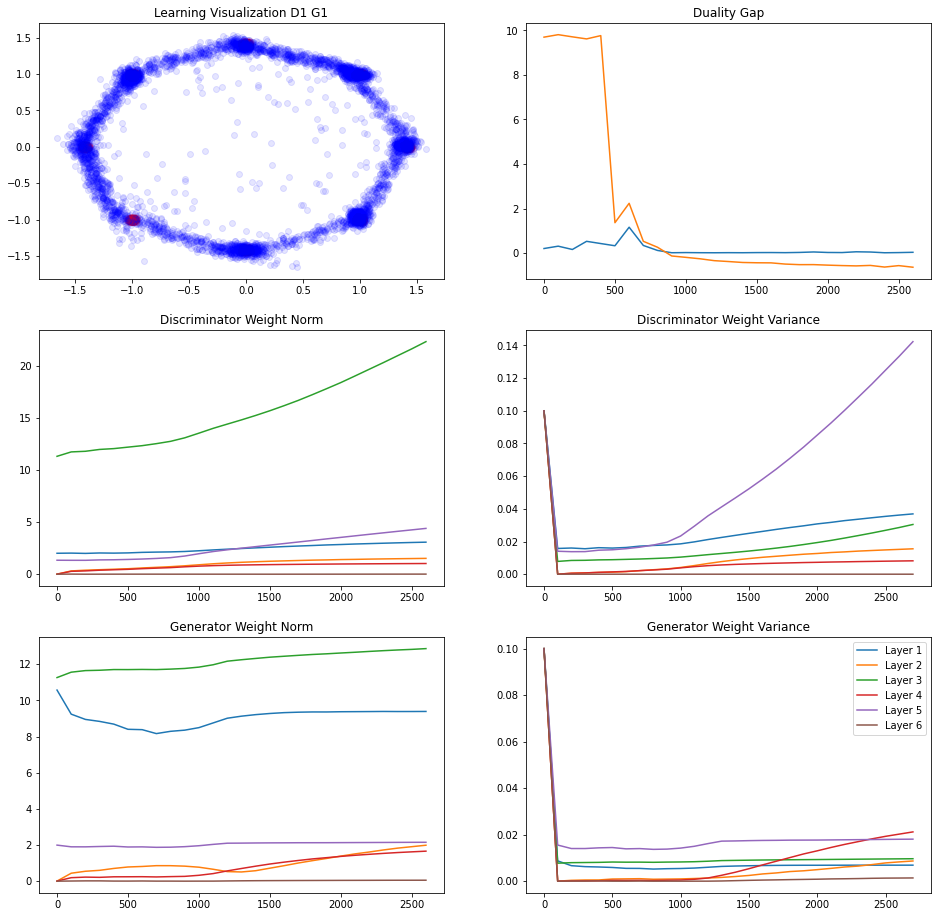

239/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  0.03934002
L Random  Duality Gap :  -0.5759245


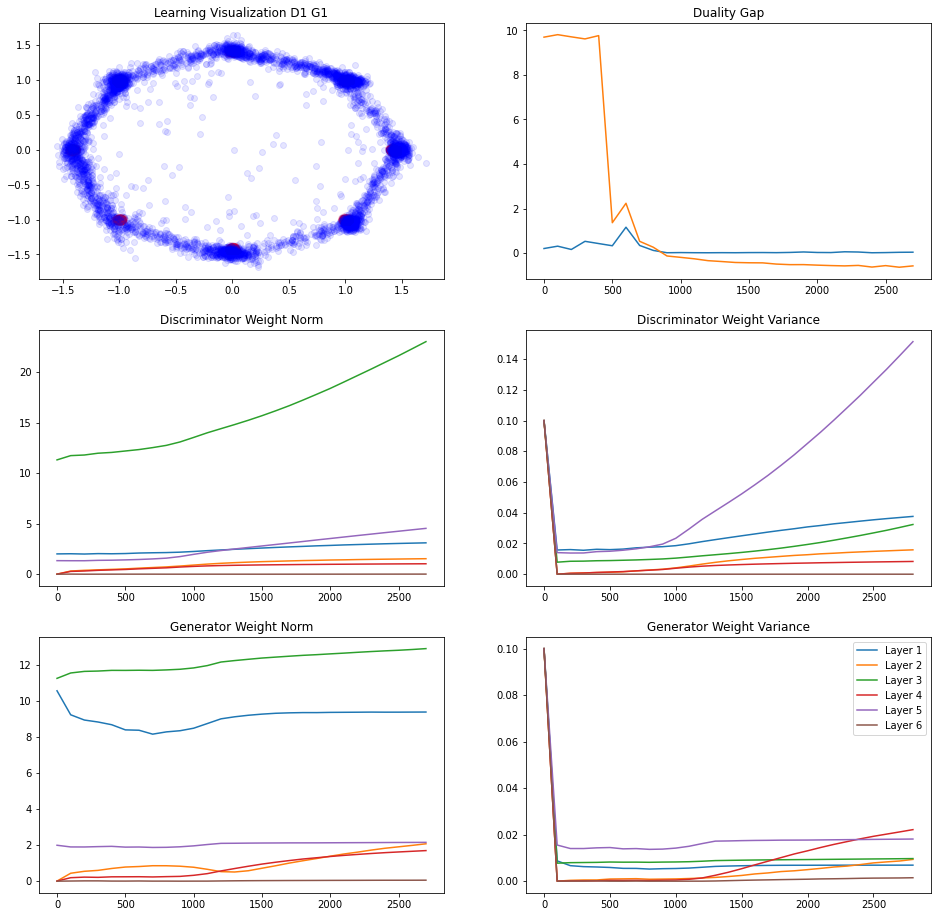

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.05338335
L Random  Duality Gap :  -0.62291235


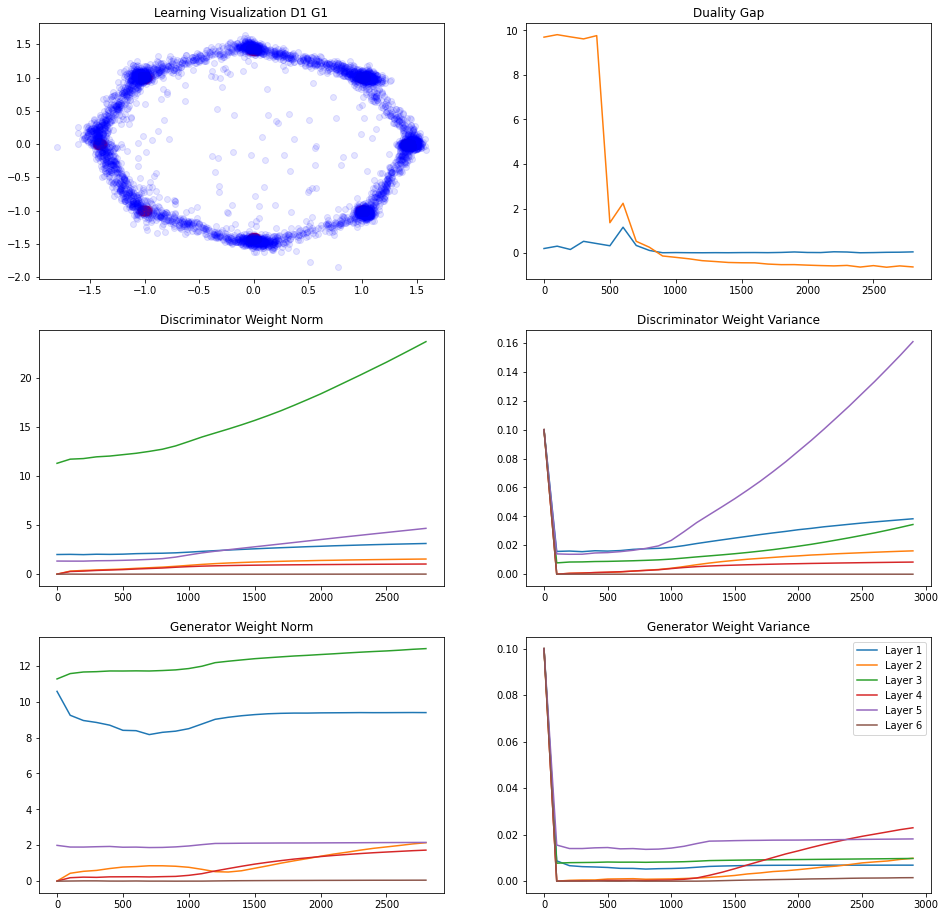

246/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.02092123
L Random  Duality Gap :  -0.62636864


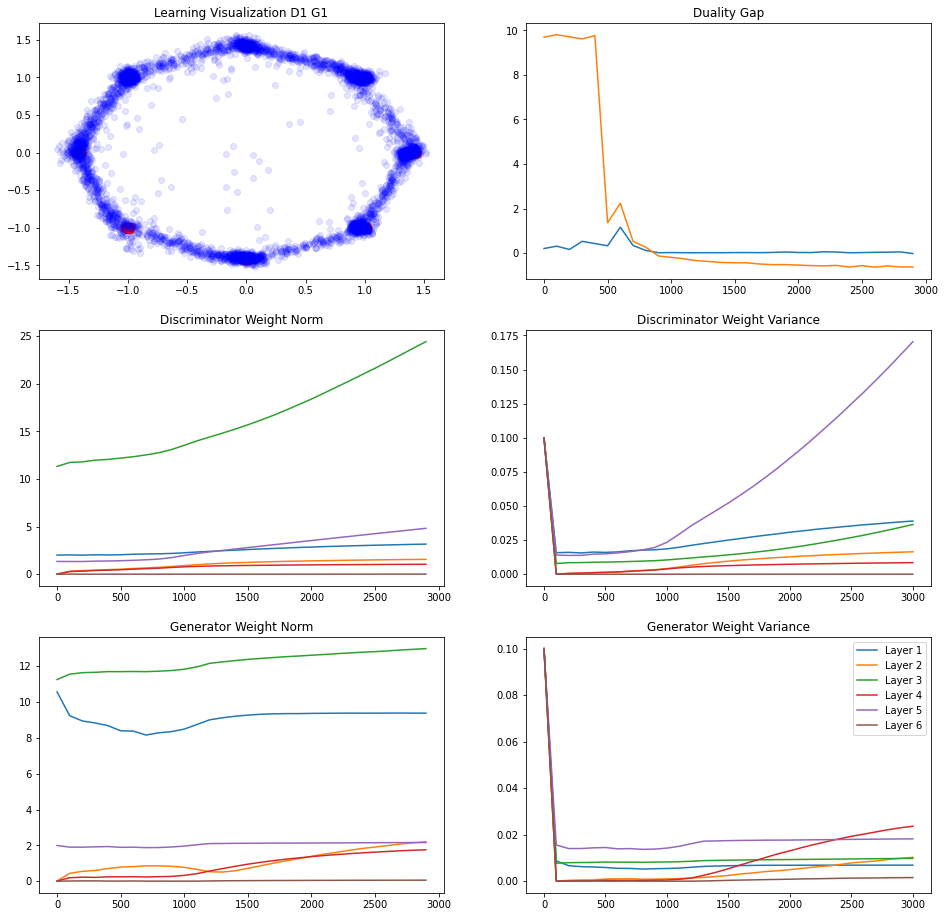

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.018147469
L Random  Duality Gap :  -0.6415597
239/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.007074833
L Random  Duality Gap :  -0.5829832


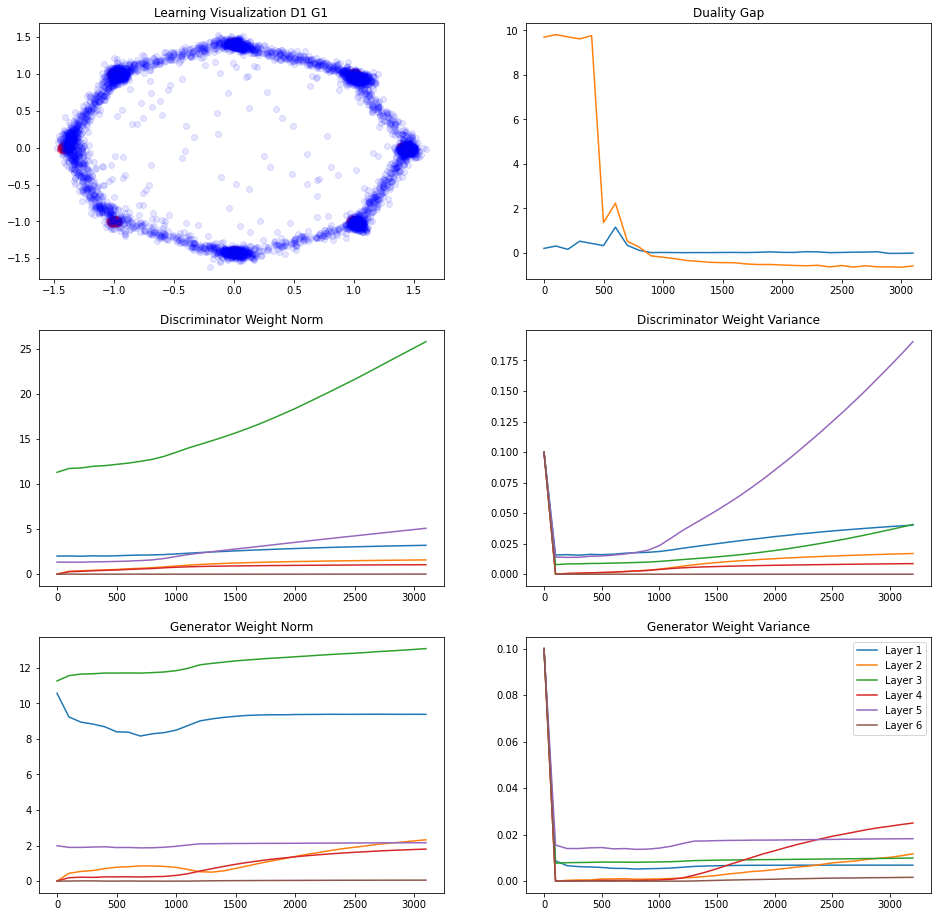

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.06205696
L Random  Duality Gap :  -0.64437324


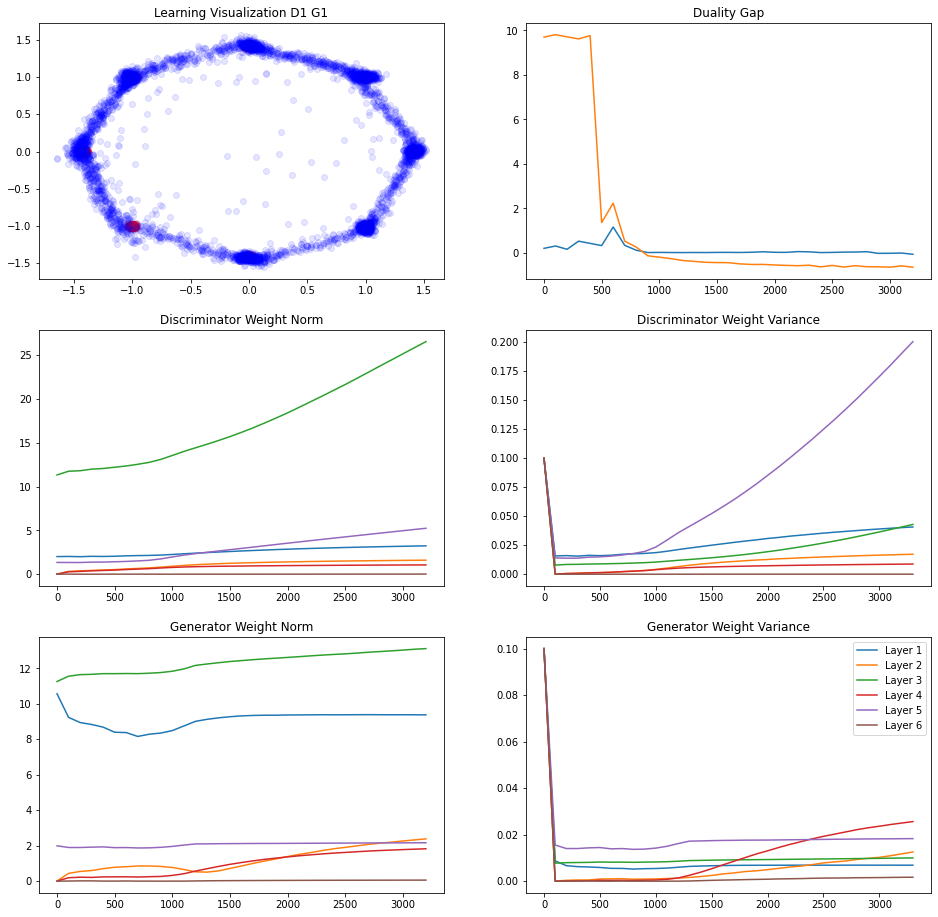

244/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.06561053
L Random  Duality Gap :  -0.52445114


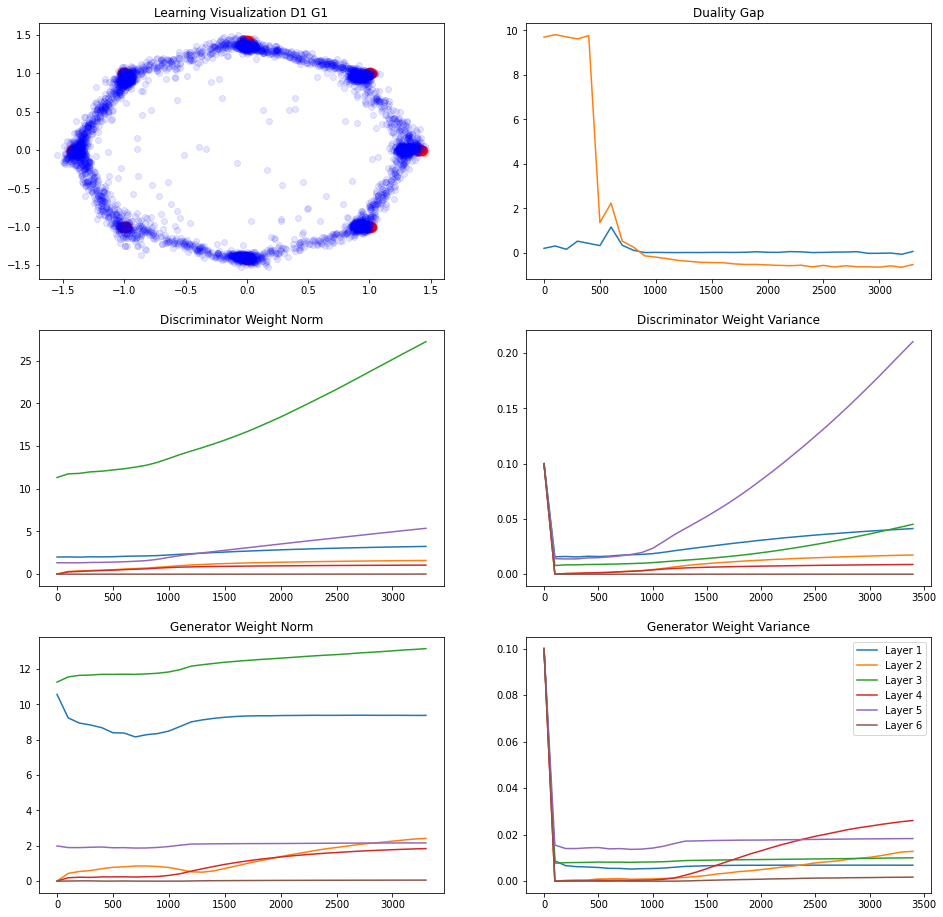

242/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.15507382
L Random  Duality Gap :  -0.5889542


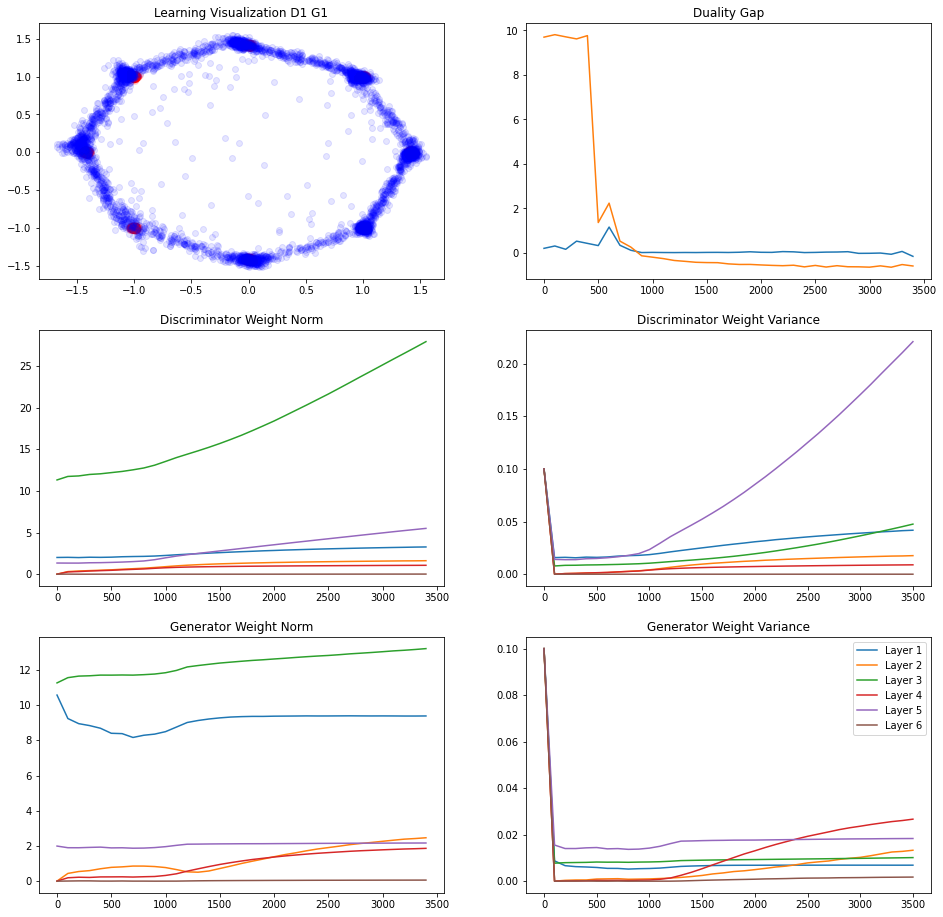

246/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.03515804
L Random  Duality Gap :  -0.605828
238/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.13566822
L Random  Duality Gap :  -0.6213762


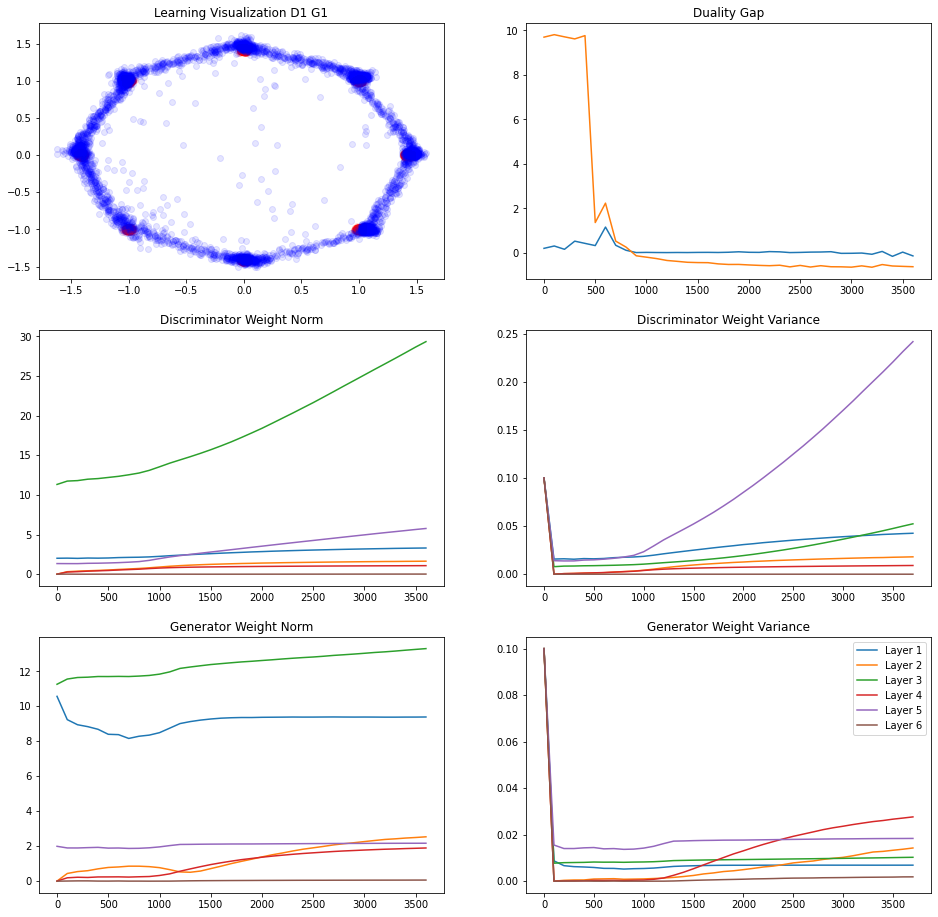

246/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  0.009964764
L Random  Duality Gap :  -0.50094384


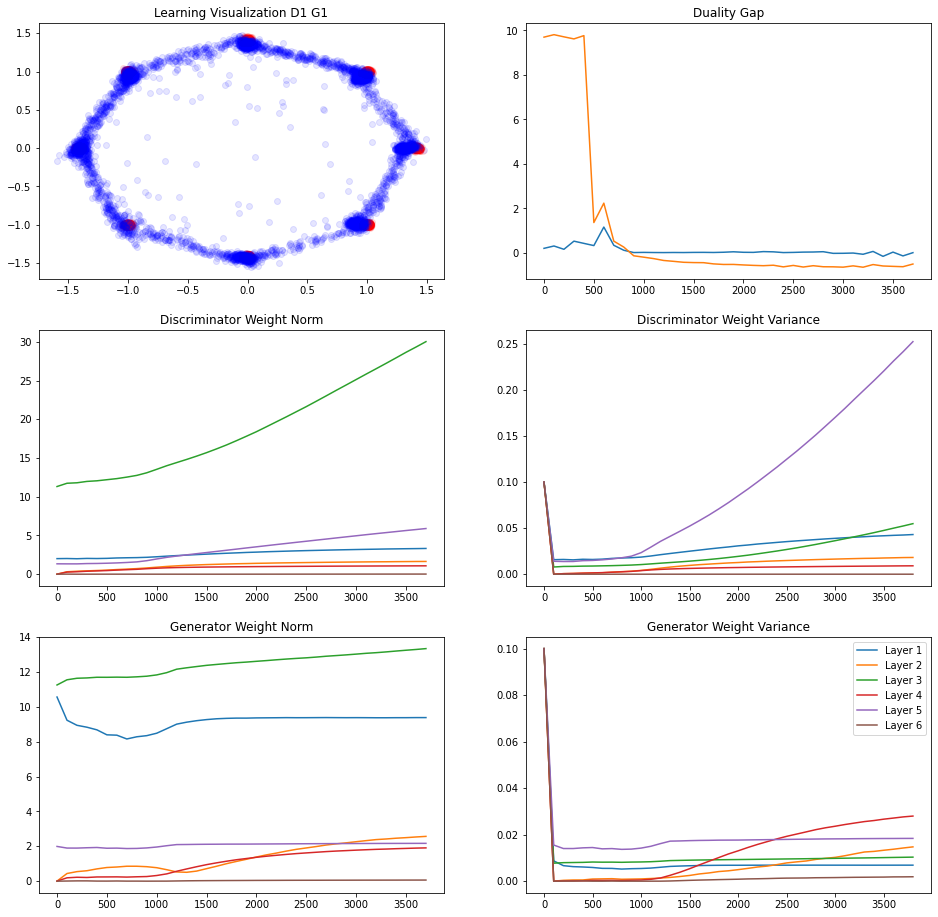

248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.11998403
L Random  Duality Gap :  -0.6519334


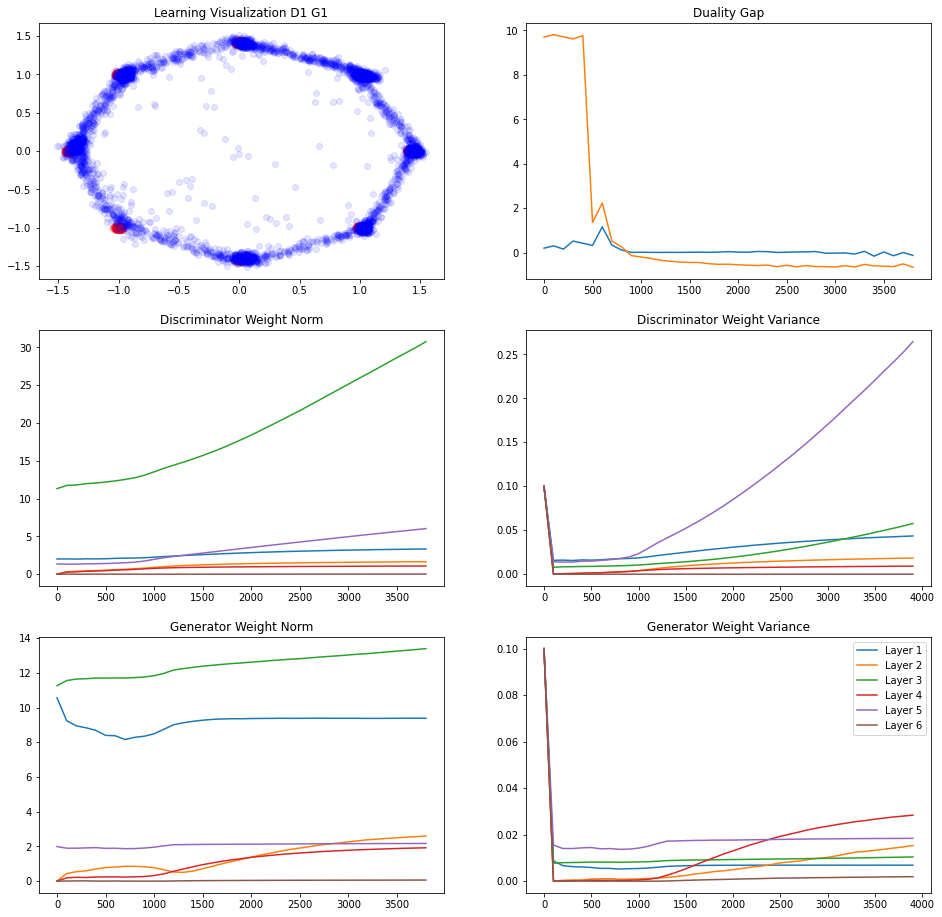

245/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.1225723
L Random  Duality Gap :  -0.600774


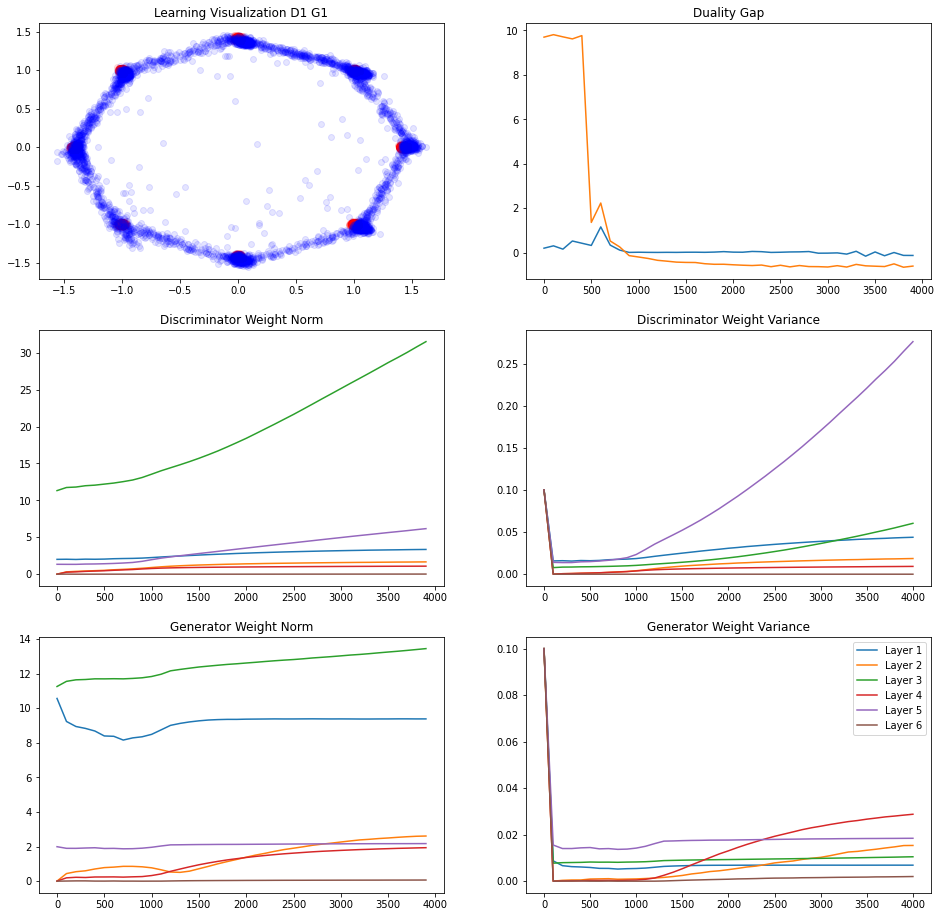

245/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.1549353
L Random  Duality Gap :  -0.58510226
244/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.20672005
L Random  Duality Gap :  -0.54993886


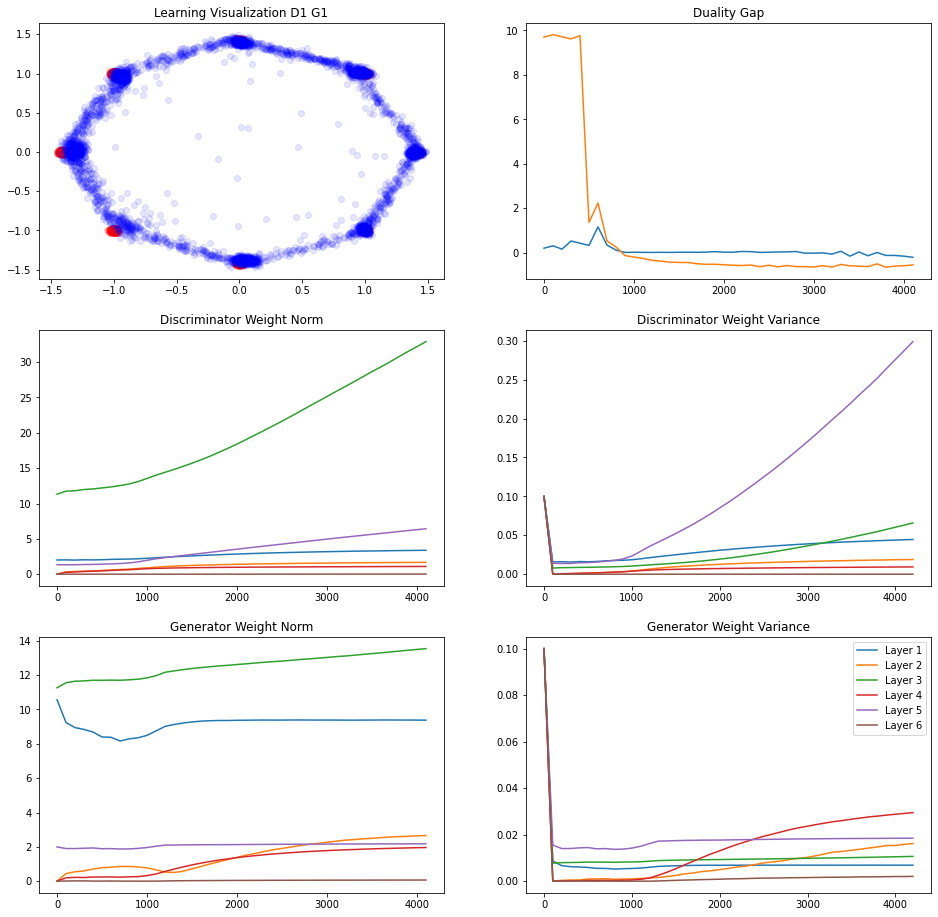

235/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.10530597
L Random  Duality Gap :  -0.5940208


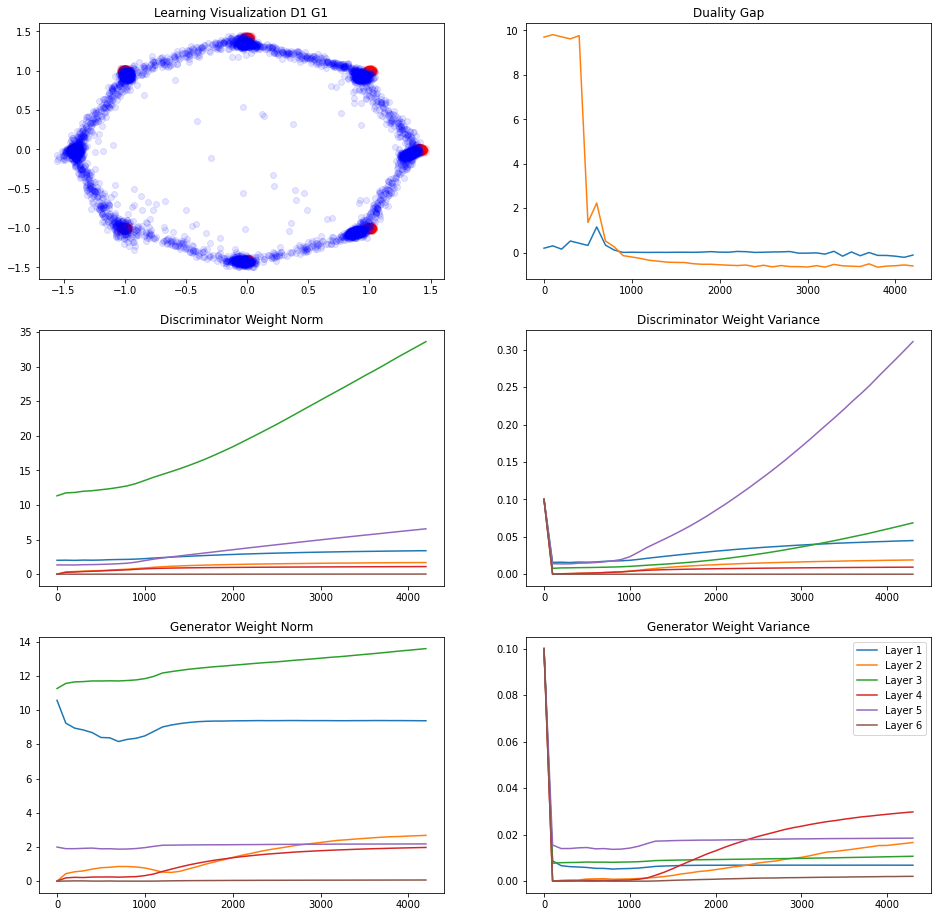

248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.17254555
L Random  Duality Gap :  -0.6584642


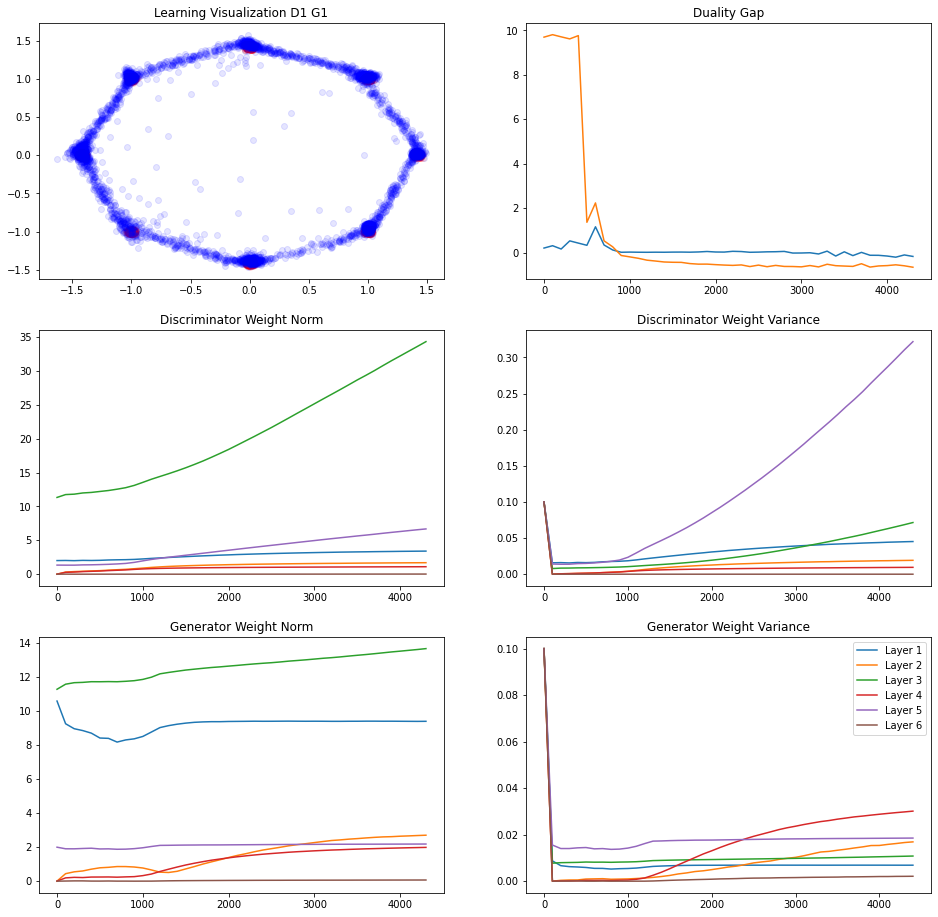

248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.3113159
L Random  Duality Gap :  -0.5858086


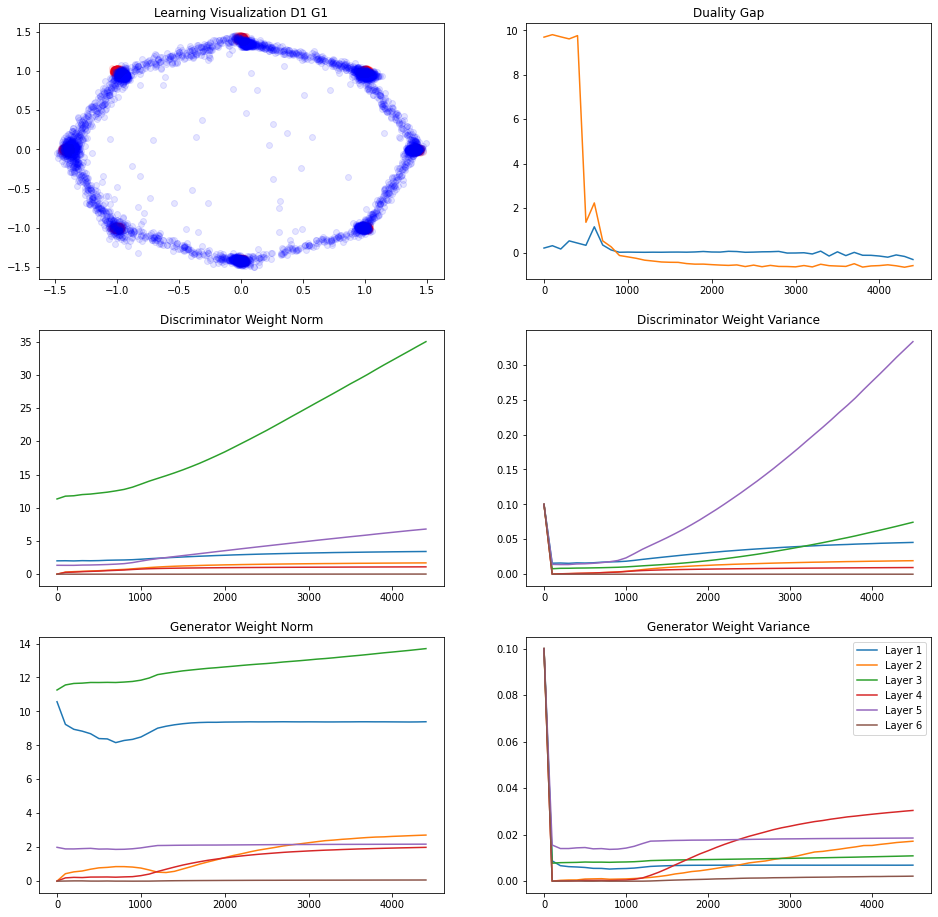

244/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.24117887
L Random  Duality Gap :  -0.65870774
243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.19155419
L Random  Duality Gap :  -0.55384266


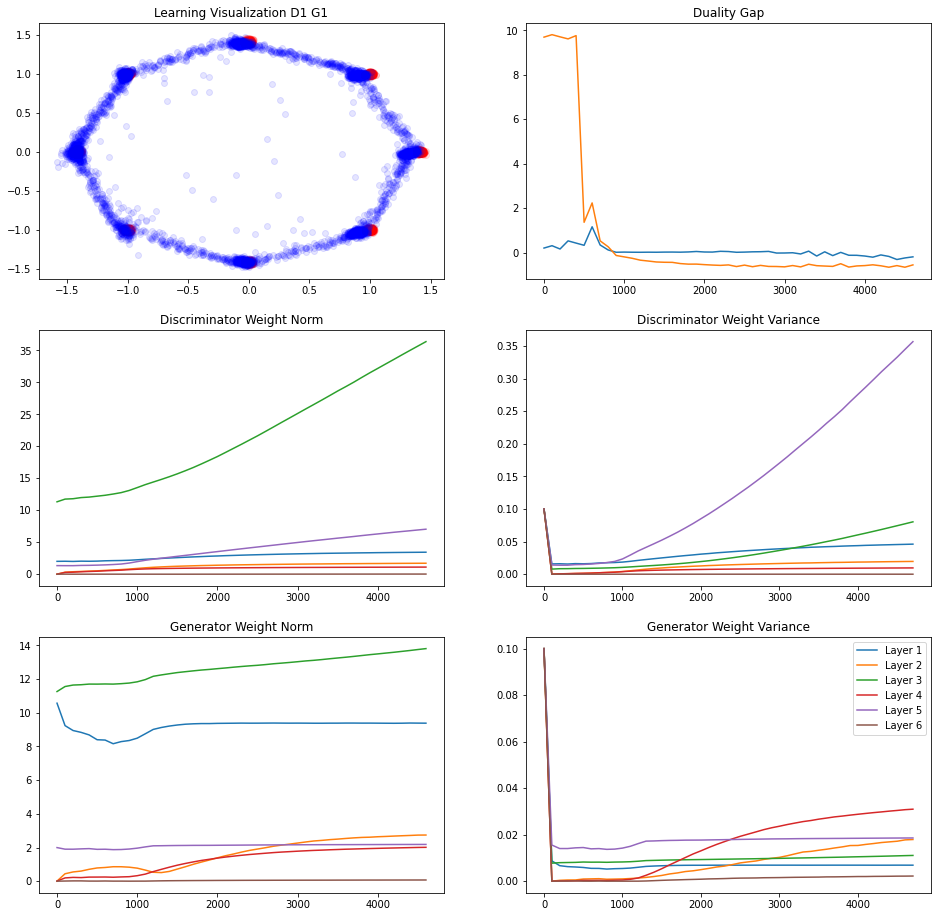

245/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.44401914
L Random  Duality Gap :  -0.63616216


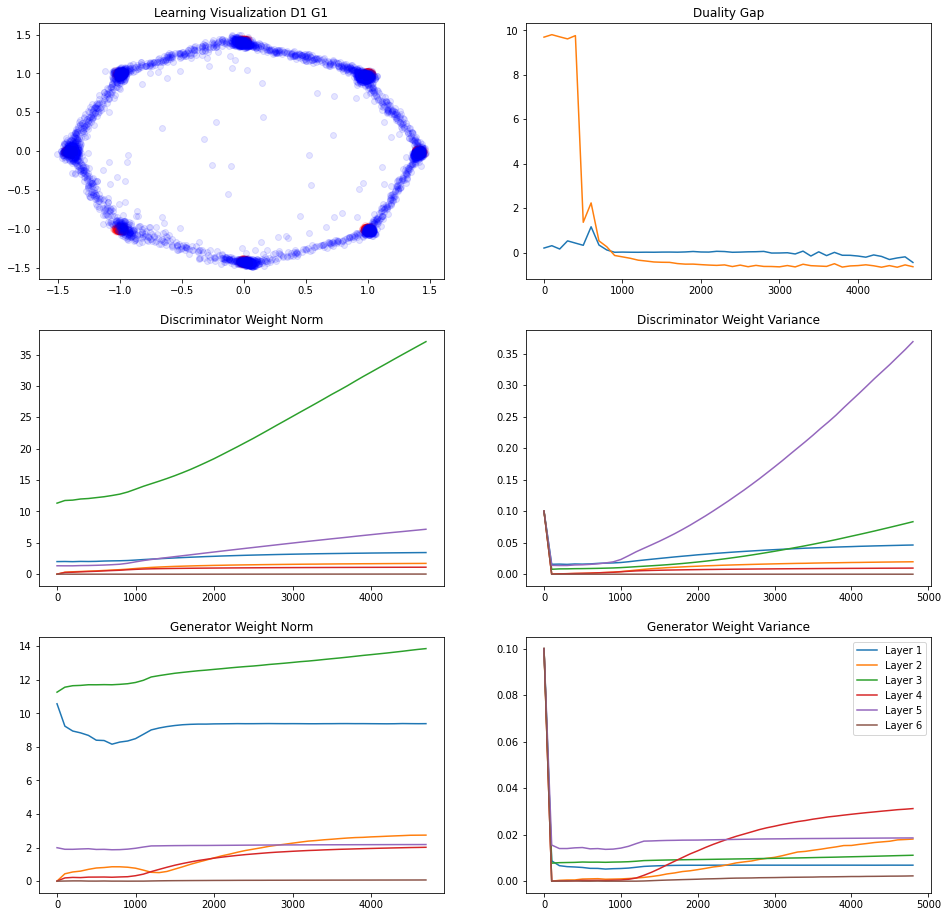

241/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.3775053
L Random  Duality Gap :  -0.6713897


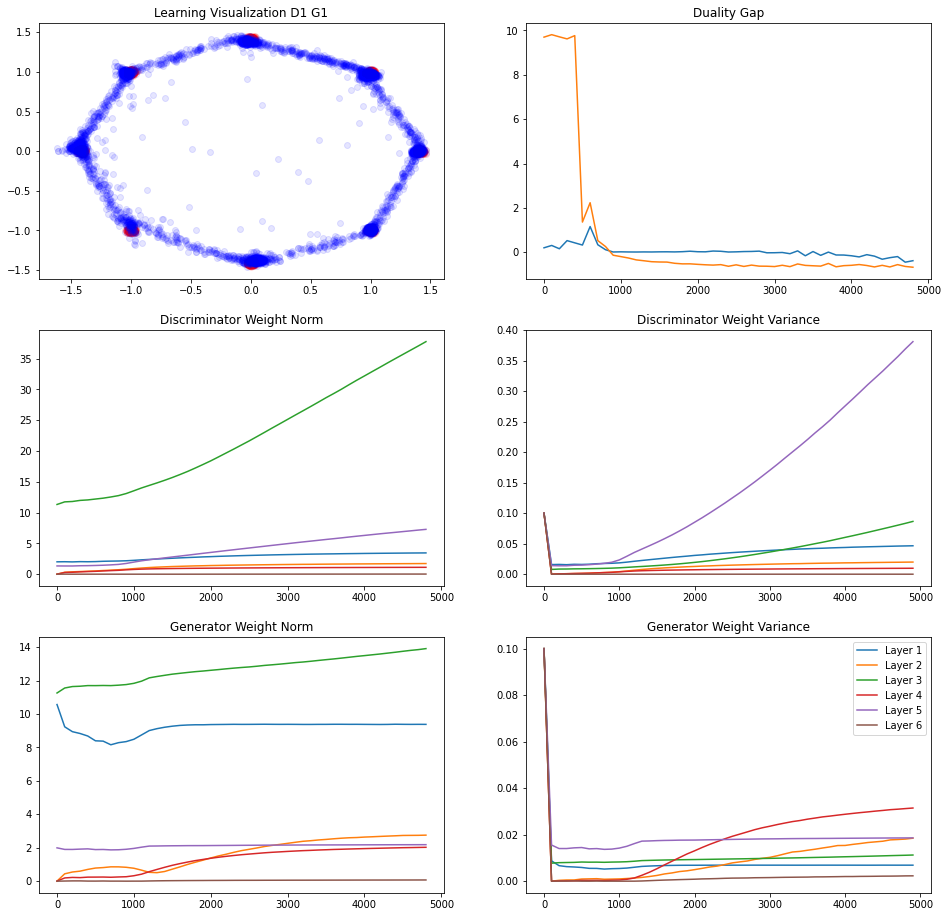

235/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.3081606
L Random  Duality Gap :  -0.67330086


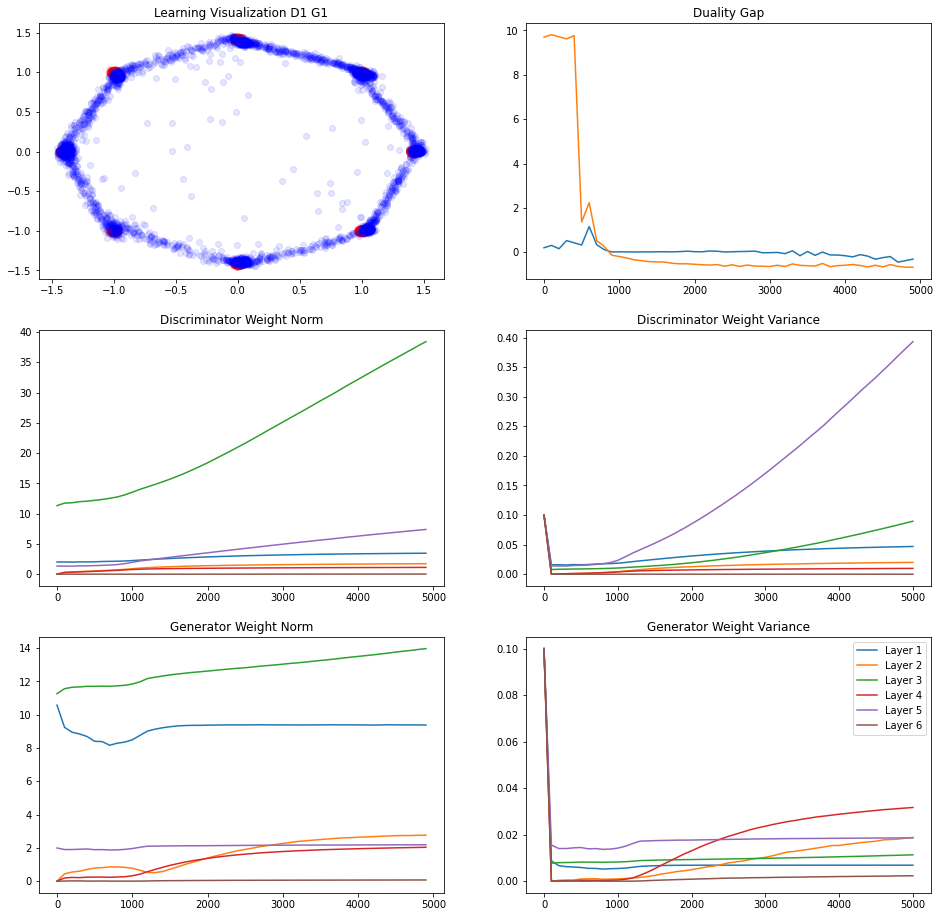

239/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.24337816
L Random  Duality Gap :  -0.57475924
243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.39001042
L Random  Duality Gap :  -0.7131916


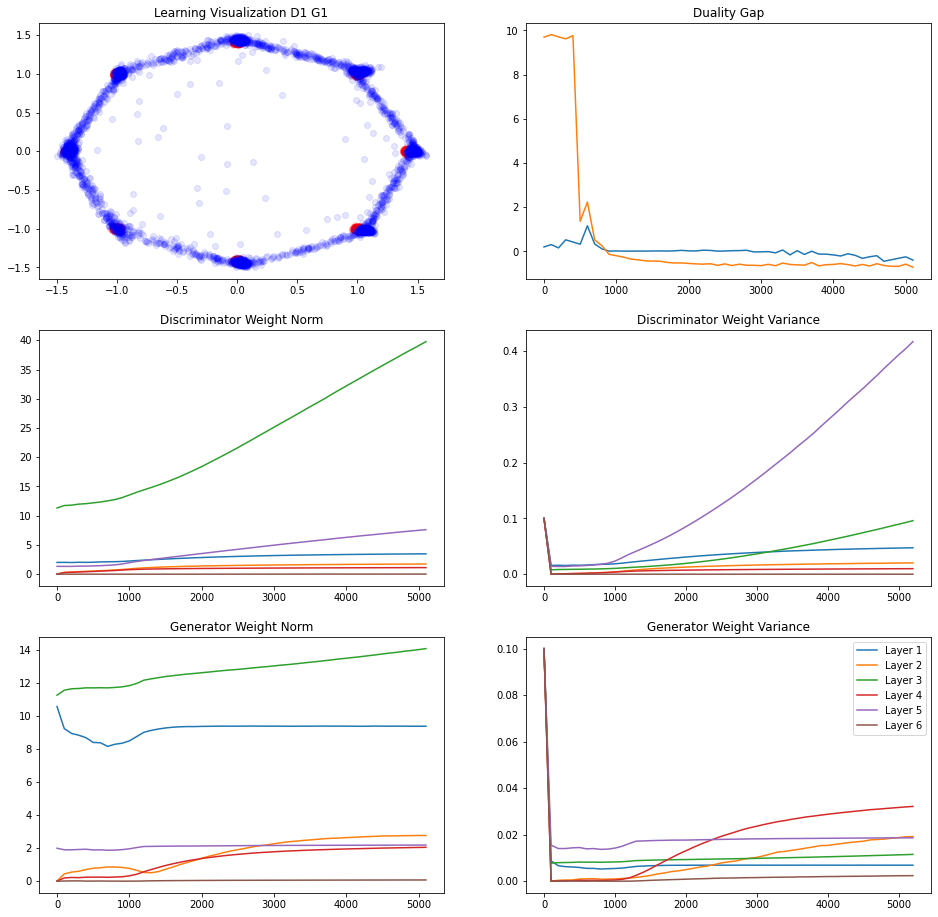

247/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.3259923
L Random  Duality Gap :  -0.64179456


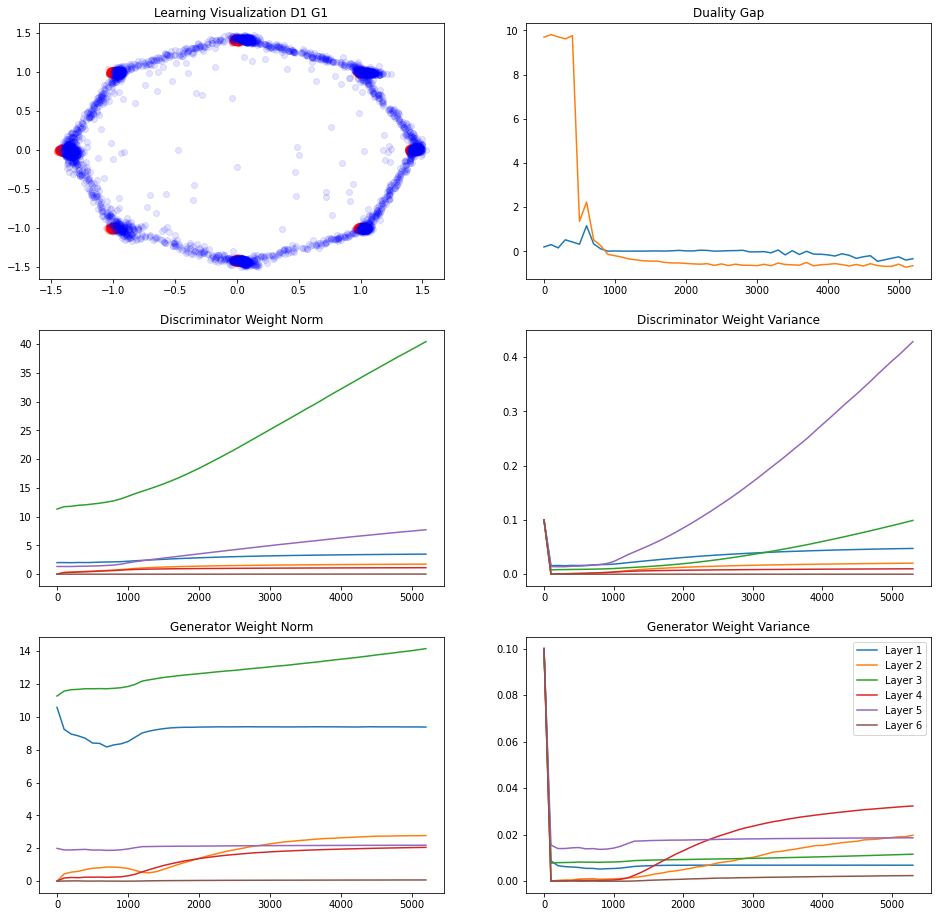

242/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.4242546
L Random  Duality Gap :  -0.6884973


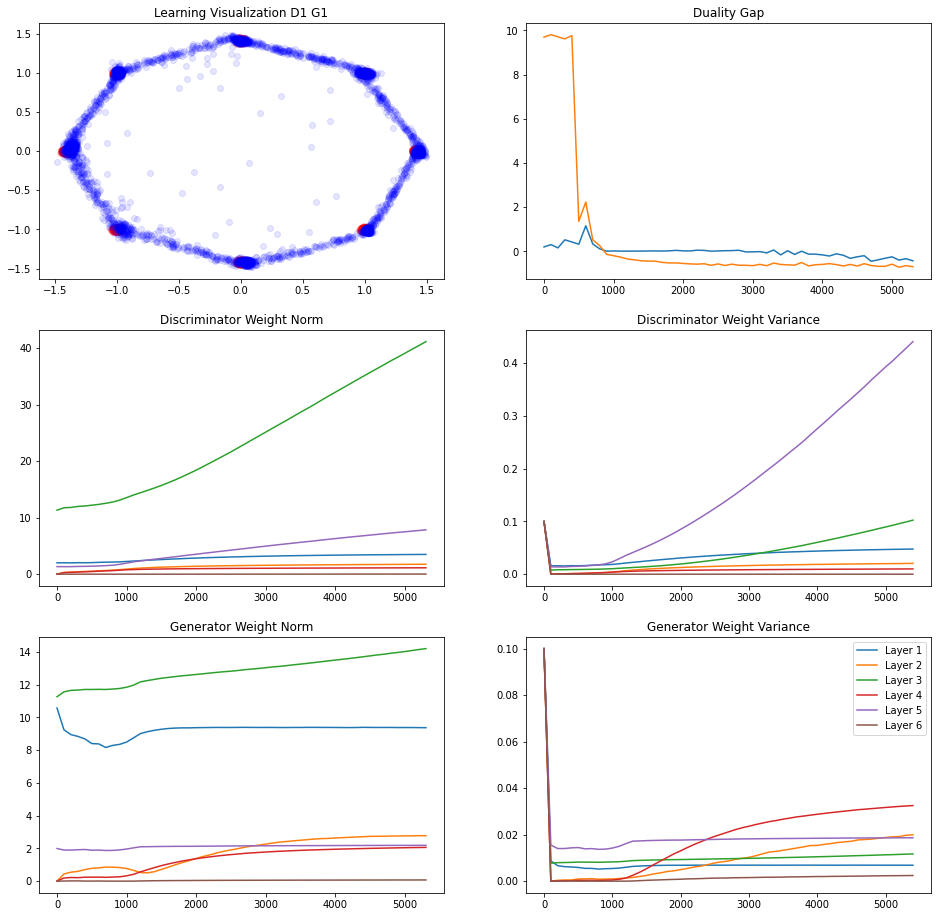

249/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.43388093
L Random  Duality Gap :  -0.64606136


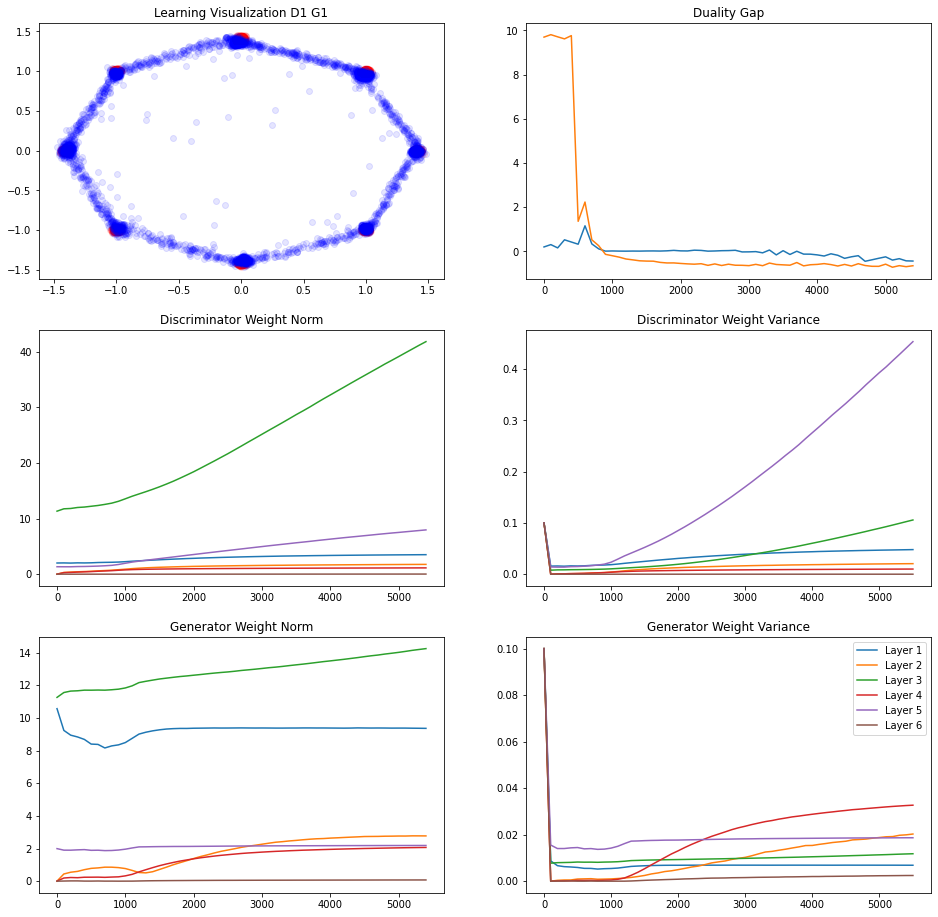

237/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.5208983
L Random  Duality Gap :  -0.74162644
245/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.2931649
L Random  Duality Gap :  -0.61759526


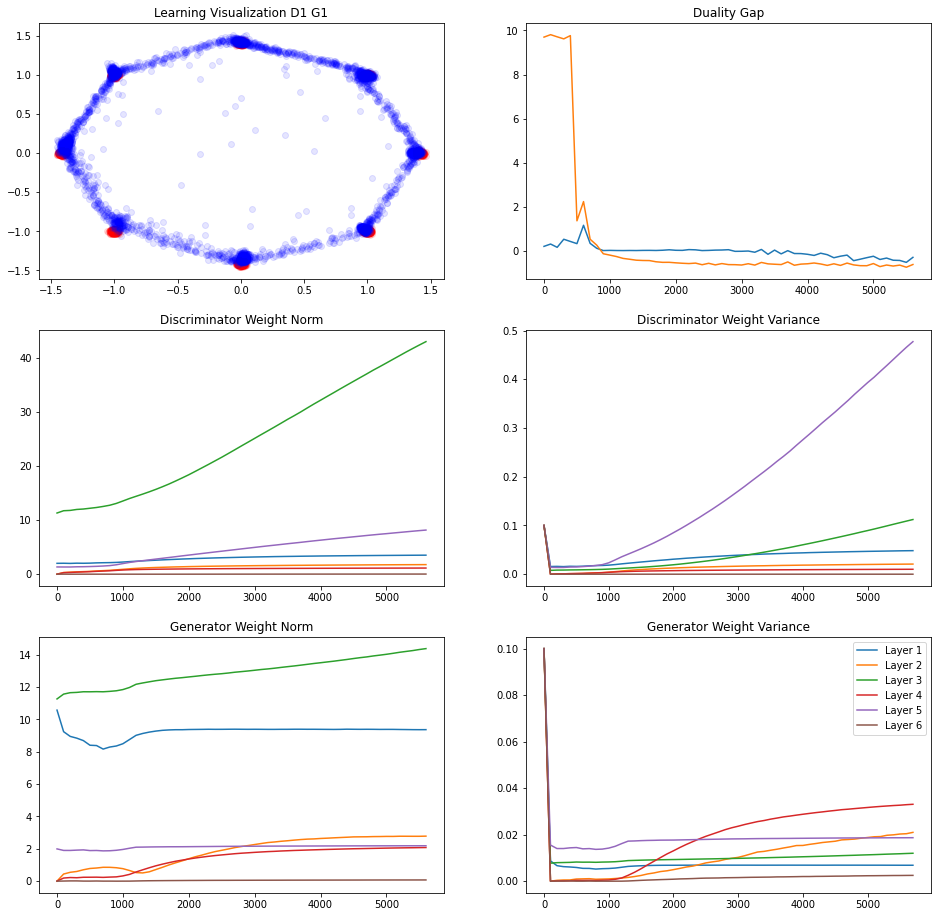

245/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.40957916
L Random  Duality Gap :  -0.71663797


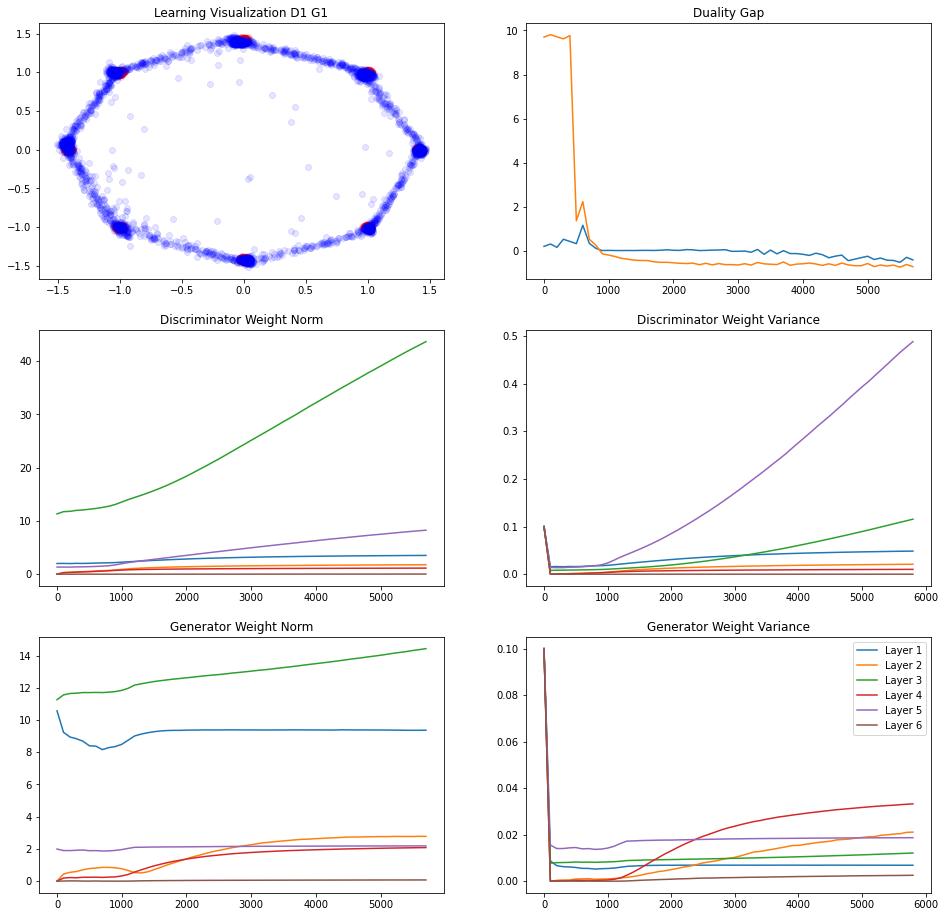

237/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.45638585
L Random  Duality Gap :  -0.7584686


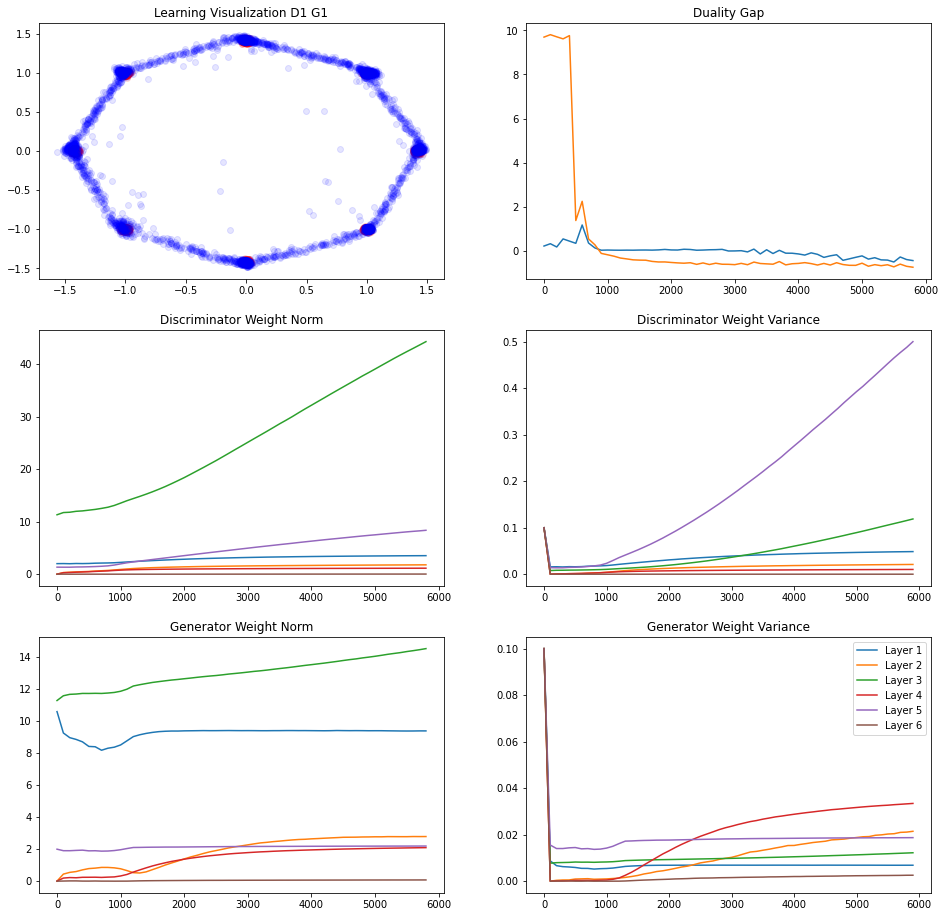

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.35768974
L Random  Duality Gap :  -0.68317705


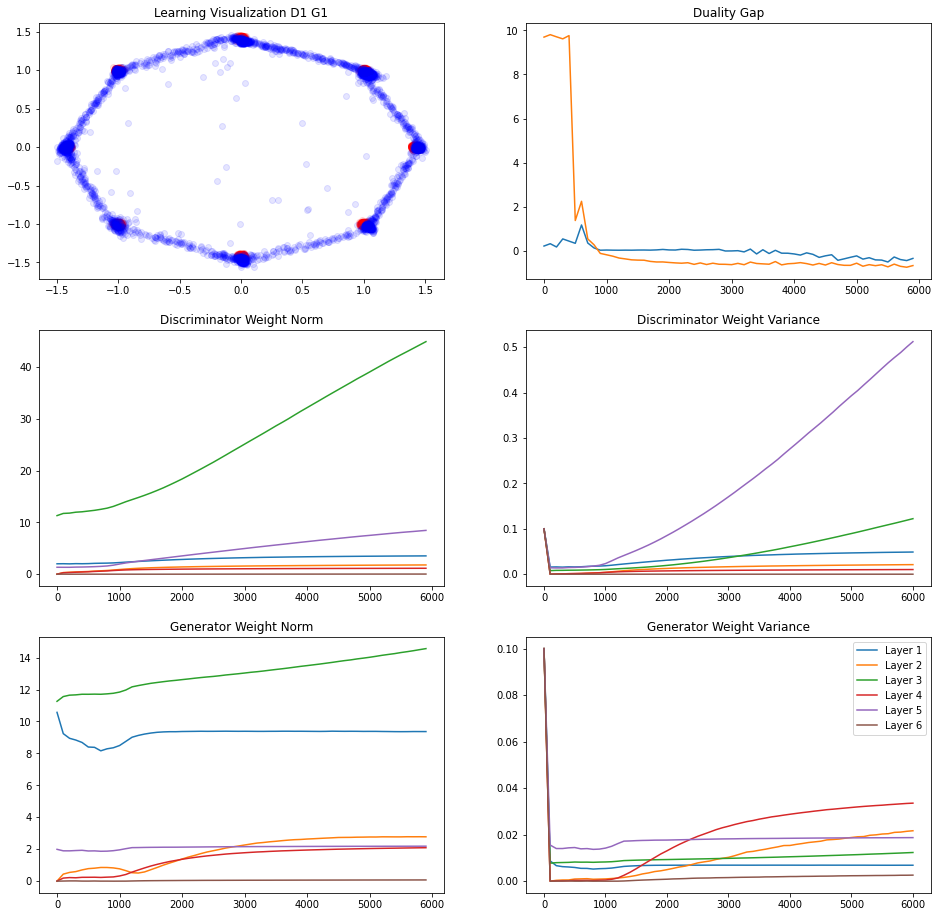

234/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.40338242
L Random  Duality Gap :  -0.6775078
248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.4202569
L Random  Duality Gap :  -0.59207475


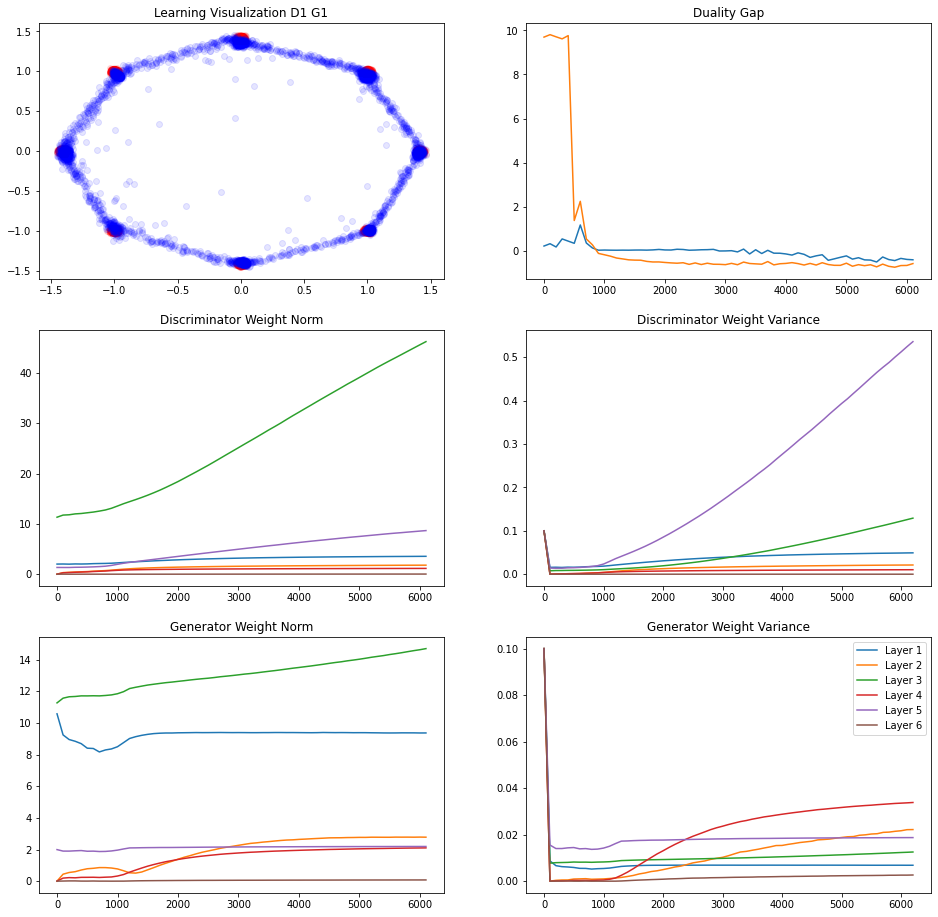

239/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.31601536
L Random  Duality Gap :  -0.66372865


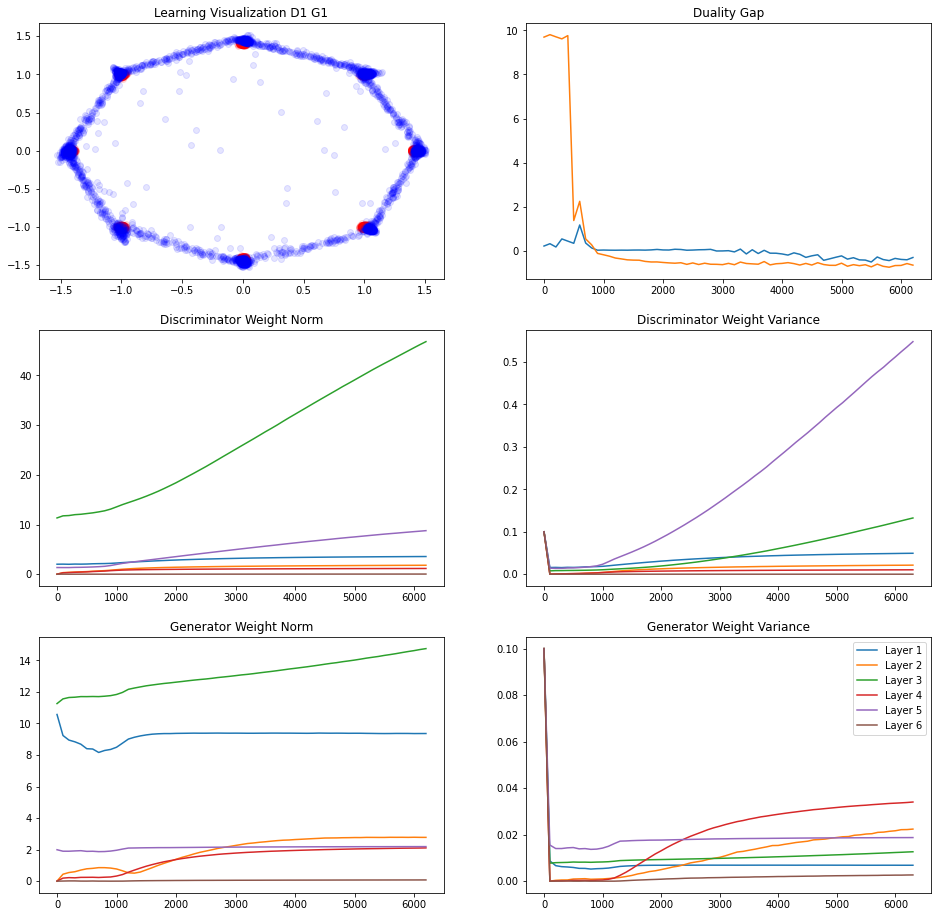

246/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.5004491
L Random  Duality Gap :  -0.71227926


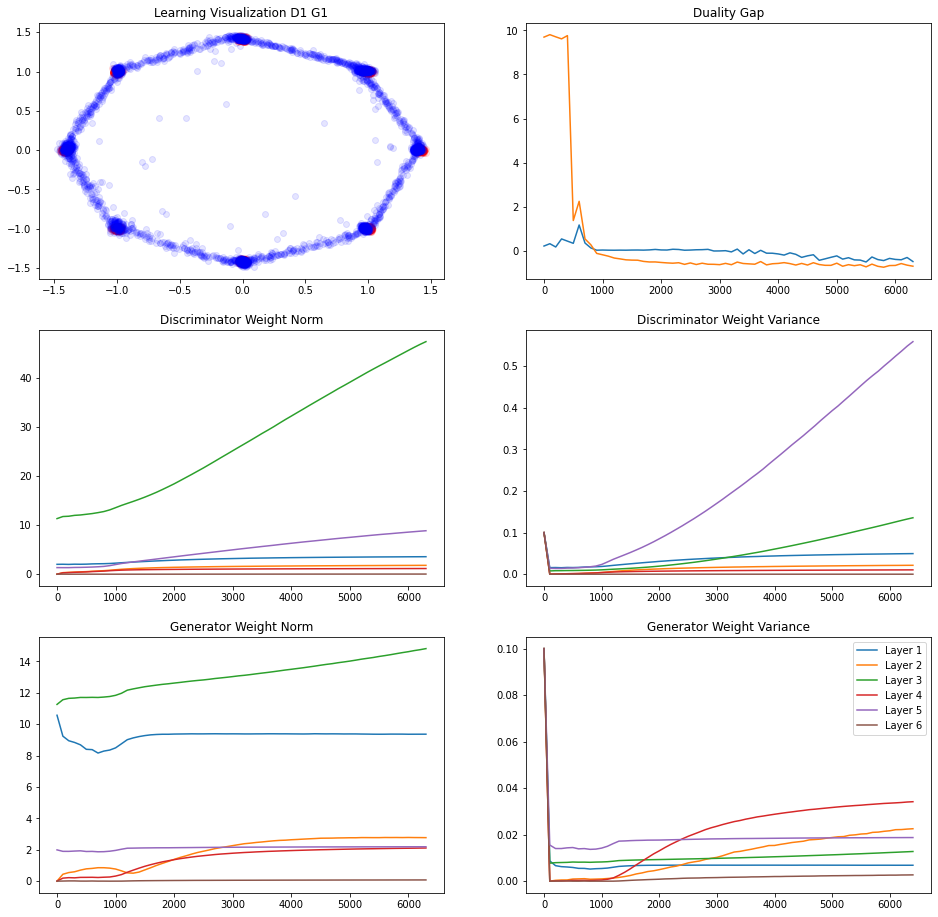

241/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.48708755
L Random  Duality Gap :  -0.70461136


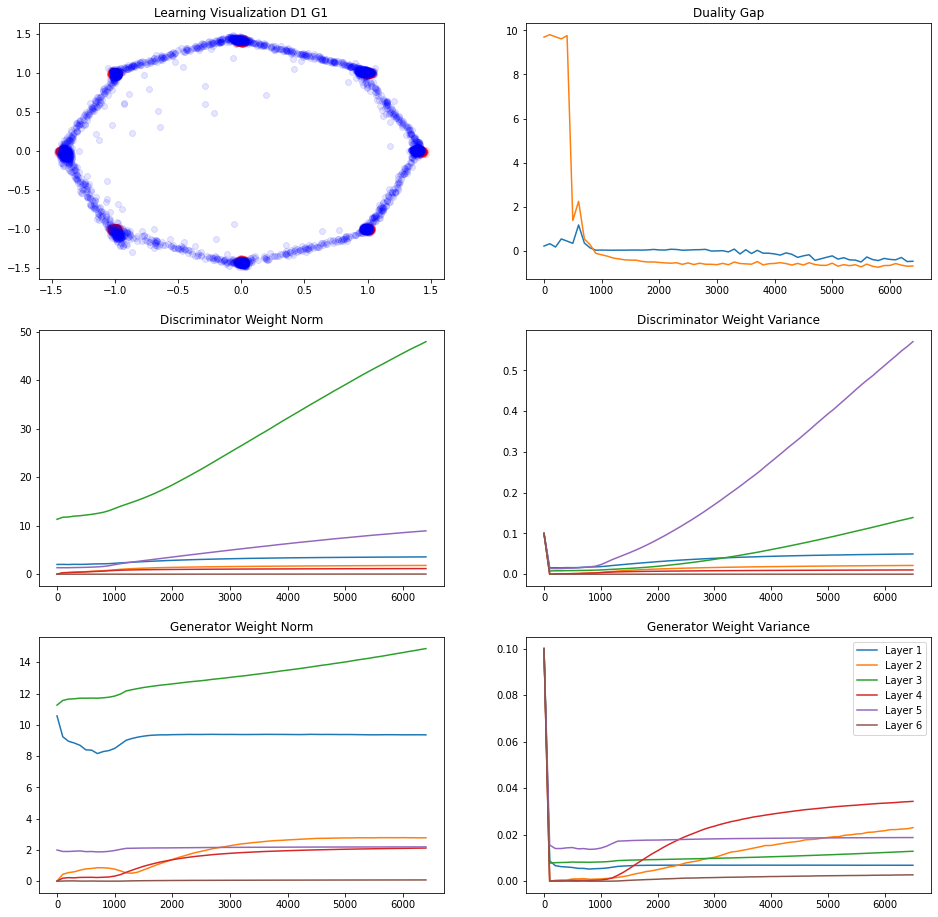

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.4041736
L Random  Duality Gap :  -0.71069896
246/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.34280545
L Random  Duality Gap :  -0.74360883


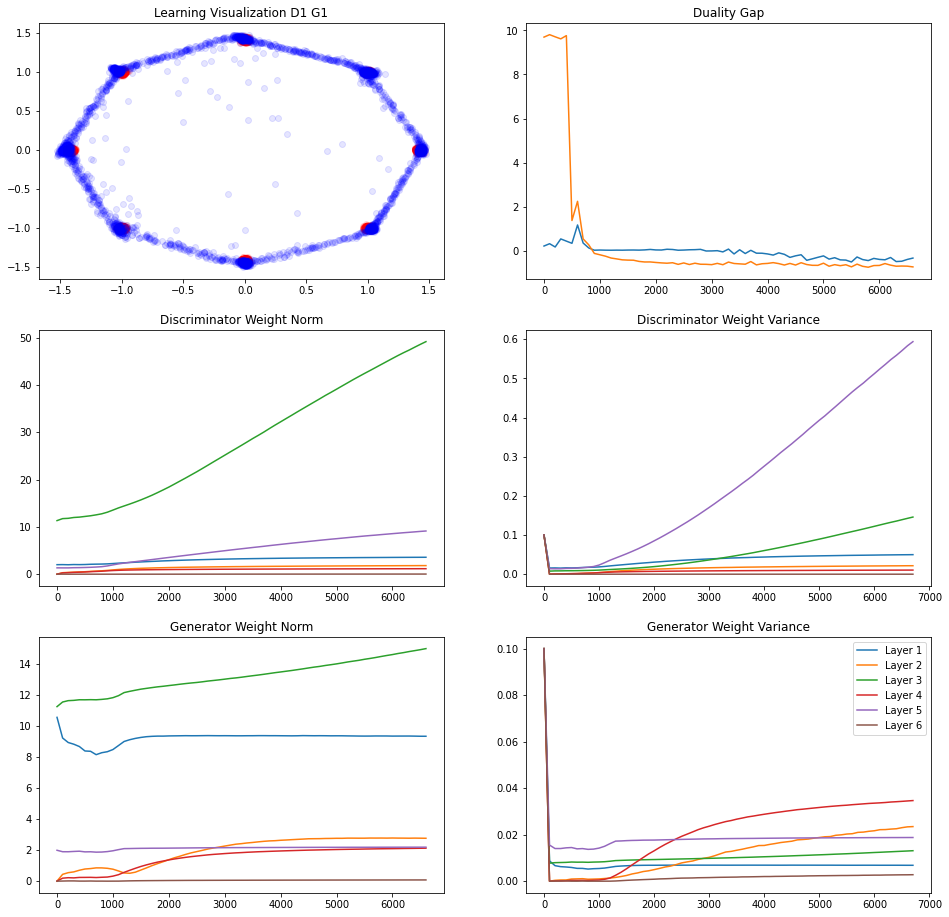

242/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.5020437
L Random  Duality Gap :  -0.77649814


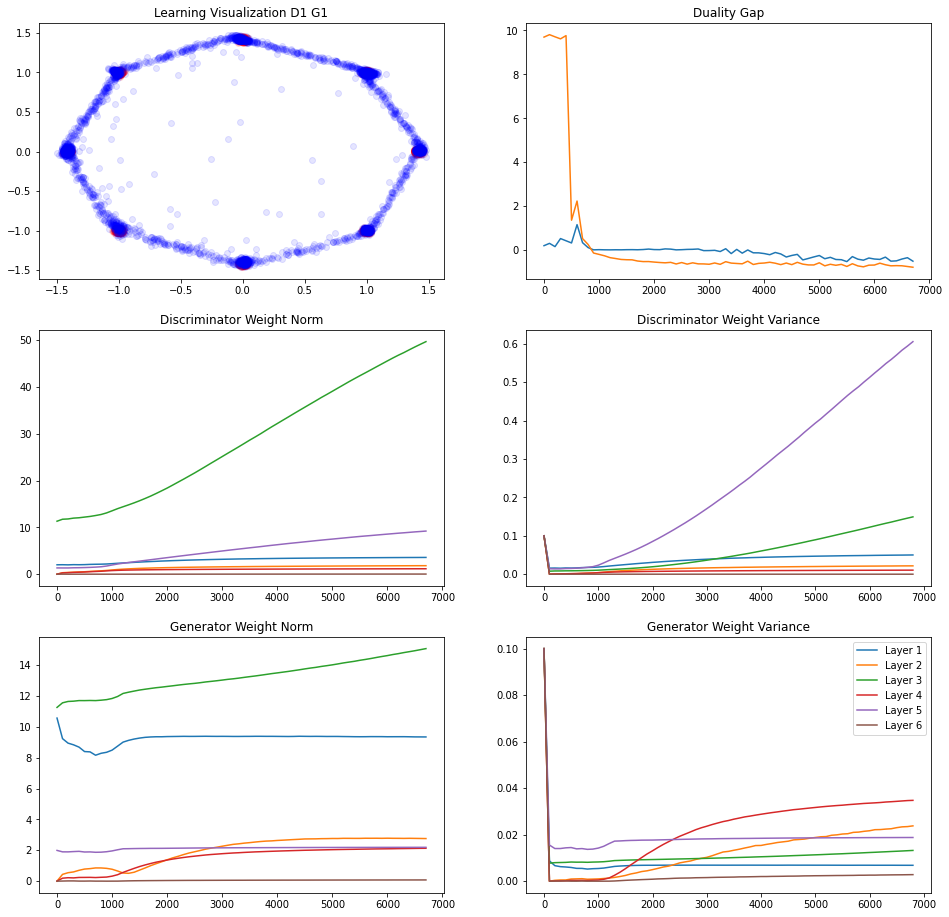

245/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.48263276
L Random  Duality Gap :  -0.66808254


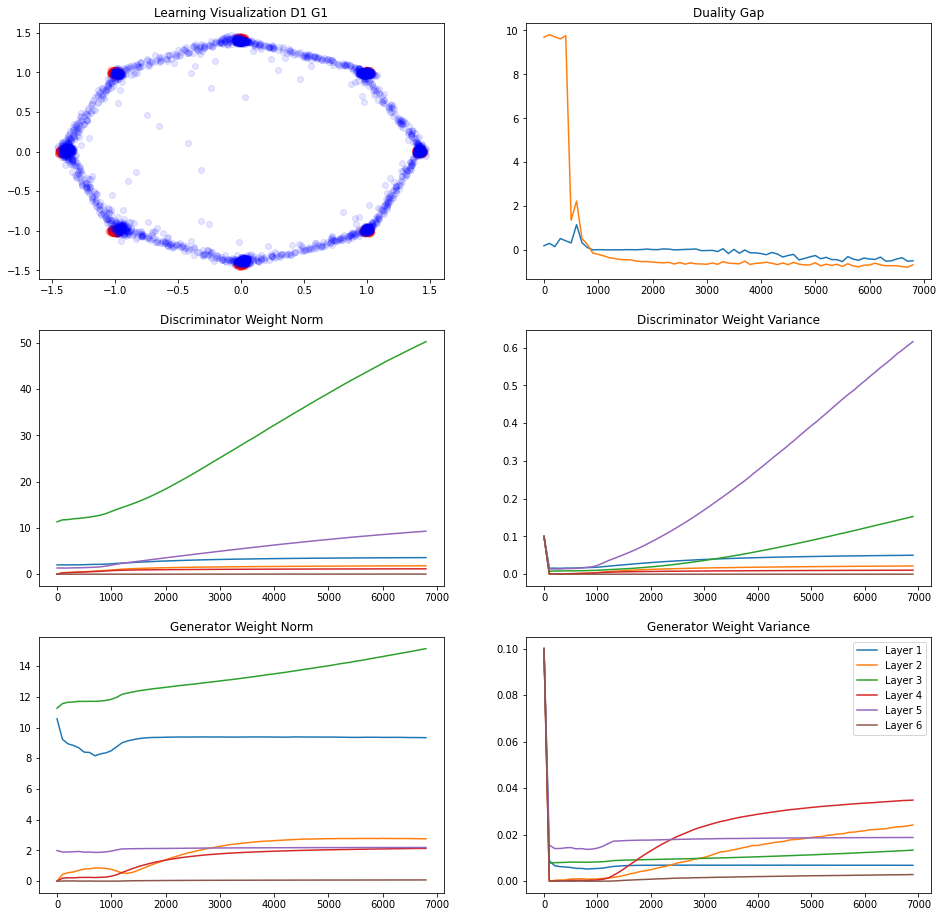

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.4951678
L Random  Duality Gap :  -0.6662766


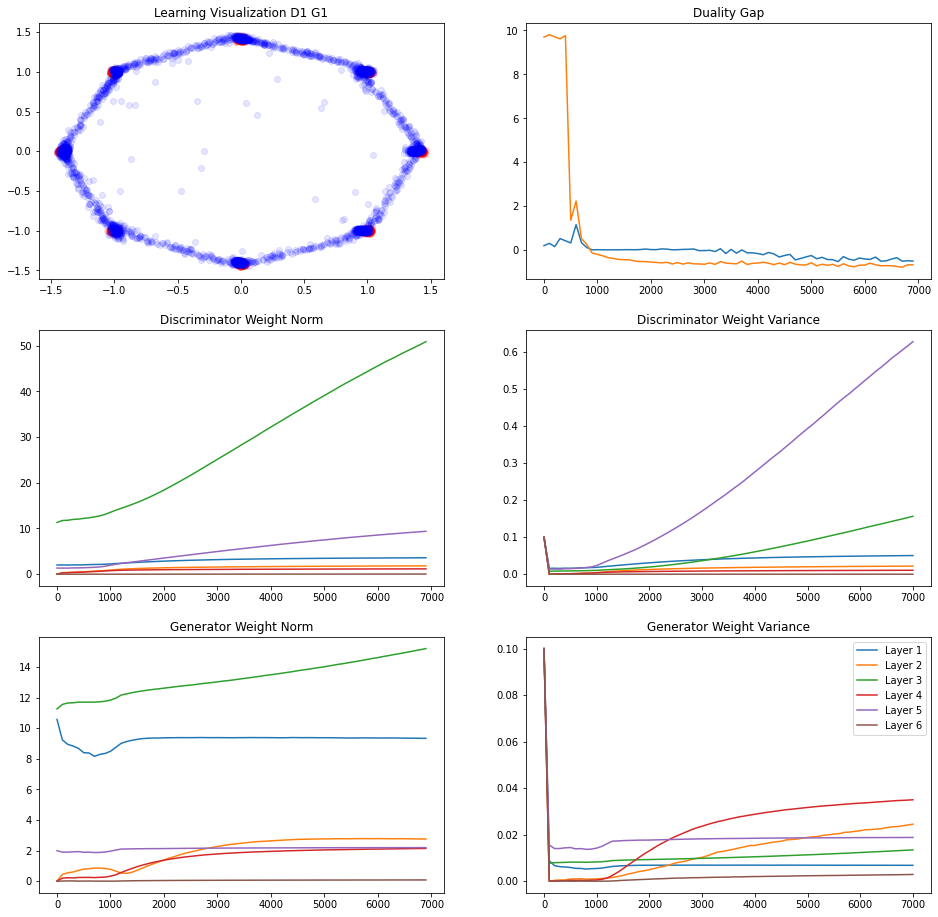

241/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.36635774
L Random  Duality Gap :  -0.5553453
249/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.47387058
L Random  Duality Gap :  -0.7135055


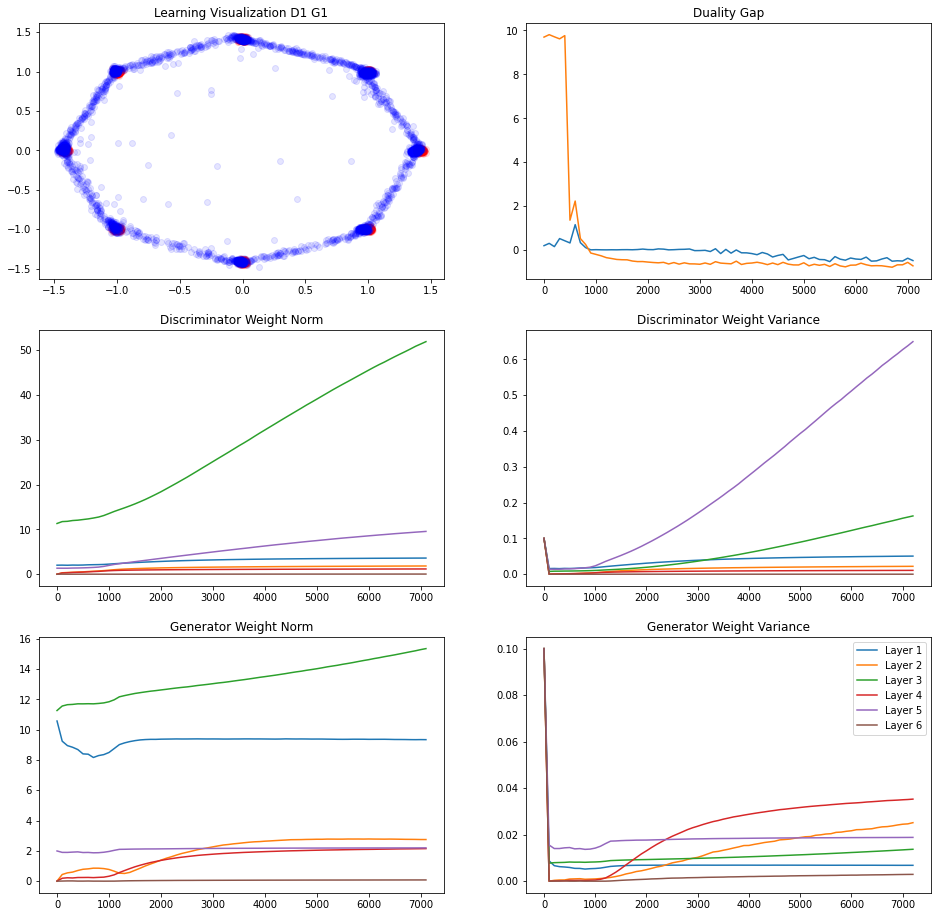

241/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.3453219
L Random  Duality Gap :  -0.6458101


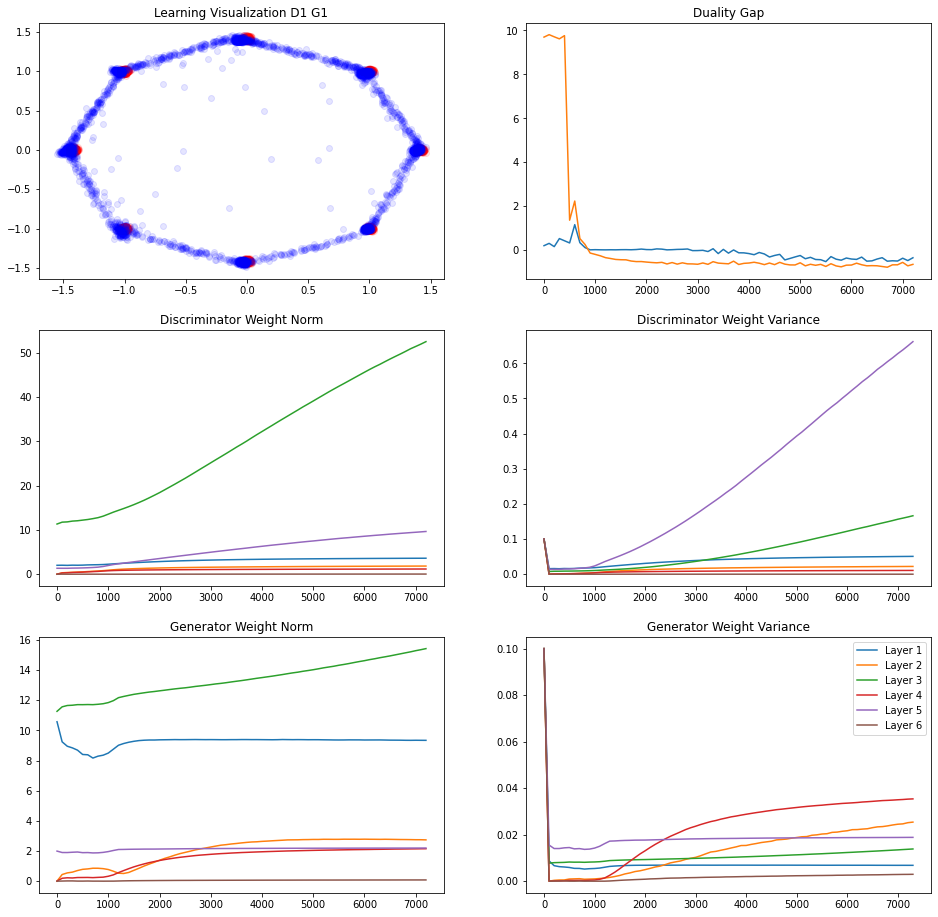

237/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.4227032
L Random  Duality Gap :  -0.65863335


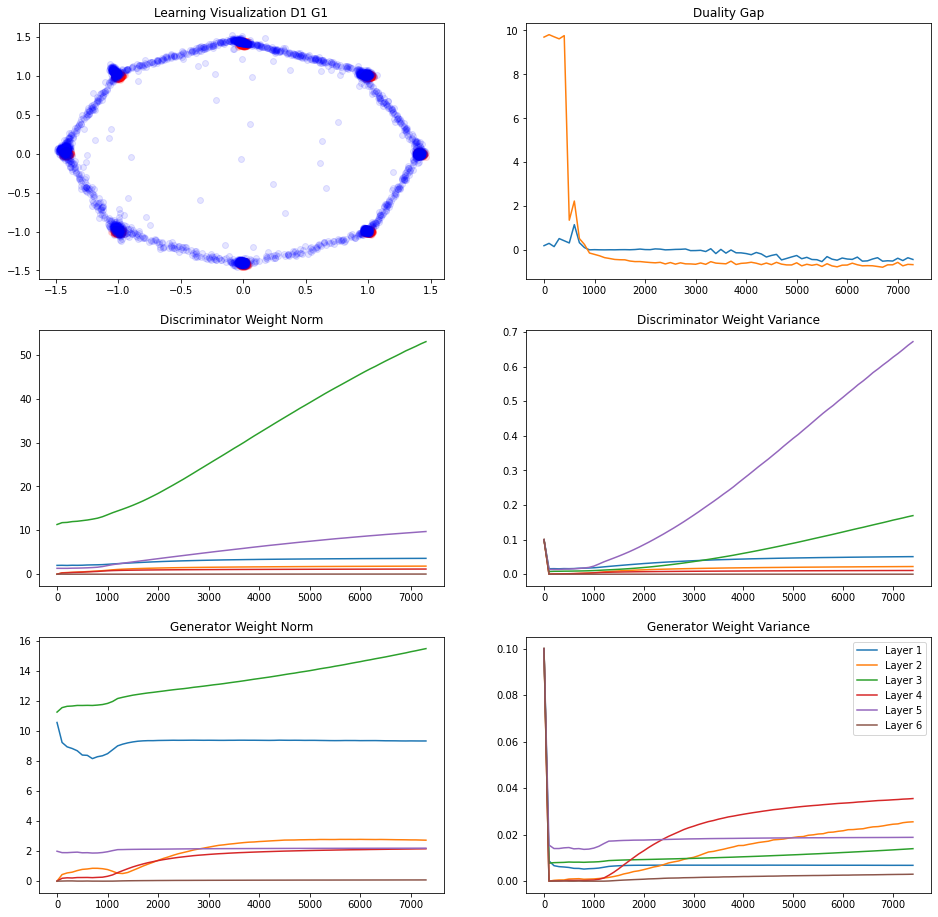

238/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.34618026
L Random  Duality Gap :  -0.6176086


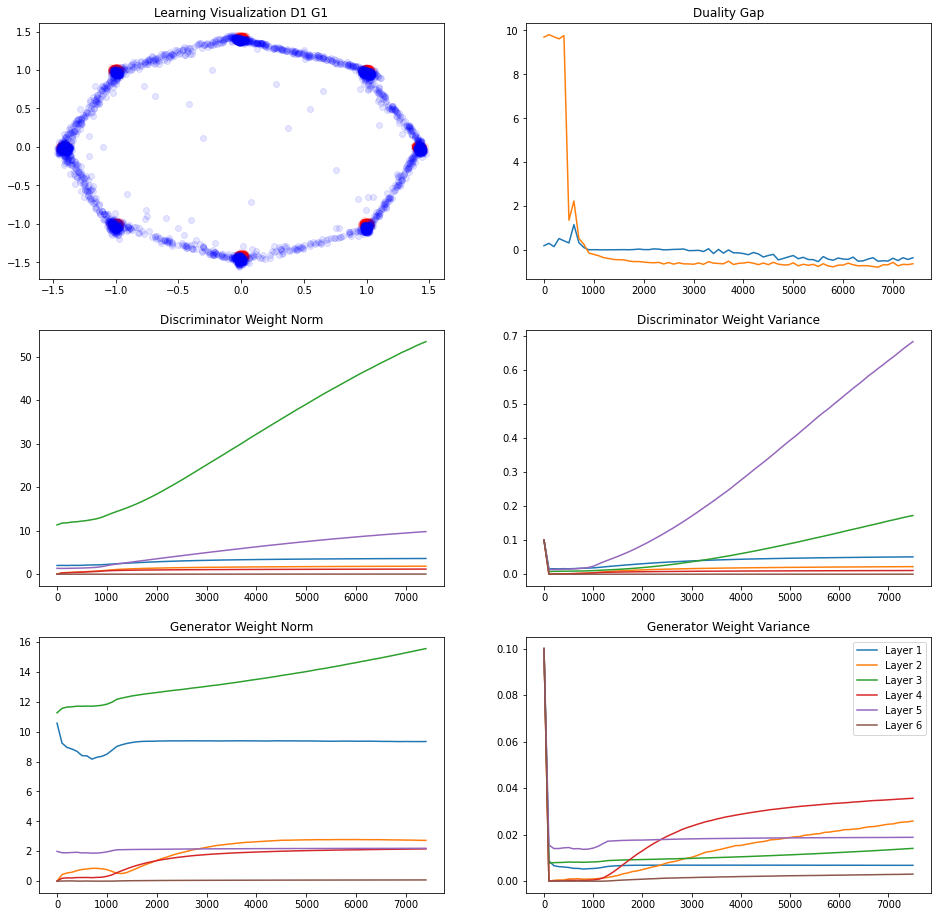

249/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.3778121
L Random  Duality Gap :  -0.60676247
243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.32141906
L Random  Duality Gap :  -0.63467926


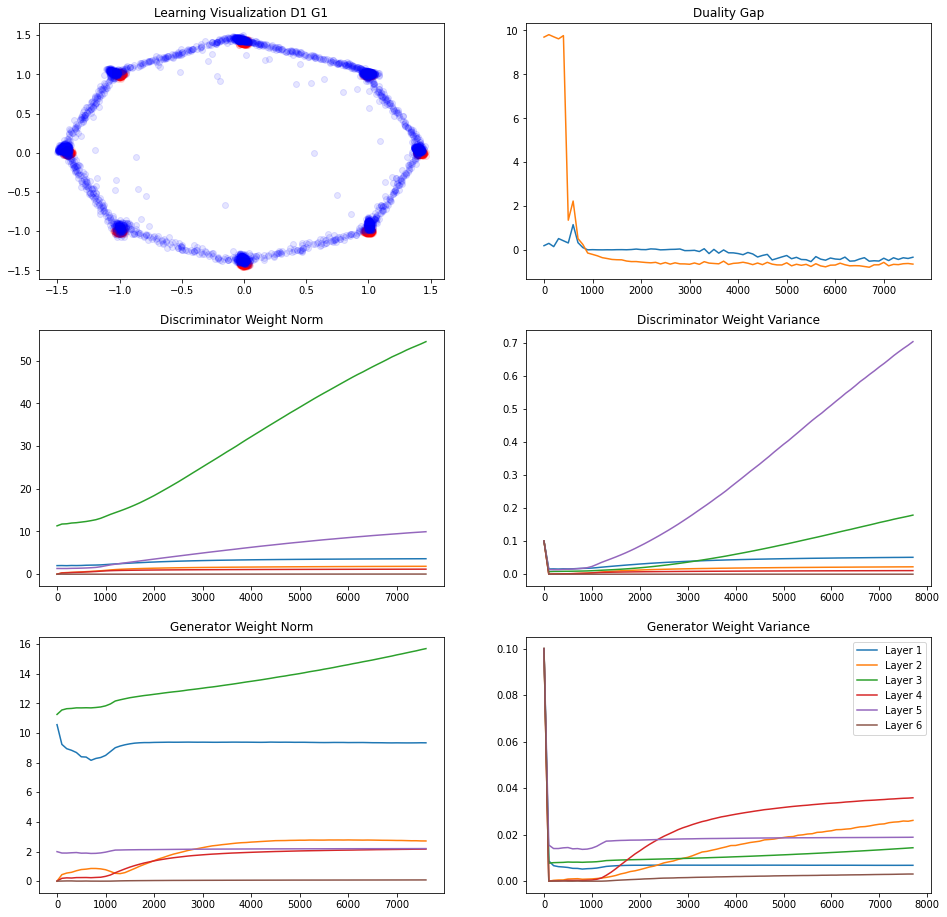

248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.3241014
L Random  Duality Gap :  -0.70589066


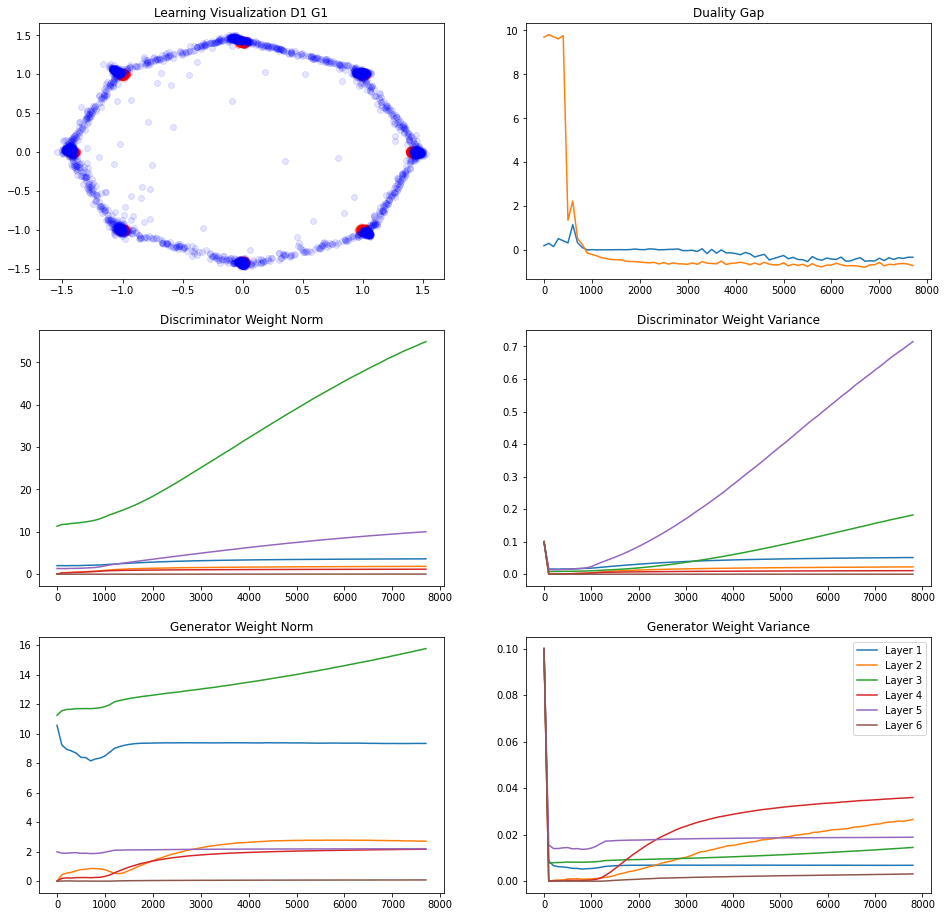

249/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.38452315
L Random  Duality Gap :  -0.63572335


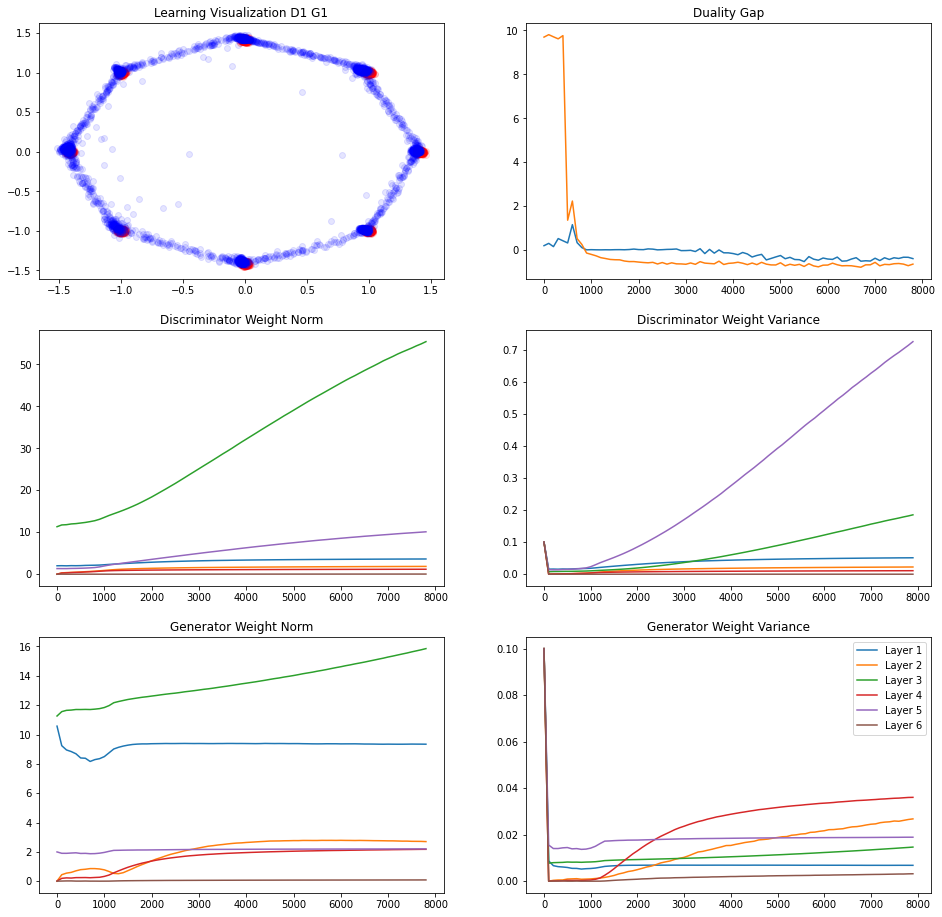

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.3312136
L Random  Duality Gap :  -0.5740477


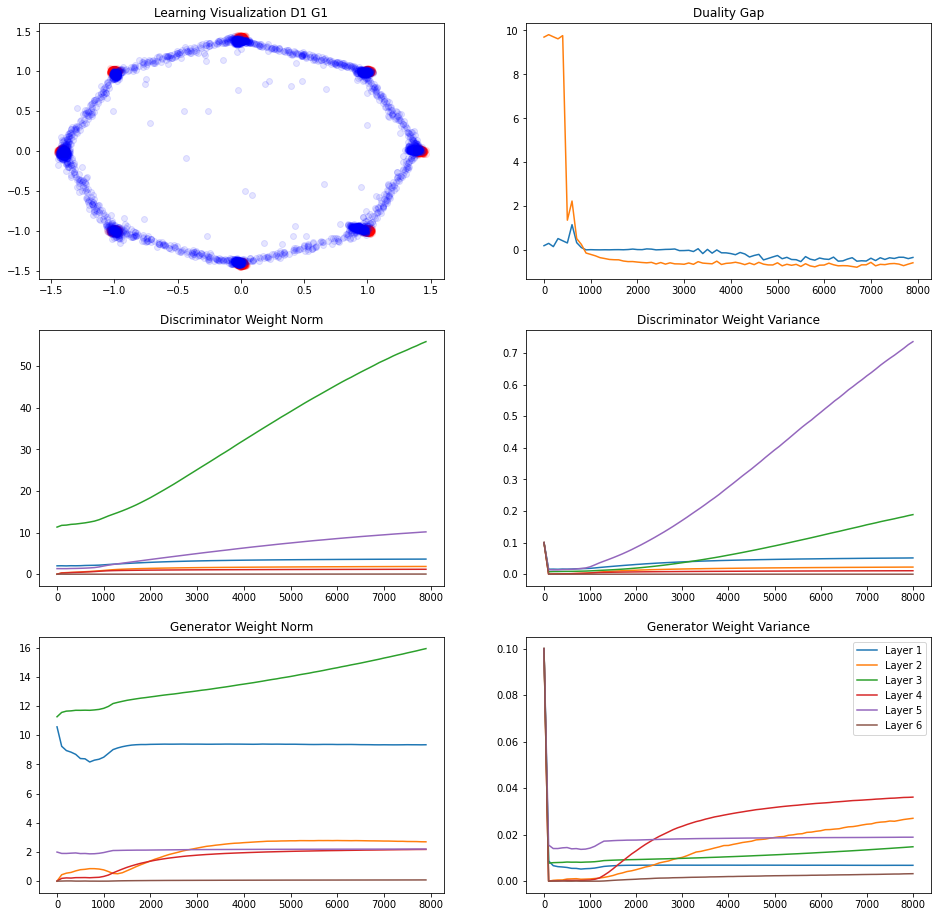

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.42271453
L Random  Duality Gap :  -0.69750476
237/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.3581578
L Random  Duality Gap :  -0.6515354


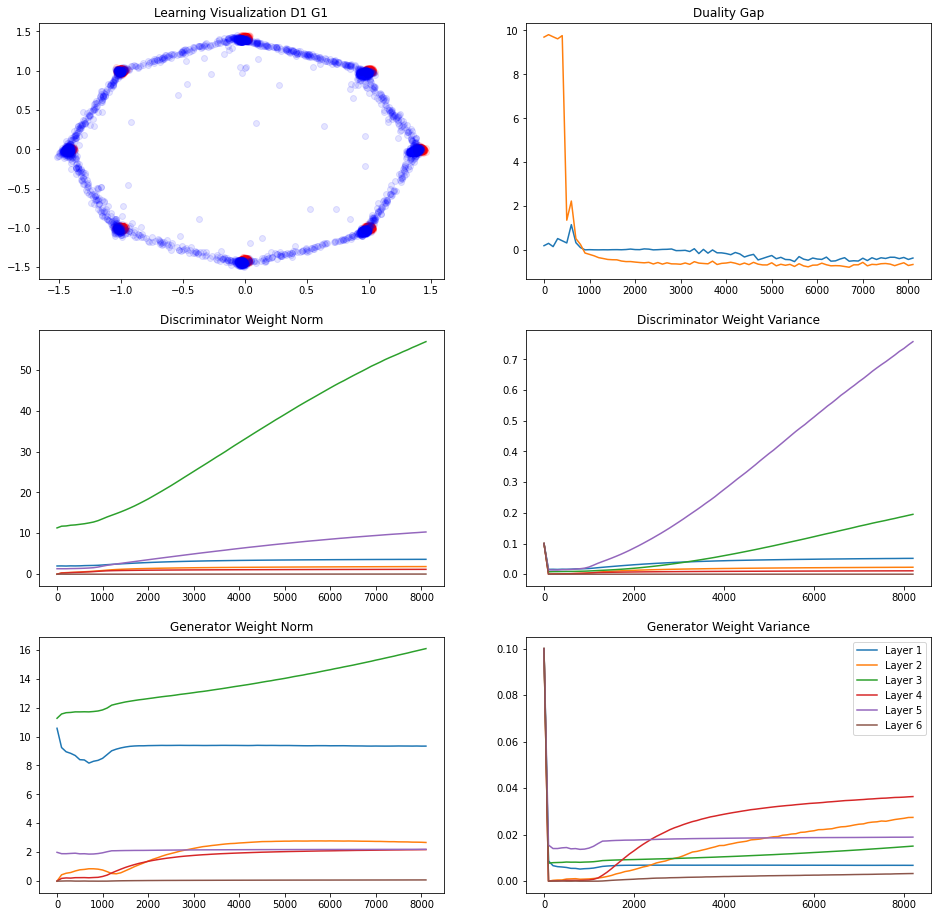

244/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.5026371
L Random  Duality Gap :  -0.7406427


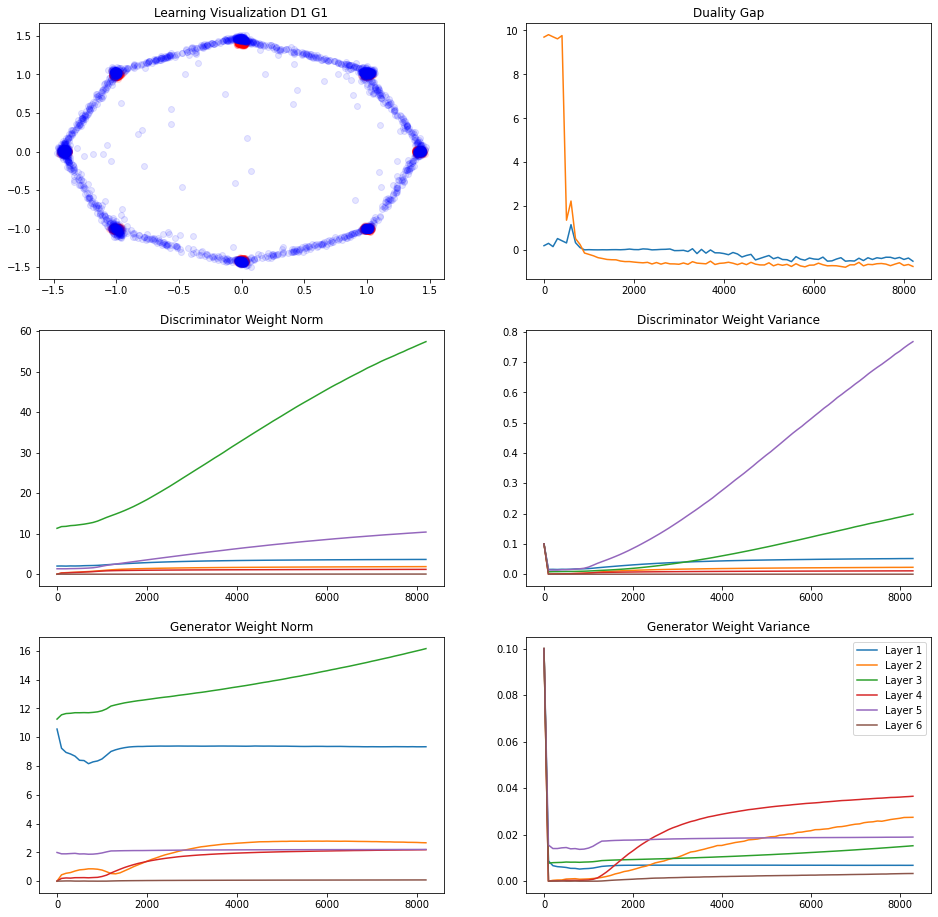

235/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.5377499
L Random  Duality Gap :  -0.74521726


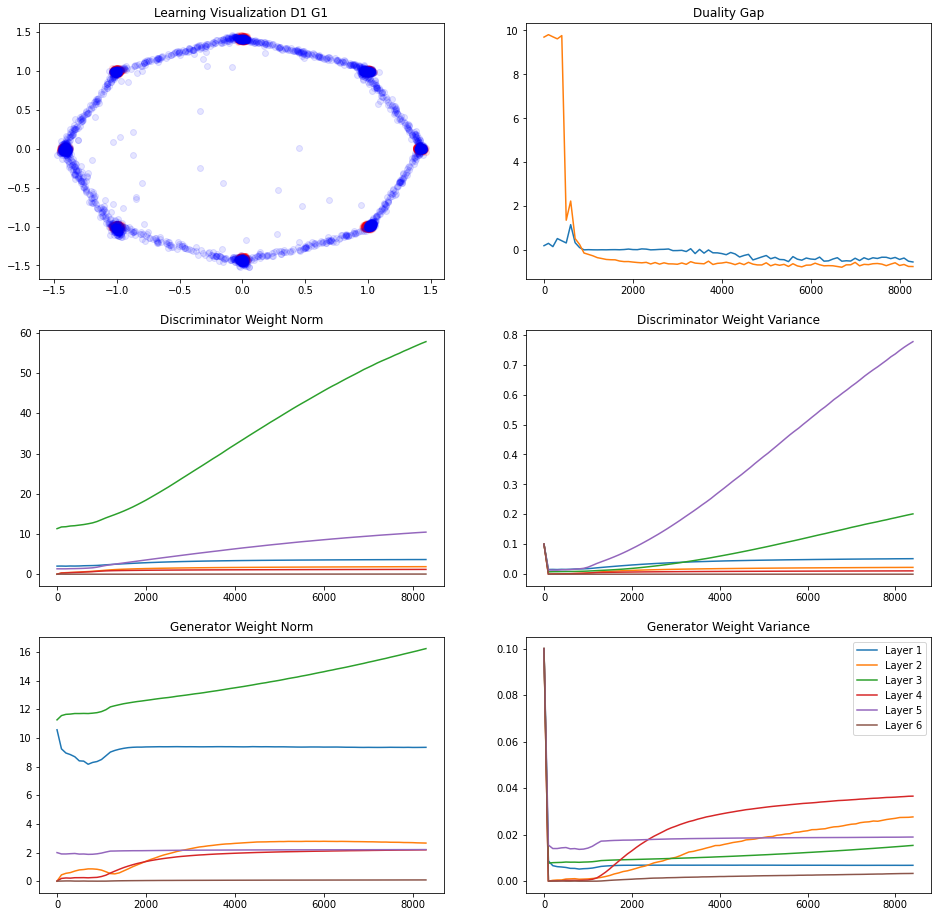

247/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.35602754
L Random  Duality Gap :  -0.57402


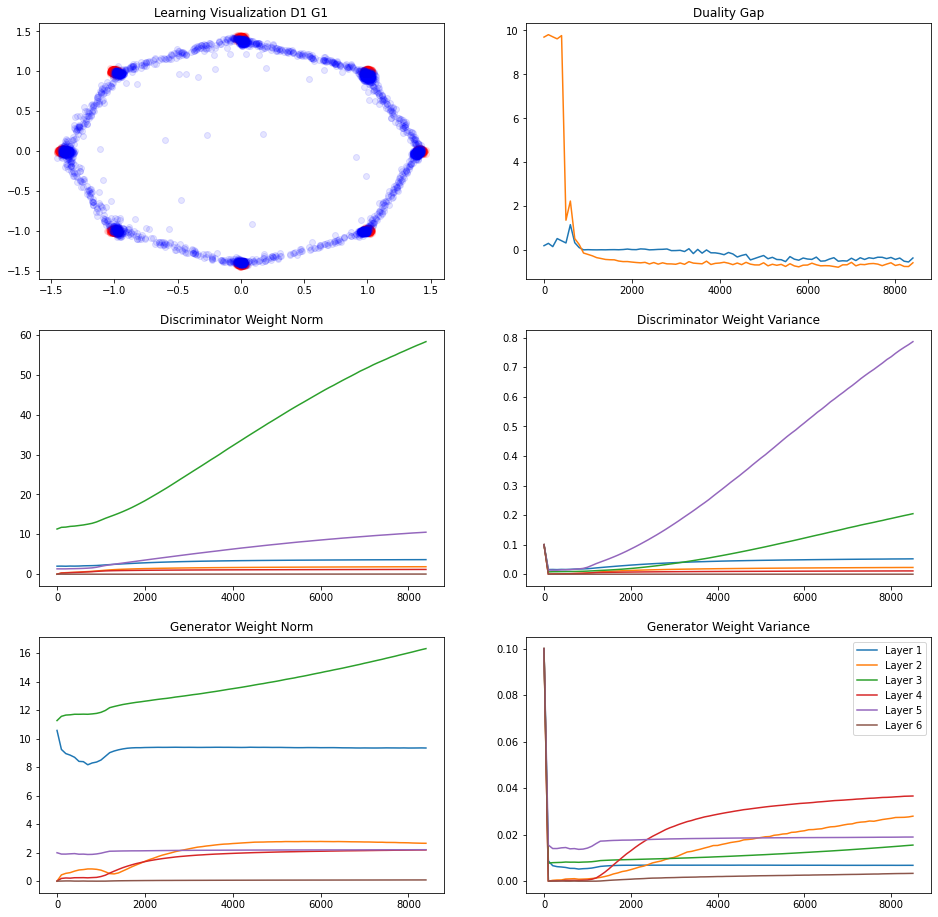

245/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.2113396
L Random  Duality Gap :  -0.66951334
235/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.46117276
L Random  Duality Gap :  -0.6465777


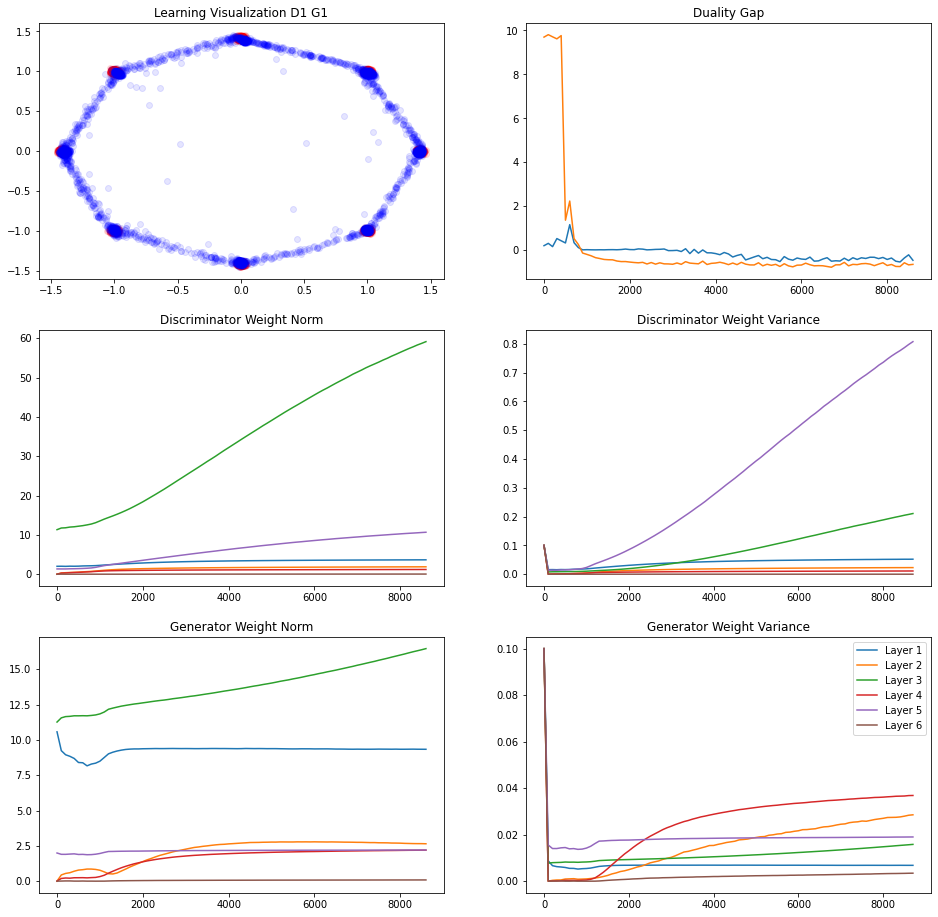

240/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.41659003
L Random  Duality Gap :  -0.6461558


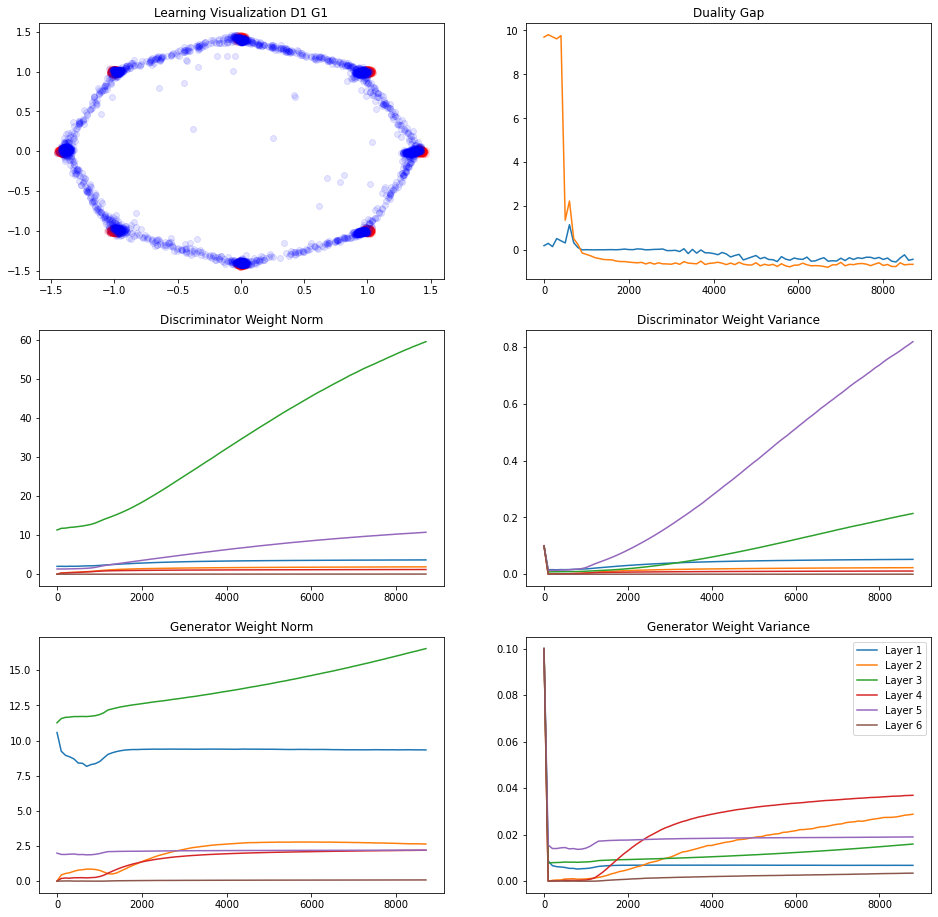

249/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.44817138
L Random  Duality Gap :  -0.7152948


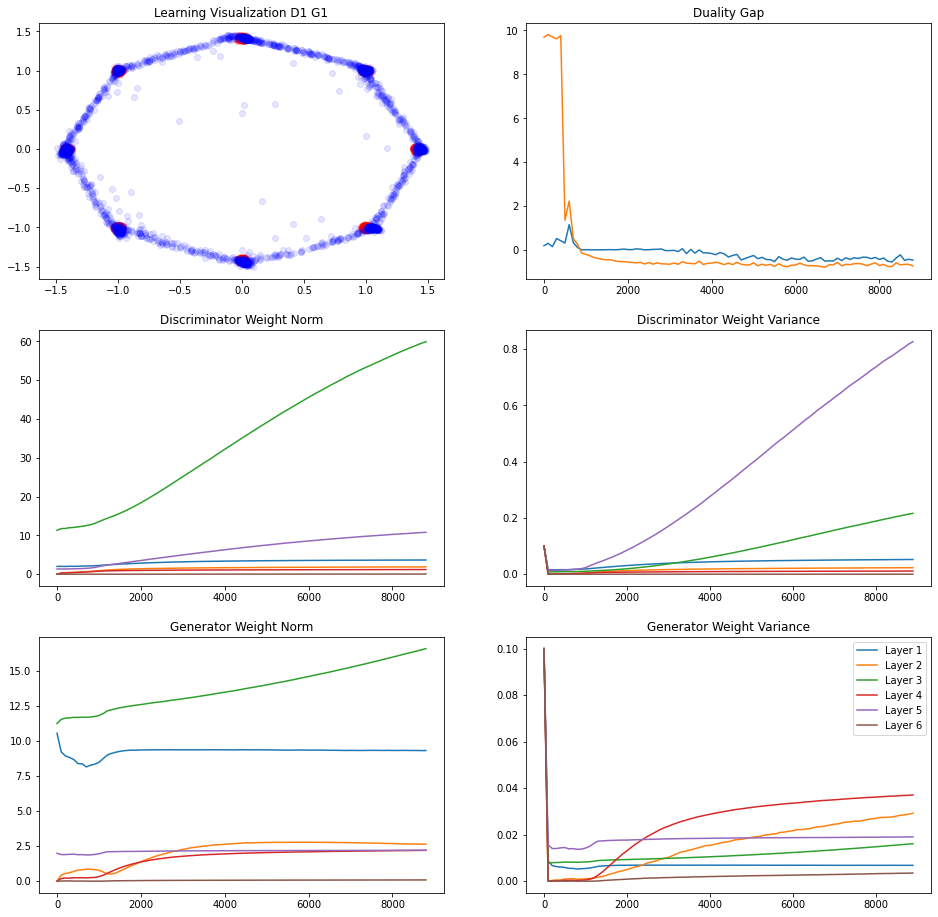

249/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.38729334
L Random  Duality Gap :  -0.62025887


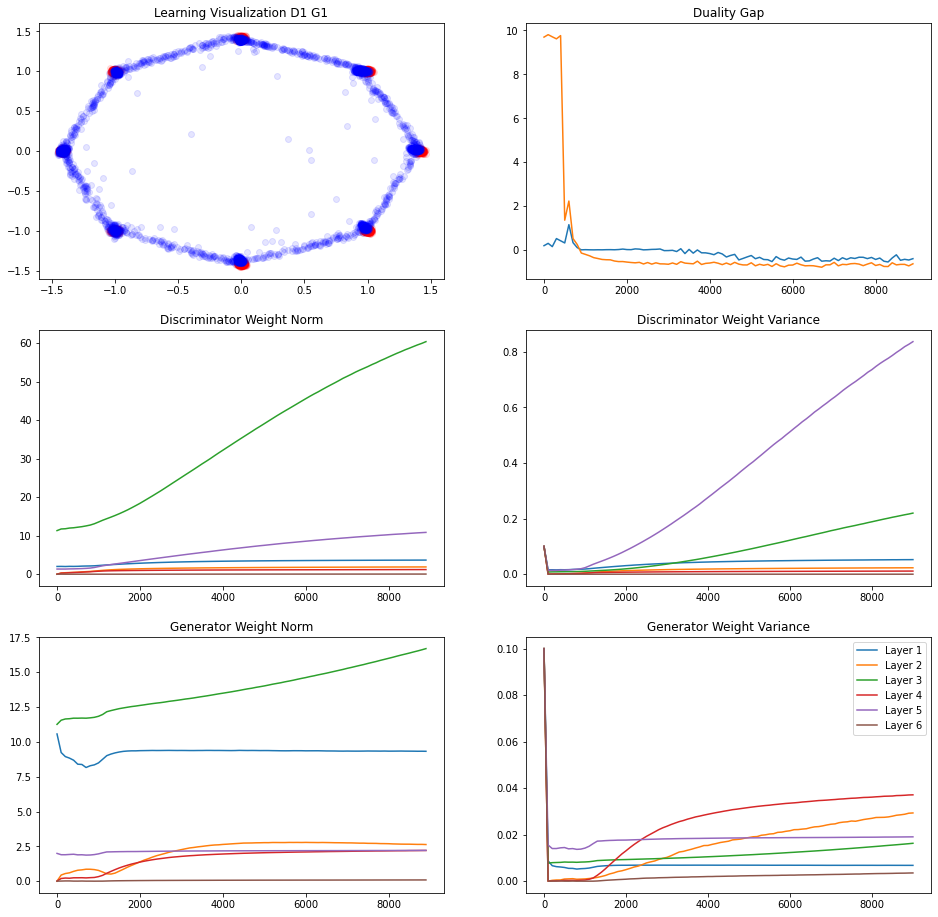

238/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.31535357
L Random  Duality Gap :  -0.6092117
243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.46309704
L Random  Duality Gap :  -0.6973144


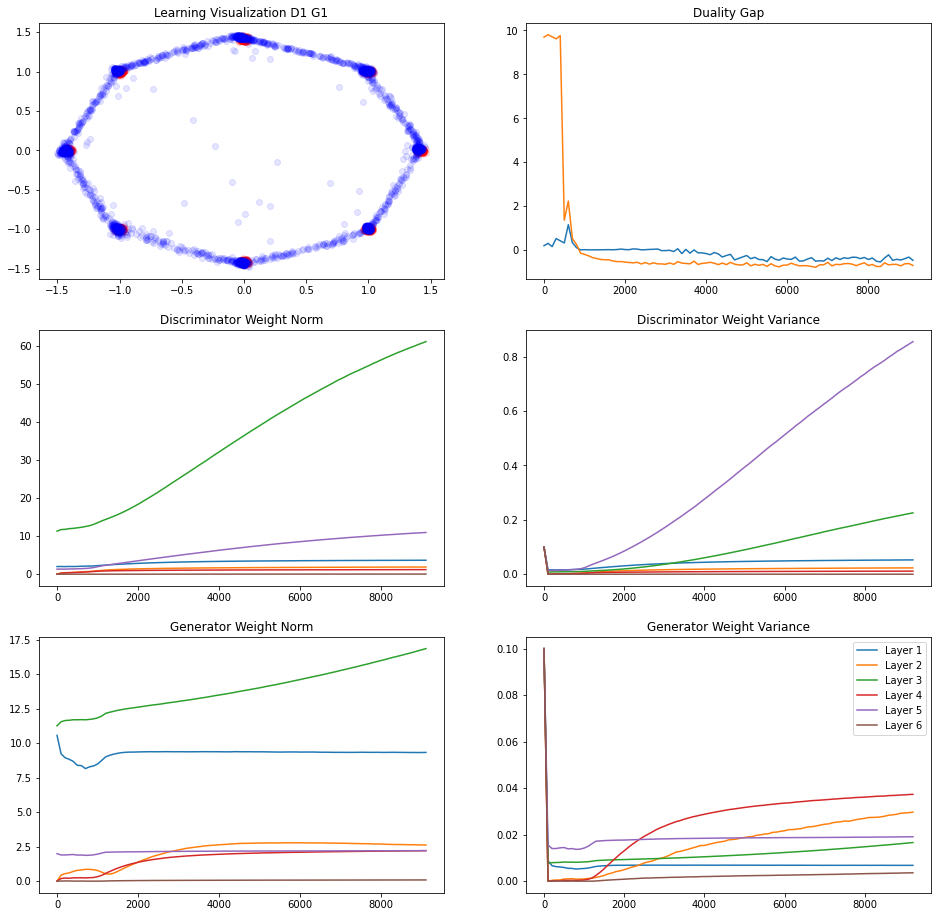

248/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.5066818
L Random  Duality Gap :  -0.7149162


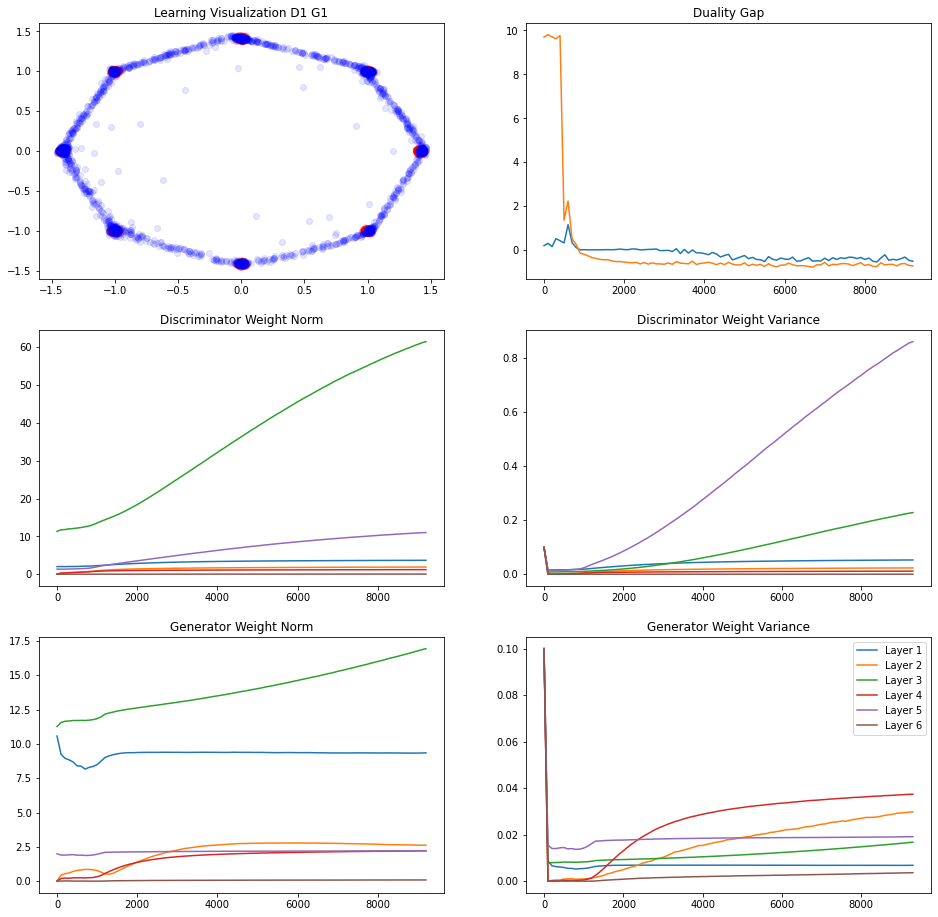

239/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.49536443
L Random  Duality Gap :  -0.7257244


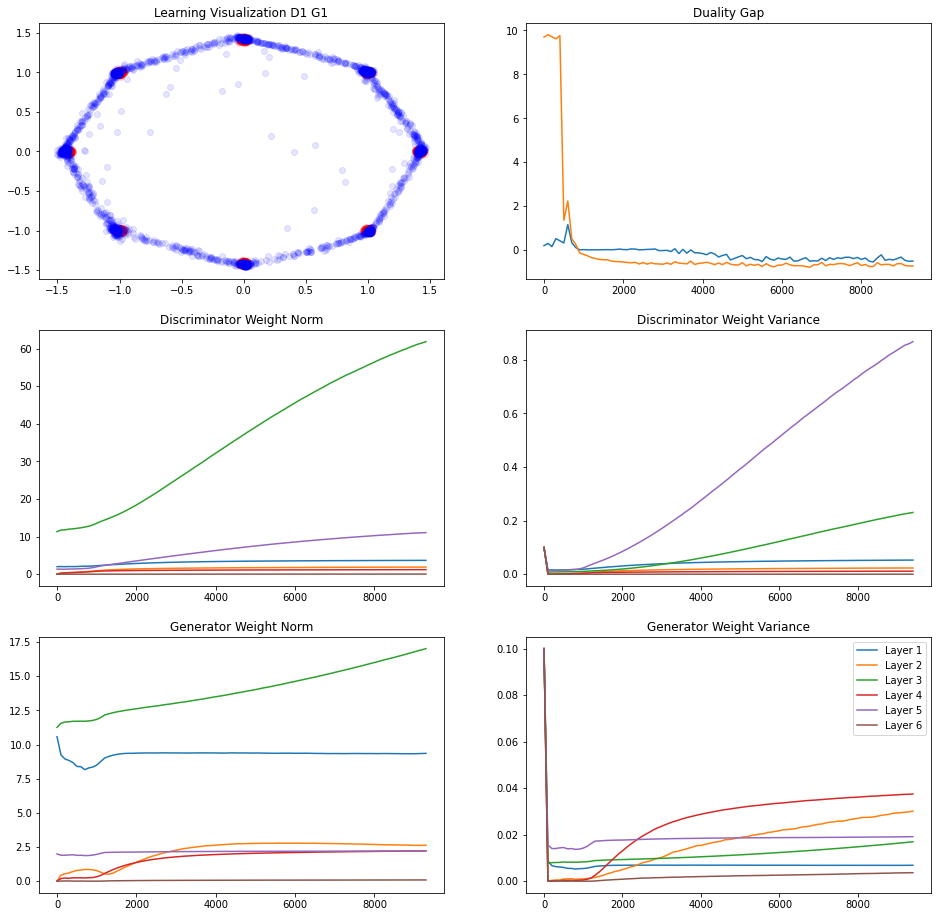

245/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.47056025
L Random  Duality Gap :  -0.69585127


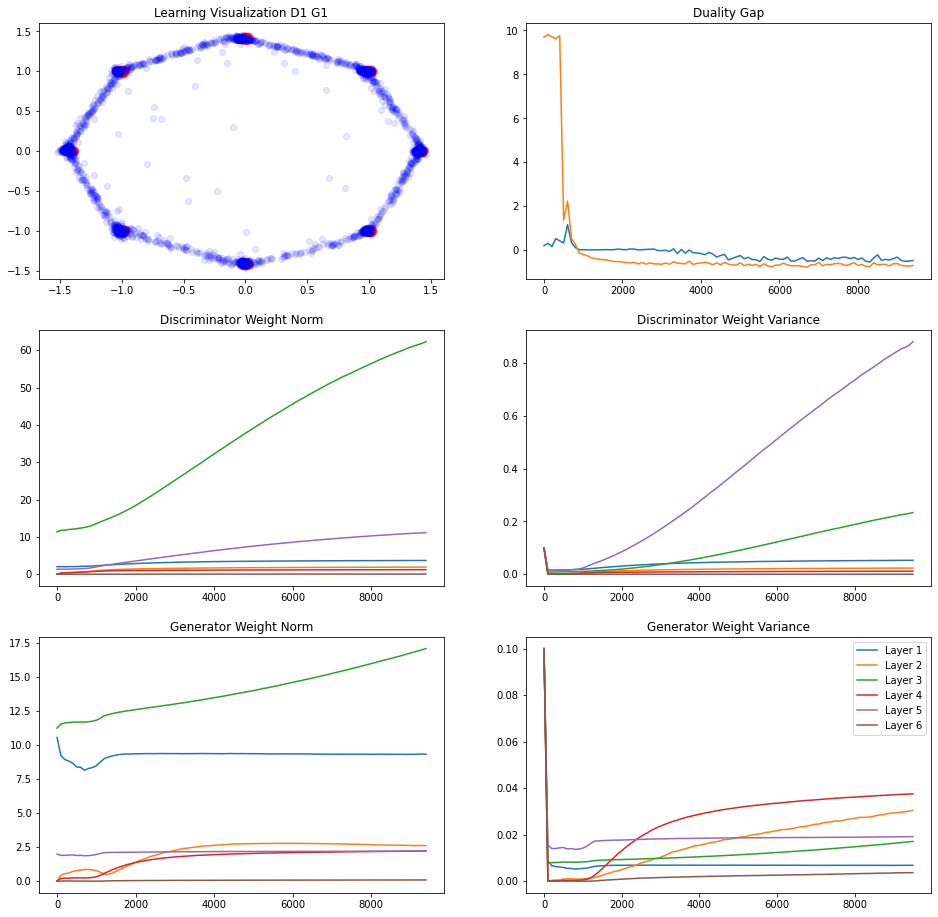

235/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.22613251
L Random  Duality Gap :  -0.48287785
246/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.53577125
L Random  Duality Gap :  -0.7088866


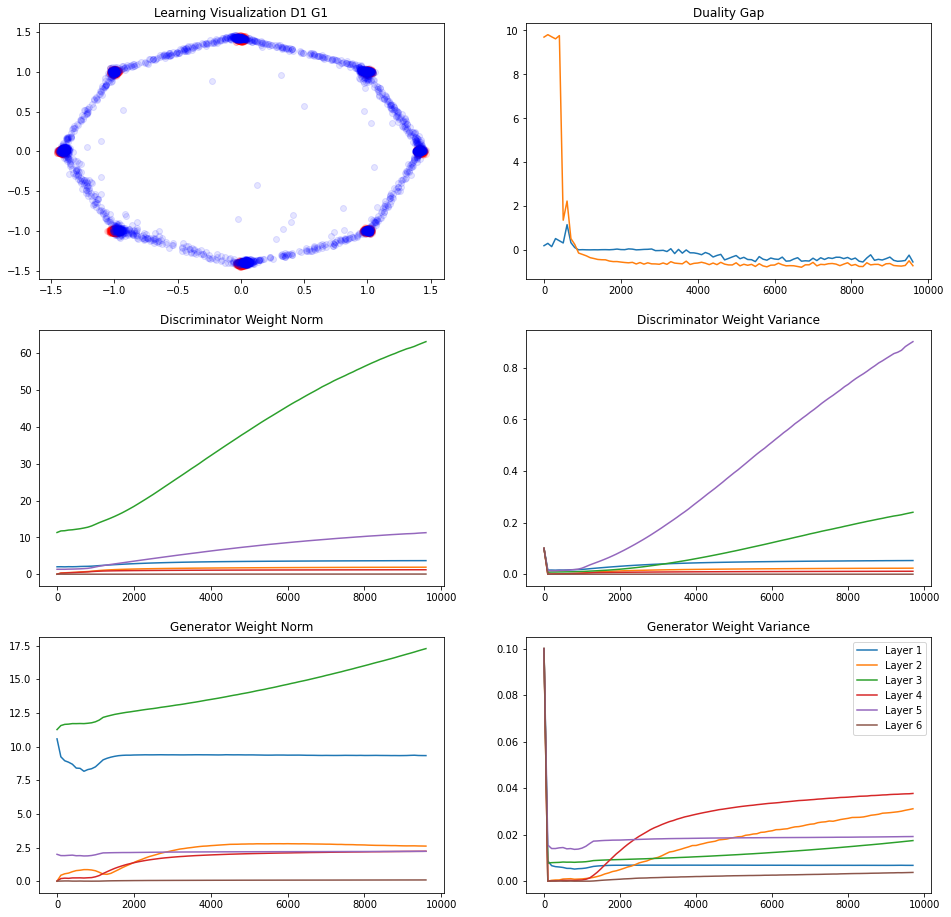

240/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.43909448
L Random  Duality Gap :  -0.74127394


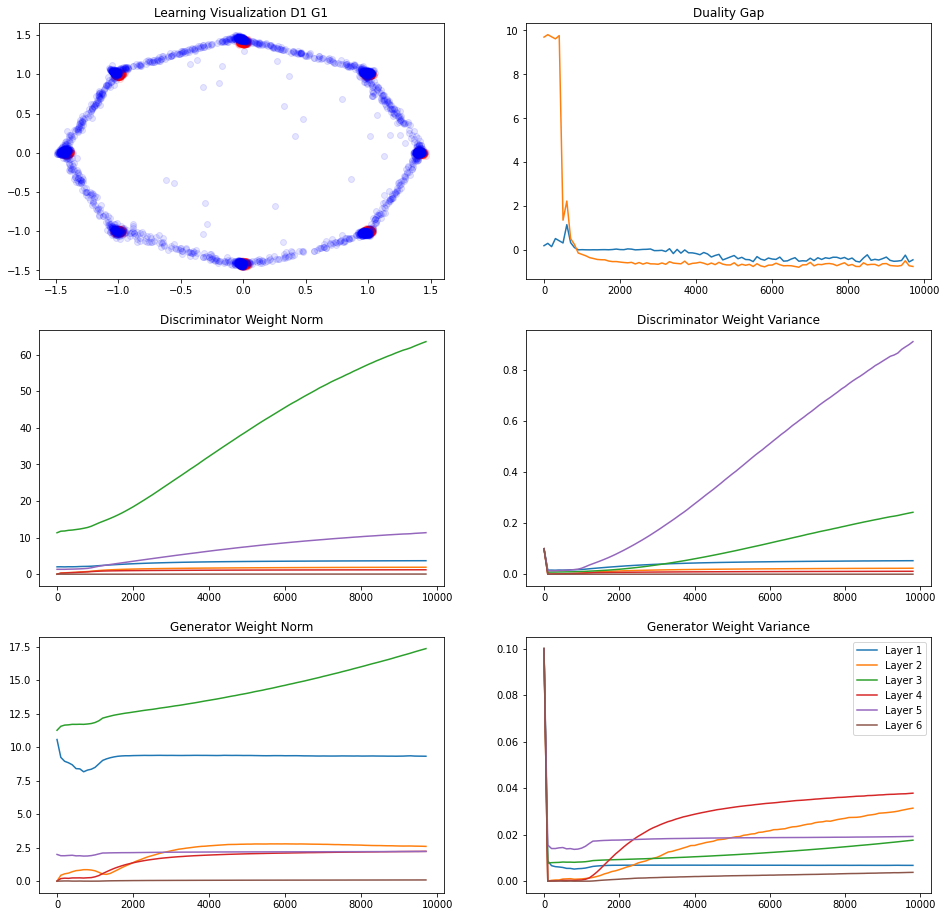

240/250 [===========================>..] - ETA: 0sVanilla   Duality GAP :  -0.3872736
L Random  Duality Gap :  -0.6714261


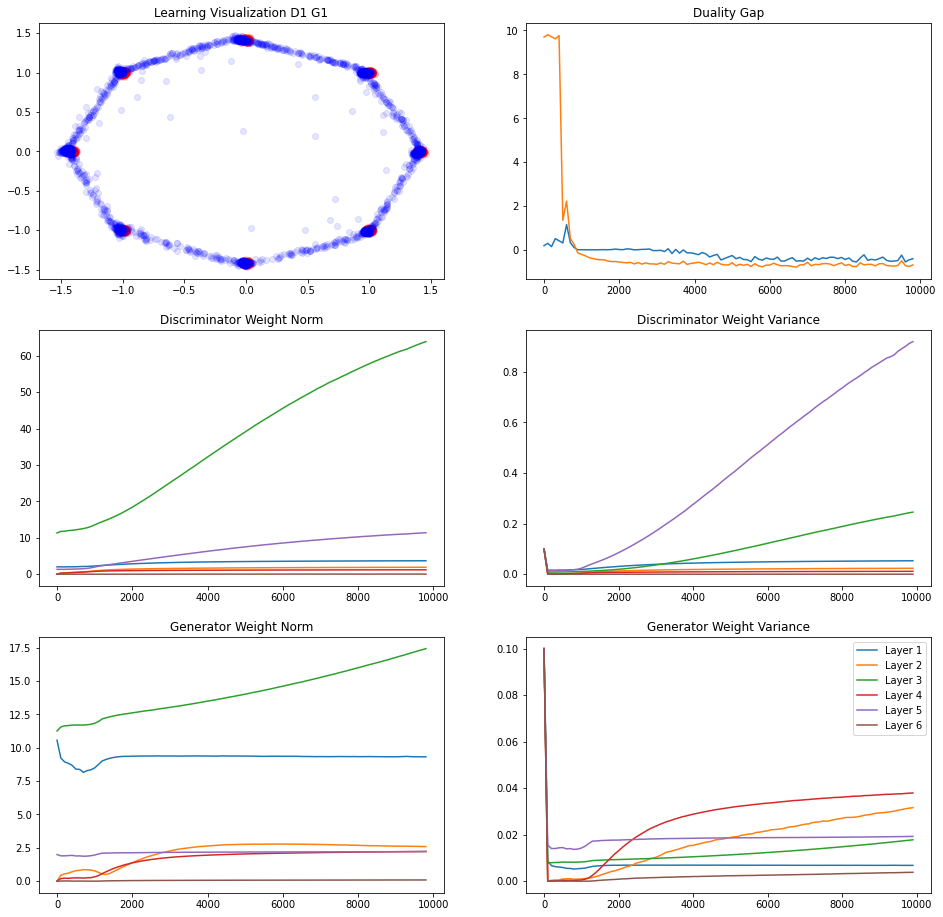

246/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.3899774
L Random  Duality Gap :  -0.70041686


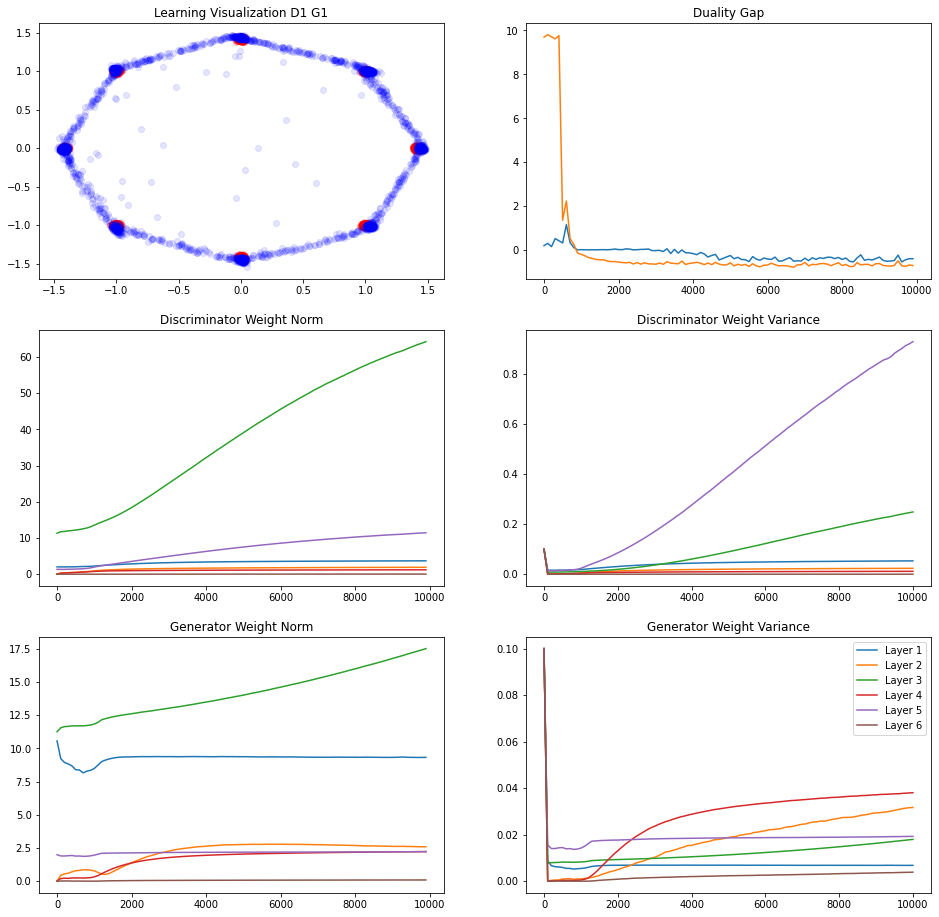

243/250 [============================>.] - ETA: 0sVanilla   Duality GAP :  -0.23075604
L Random  Duality Gap :  -0.55192876
10000/10001 [============================>.] - ETA: 0s 

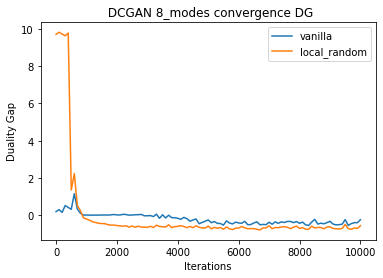

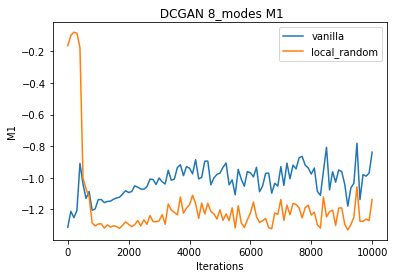

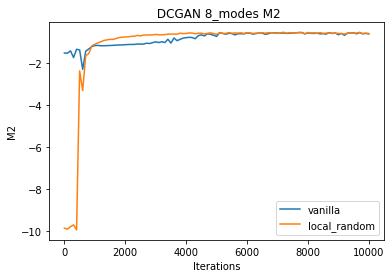

In [14]:

datasets      = ['8_modes']
# exp_types     = ['mode_collapse','convergence','divergence']
exp_types   = ['convergence']

total_data    = {}
epochs        = 10001
save_interval = 100
batch_size    = 128

model_data    = {}
for dataset in datasets:
    
    trials={}
    
    for setting in exp_types:
      
      models = {
      'DCGAN':DCGAN()
      } 

      for model in models.keys():
          print('--'*50+'\n\t\t{} {} {}\n'.format(dataset,model,setting)+'--'*50)
          save_path = './Experiments/{}/{}/{}'.format(dataset,model,setting)
          print(save_path)
          # save_path = './Experiments/{}/{}/{}'.format(dataset,model,setting)
          os.makedirs(save_path,exist_ok = True)               
          x_axis = [i for i in range(0,epochs,save_interval)]
          M1[model+'-vanilla-'+setting]=[]
          M2[model+'-vanilla-'+setting]=[]
          duality_gaps[model+'-vanilla-'+setting]=[]
          
          M1[model+'-local_random-'+setting]=[]
          M2[model+'-local_random-'+setting]=[]
          duality_gaps[model+'-local_random-'+setting]=[]
          
          models[model].configure_setting(setting)
          #train the model
          models[model].train(epochs=epochs, batch_size=batch_size, save_interval=save_interval,dataset=dataset,save_path=save_path)
          
          
          plt.figure()
          plt.title(' {} {} {} DG'.format(model,dataset,setting))
          plt.xlabel('Iterations')
          plt.ylabel('Duality Gap')
          plt.plot(x_axis,duality_gaps[model+'-vanilla-'+setting],label='vanilla')
          plt.plot(x_axis,duality_gaps[model+'-local_random-'+setting],label='local_random')
          plt.legend()
          plt.savefig(save_path+'/DG.png',bbox_inches='tight')
          
          
          plt.figure()
          plt.title(' {} {} M1'.format(model,dataset,setting))
          plt.xlabel('Iterations')
          plt.ylabel('M1')
          plt.plot(x_axis,M1[model+'-vanilla-'+setting],label='vanilla')
          plt.plot(x_axis,M1[model+'-local_random-'+setting],label='local_random')
          plt.legend()
          plt.savefig(save_path+'/M1.png',bbox_inches='tight')
          
          plt.figure()
          plt.title(' {} {} M2'.format(model,dataset,setting))
          plt.xlabel('Iterations')
          plt.ylabel('M2')
          plt.plot(x_axis,M2[model+'-vanilla-'+setting],label='vanilla')
          plt.plot(x_axis,M2[model+'-local_random-'+setting],label='local_random')
          plt.legend()
          plt.savefig(save_path+'/M2.png',bbox_inches='tight')
          
          trials['{}'.format(model)]={
              'DG':duality_gaps,
              'M1' :M1,
              'M2' :M2
          } 
          
    model_data[dataset]=models    
    total_data[dataset]=trials